In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

from utils import mnist, plot_graphs, plot_mnist
import numpy as np
import os 

%matplotlib inline

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [3]:
root_folder = 'FC_GAN_results'
fixed_folder = root_folder + '/Fixed_results'

if os.path.isdir(root_folder):
    !rm -r $root_folder
os.mkdir(root_folder)
os.mkdir(fixed_folder)

In [4]:
mnist_tanh = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
           ])

In [5]:
def one_hot(y, batch_size):
    oh = torch.zeros([batch_size, class_size])
    for st,idx in enumerate(y):          
        oh[st][idx] = 1 
    return oh   

In [6]:
lr = 0.0001
prior_size = 100
class_size = 10
train_epoch = 1000
batch_size = 50
train_loader, valid_loader, test_loader = mnist(batch_size=batch_size, valid=10000, transform=mnist_tanh)

fixed_data, fixed_cl = next(iter(test_loader))
fixed_z = torch.randn((50, 100))
fixed_oh = one_hot(y=fixed_cl[:50], batch_size=50)
fixed_h = torch.cat((fixed_z, fixed_oh), 1) 

In [7]:
class FullyConnected(nn.Module):
    def __init__(self, sizes, dropout=False, activation_fn=nn.Tanh(), flatten=False, last_fn=None):
        super(FullyConnected, self).__init__()
        layers = []
        self.flatten = flatten
        for i in range(len(sizes) - 2):
            layers.append(nn.Linear(sizes[i], sizes[i+1]))
            if dropout:
                layers.append(nn.Dropout(dropout))
            layers.append(activation_fn) # нам не нужен дропаут и фнкция активации в последнем слое
        else: 
            layers.append(nn.Linear(sizes[-2], sizes[-1]))
        if last_fn is not None:
            layers.append(last_fn)
        self.model = nn.Sequential(*layers)
        
    def forward(self, x):
        if self.flatten:
            x = x.view(x.shape[0], -1)
        return self.model(x)

In [8]:
G = FullyConnected([prior_size + class_size, 256, 512, 1024, 28*28], dropout=0.5, activation_fn=nn.LeakyReLU(0.2), last_fn=nn.Tanh())
D = FullyConnected([28*28 + class_size, 1024, 512, 256, 1], dropout=0.5, activation_fn=nn.LeakyReLU(0.2), flatten=True)

G_optimizer = optim.Adam(G.parameters(), lr=lr)
D_optimizer = optim.Adam(D.parameters(), lr=lr)

In [9]:
train_log = {'G': [], 'D': []}
test_log = {'G': [], 'D': []}

In [10]:
batch_zeros = torch.zeros((batch_size, 1))
batch_ones = torch.ones((batch_size, 1))

In [11]:
def train(epoch, G, D, log=None):
    train_size = len(train_loader.sampler)
    for batch_idx, (data, cl) in enumerate(train_loader):
        
        # train D
        D.zero_grad()
        G.zero_grad()
        
        z = torch.randn((batch_size, prior_size))
        oh = one_hot(y=cl, batch_size=batch_size)
        z_oh = torch.cat((z, oh), 1)     
        #print ('data=', data.shape)
        data_oh = torch.cat((data.view(-1, 28*28), oh), 1)
        fake_oh = torch.cat((G(z_oh), oh), 1)
                
        fake_pred = D(fake_oh)
        true_pred = D(data_oh)
        
        fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros)
        true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones)
        
        D_loss = 0.5*(fake_loss + true_loss)
        
        D_loss.backward()
        D_optimizer.step()
        
        # train G
        D.zero_grad()
        G.zero_grad()
                
        fake_oh = torch.cat((G(z_oh), oh), 1)
        fake_pred = D(fake_oh)
        G_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_ones)
        
        G_loss.backward()        
        G_optimizer.step()
            
        if batch_idx % 100 == 0:
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = 'G: {:.4f}, D: {:.4f}'.format(G_loss.item(), D_loss.item())
            print(line + losses)
            
    else:
        batch_idx += 1
        line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
            epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
        losses = 'G: {:.4f}, D: {:.4f}'.format(G_loss.item(), D_loss.item())
        print(line + losses)
        log['G'].append(G_loss.item())
        log['D'].append(D_loss.item())

In [12]:
def test(G, D, loader, epoch, log=None):
    test_size = len(loader)
    G_loss = 0.
    D_loss = 0.
    test_loss = {'G': 0., 'D': 0.}
    with torch.no_grad():
        for data, cl in loader:
            
            z = torch.randn((batch_size, prior_size))
            oh = one_hot(y=cl, batch_size=batch_size)
            z_oh = torch.cat((z, oh), 1)         
            data_oh = torch.cat((data.view(-1, 28*28), oh), 1)
            fake_oh = torch.cat((G(z_oh), oh), 1)
        
            fake_pred = D(fake_oh)
            true_pred = D(data_oh)
        
            fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros).item()
            true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones).item()
            
            D_loss += 0.5*(fake_loss + true_loss)
            G_loss += F.binary_cross_entropy_with_logits(fake_pred, batch_ones).item()
    
    G_loss /= test_size
    D_loss /= test_size
    
    fixed_gen = G(fixed_h).data.numpy().reshape(50, 1, 28, 28)
    plot_mnist(fixed_gen, (5, 10), True, fixed_folder + '/%03d.png' % epoch)
    report = 'Test losses. G: {:.4f}, D: {:.4f}'.format(G_loss, D_loss)
    print(report)

Train Epoch: 1 [0/50000 (0%)]	Losses G: 0.6780, D: 0.6978
Train Epoch: 1 [5000/50000 (10%)]	Losses G: 1.5672, D: 0.3851
Train Epoch: 1 [10000/50000 (20%)]	Losses G: 1.6914, D: 0.3903
Train Epoch: 1 [15000/50000 (30%)]	Losses G: 1.3340, D: 0.5488
Train Epoch: 1 [20000/50000 (40%)]	Losses G: 2.2466, D: 0.2265
Train Epoch: 1 [25000/50000 (50%)]	Losses G: 1.8111, D: 0.4895
Train Epoch: 1 [30000/50000 (60%)]	Losses G: 1.4028, D: 0.3988
Train Epoch: 1 [35000/50000 (70%)]	Losses G: 1.3041, D: 0.6551
Train Epoch: 1 [40000/50000 (80%)]	Losses G: 1.2525, D: 0.5341
Train Epoch: 1 [45000/50000 (90%)]	Losses G: 2.0949, D: 0.3448
Train Epoch: 1 [50000/50000 (100%)]	Losses G: 0.4958, D: 0.9064


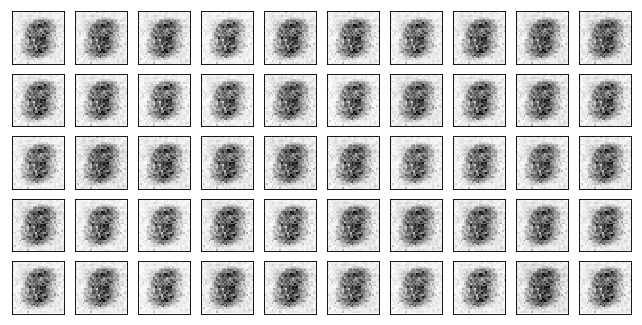

Test losses. G: 0.1903, D: 1.0568
Train Epoch: 2 [0/50000 (0%)]	Losses G: 0.5967, D: 0.8428
Train Epoch: 2 [5000/50000 (10%)]	Losses G: 2.0418, D: 0.3648
Train Epoch: 2 [10000/50000 (20%)]	Losses G: 2.7221, D: 0.2808
Train Epoch: 2 [15000/50000 (30%)]	Losses G: 1.4086, D: 0.5252
Train Epoch: 2 [20000/50000 (40%)]	Losses G: 2.7039, D: 0.1984
Train Epoch: 2 [25000/50000 (50%)]	Losses G: 3.2312, D: 0.2137
Train Epoch: 2 [30000/50000 (60%)]	Losses G: 3.2465, D: 0.0850
Train Epoch: 2 [35000/50000 (70%)]	Losses G: 5.4568, D: 0.1103
Train Epoch: 2 [40000/50000 (80%)]	Losses G: 3.6464, D: 0.1028
Train Epoch: 2 [45000/50000 (90%)]	Losses G: 3.6554, D: 0.2606
Train Epoch: 2 [50000/50000 (100%)]	Losses G: 3.9405, D: 0.1319


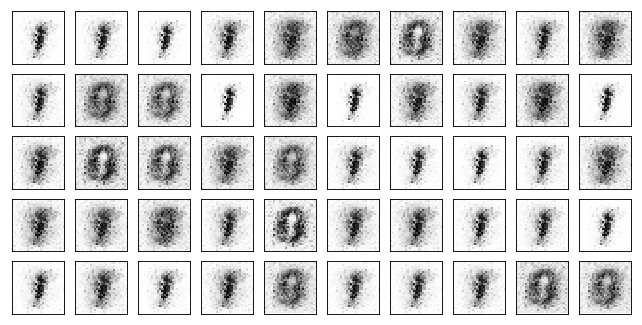

Test losses. G: 3.7875, D: 0.0167
Train Epoch: 3 [0/50000 (0%)]	Losses G: 3.5451, D: 0.0558
Train Epoch: 3 [5000/50000 (10%)]	Losses G: 3.7599, D: 0.1201
Train Epoch: 3 [10000/50000 (20%)]	Losses G: 4.9174, D: 0.1664
Train Epoch: 3 [15000/50000 (30%)]	Losses G: 3.4883, D: 0.1495
Train Epoch: 3 [20000/50000 (40%)]	Losses G: 3.0732, D: 0.1520
Train Epoch: 3 [25000/50000 (50%)]	Losses G: 3.9964, D: 0.1184
Train Epoch: 3 [30000/50000 (60%)]	Losses G: 3.8619, D: 0.0964
Train Epoch: 3 [35000/50000 (70%)]	Losses G: 4.6437, D: 0.3492
Train Epoch: 3 [40000/50000 (80%)]	Losses G: 4.7648, D: 0.2366
Train Epoch: 3 [45000/50000 (90%)]	Losses G: 4.0119, D: 0.1023
Train Epoch: 3 [50000/50000 (100%)]	Losses G: 4.1601, D: 0.0765


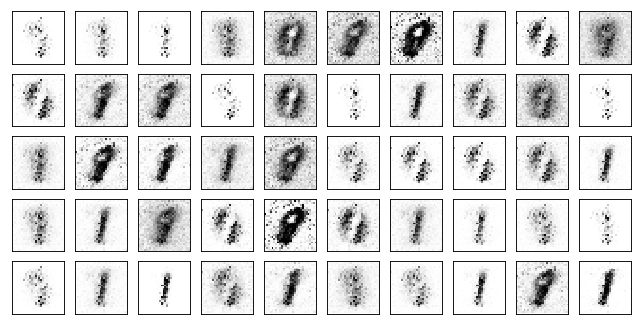

Test losses. G: 3.8432, D: 0.0306
Train Epoch: 4 [0/50000 (0%)]	Losses G: 4.2059, D: 0.1983
Train Epoch: 4 [5000/50000 (10%)]	Losses G: 3.4558, D: 0.1078
Train Epoch: 4 [10000/50000 (20%)]	Losses G: 4.6629, D: 0.0753
Train Epoch: 4 [15000/50000 (30%)]	Losses G: 3.1977, D: 0.1455
Train Epoch: 4 [20000/50000 (40%)]	Losses G: 3.4766, D: 0.0914
Train Epoch: 4 [25000/50000 (50%)]	Losses G: 4.1444, D: 0.0862
Train Epoch: 4 [30000/50000 (60%)]	Losses G: 4.2239, D: 0.2251
Train Epoch: 4 [35000/50000 (70%)]	Losses G: 4.2369, D: 0.1062
Train Epoch: 4 [40000/50000 (80%)]	Losses G: 3.9226, D: 0.2857
Train Epoch: 4 [45000/50000 (90%)]	Losses G: 3.3982, D: 0.2548
Train Epoch: 4 [50000/50000 (100%)]	Losses G: 4.2507, D: 0.2148


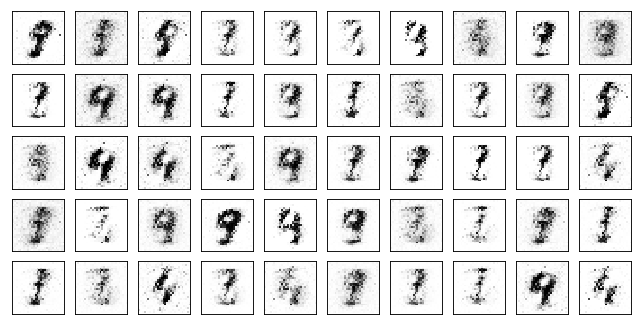

Test losses. G: 3.6978, D: 0.0808
Train Epoch: 5 [0/50000 (0%)]	Losses G: 4.3587, D: 0.1998
Train Epoch: 5 [5000/50000 (10%)]	Losses G: 3.5073, D: 0.1823
Train Epoch: 5 [10000/50000 (20%)]	Losses G: 2.9750, D: 0.2071
Train Epoch: 5 [15000/50000 (30%)]	Losses G: 3.0303, D: 0.2793
Train Epoch: 5 [20000/50000 (40%)]	Losses G: 3.4143, D: 0.1096
Train Epoch: 5 [25000/50000 (50%)]	Losses G: 3.6537, D: 0.1776
Train Epoch: 5 [30000/50000 (60%)]	Losses G: 4.5546, D: 0.1424
Train Epoch: 5 [35000/50000 (70%)]	Losses G: 3.1581, D: 0.1495
Train Epoch: 5 [40000/50000 (80%)]	Losses G: 2.9762, D: 0.2357
Train Epoch: 5 [45000/50000 (90%)]	Losses G: 3.5265, D: 0.2075
Train Epoch: 5 [50000/50000 (100%)]	Losses G: 3.3791, D: 0.2318


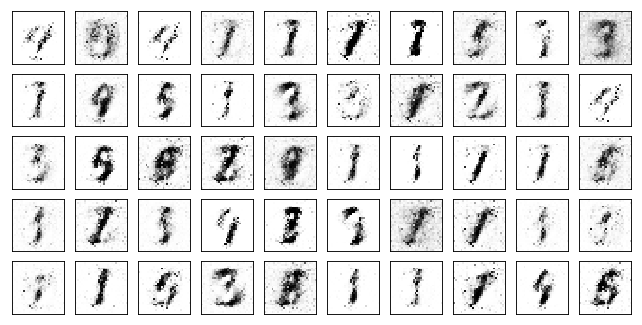

Test losses. G: 3.1540, D: 0.0739
Train Epoch: 6 [0/50000 (0%)]	Losses G: 4.3283, D: 0.1816
Train Epoch: 6 [5000/50000 (10%)]	Losses G: 3.6896, D: 0.1556
Train Epoch: 6 [10000/50000 (20%)]	Losses G: 3.9288, D: 0.1882
Train Epoch: 6 [15000/50000 (30%)]	Losses G: 2.9381, D: 0.2041
Train Epoch: 6 [20000/50000 (40%)]	Losses G: 3.1659, D: 0.2282
Train Epoch: 6 [25000/50000 (50%)]	Losses G: 2.9981, D: 0.2519
Train Epoch: 6 [30000/50000 (60%)]	Losses G: 4.0339, D: 0.1852
Train Epoch: 6 [35000/50000 (70%)]	Losses G: 3.3509, D: 0.0989
Train Epoch: 6 [40000/50000 (80%)]	Losses G: 3.7410, D: 0.1314
Train Epoch: 6 [45000/50000 (90%)]	Losses G: 4.8671, D: 0.2119
Train Epoch: 6 [50000/50000 (100%)]	Losses G: 4.0495, D: 0.1061


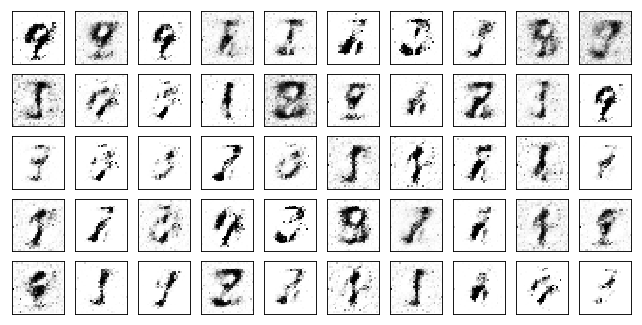

Test losses. G: 3.8492, D: 0.1072
Train Epoch: 7 [0/50000 (0%)]	Losses G: 3.7993, D: 0.2978
Train Epoch: 7 [5000/50000 (10%)]	Losses G: 3.5936, D: 0.1704
Train Epoch: 7 [10000/50000 (20%)]	Losses G: 3.6764, D: 0.1728
Train Epoch: 7 [15000/50000 (30%)]	Losses G: 3.2341, D: 0.2522
Train Epoch: 7 [20000/50000 (40%)]	Losses G: 3.3126, D: 0.2989
Train Epoch: 7 [25000/50000 (50%)]	Losses G: 2.8638, D: 0.3687
Train Epoch: 7 [30000/50000 (60%)]	Losses G: 2.2502, D: 0.3275
Train Epoch: 7 [35000/50000 (70%)]	Losses G: 2.4218, D: 0.3500
Train Epoch: 7 [40000/50000 (80%)]	Losses G: 2.7781, D: 0.2101
Train Epoch: 7 [45000/50000 (90%)]	Losses G: 2.5575, D: 0.2112
Train Epoch: 7 [50000/50000 (100%)]	Losses G: 2.1703, D: 0.2066


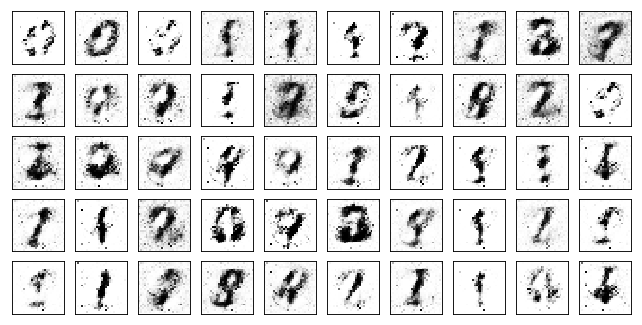

Test losses. G: 2.0541, D: 0.1370
Train Epoch: 8 [0/50000 (0%)]	Losses G: 2.3951, D: 0.2245
Train Epoch: 8 [5000/50000 (10%)]	Losses G: 2.4225, D: 0.2905
Train Epoch: 8 [10000/50000 (20%)]	Losses G: 3.1248, D: 0.2320
Train Epoch: 8 [15000/50000 (30%)]	Losses G: 3.1538, D: 0.2350
Train Epoch: 8 [20000/50000 (40%)]	Losses G: 4.3045, D: 0.1772
Train Epoch: 8 [25000/50000 (50%)]	Losses G: 3.0406, D: 0.2406
Train Epoch: 8 [30000/50000 (60%)]	Losses G: 2.7845, D: 0.2188
Train Epoch: 8 [35000/50000 (70%)]	Losses G: 3.7987, D: 0.3090
Train Epoch: 8 [40000/50000 (80%)]	Losses G: 2.5863, D: 0.2935
Train Epoch: 8 [45000/50000 (90%)]	Losses G: 2.8956, D: 0.2234
Train Epoch: 8 [50000/50000 (100%)]	Losses G: 2.5885, D: 0.1914


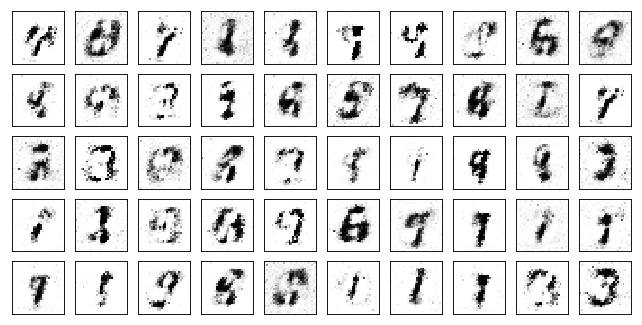

Test losses. G: 2.2555, D: 0.1315
Train Epoch: 9 [0/50000 (0%)]	Losses G: 2.4513, D: 0.1952
Train Epoch: 9 [5000/50000 (10%)]	Losses G: 3.5597, D: 0.1937
Train Epoch: 9 [10000/50000 (20%)]	Losses G: 2.8420, D: 0.2512
Train Epoch: 9 [15000/50000 (30%)]	Losses G: 1.8080, D: 0.2782
Train Epoch: 9 [20000/50000 (40%)]	Losses G: 2.4311, D: 0.4129
Train Epoch: 9 [25000/50000 (50%)]	Losses G: 2.5611, D: 0.2302
Train Epoch: 9 [30000/50000 (60%)]	Losses G: 2.7317, D: 0.2965
Train Epoch: 9 [35000/50000 (70%)]	Losses G: 2.7004, D: 0.2616
Train Epoch: 9 [40000/50000 (80%)]	Losses G: 2.0971, D: 0.3861
Train Epoch: 9 [45000/50000 (90%)]	Losses G: 2.7858, D: 0.2922
Train Epoch: 9 [50000/50000 (100%)]	Losses G: 2.5657, D: 0.1991


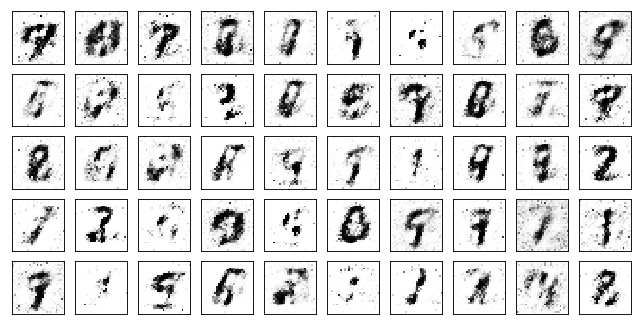

Test losses. G: 2.5457, D: 0.1090
Train Epoch: 10 [0/50000 (0%)]	Losses G: 3.1138, D: 0.2358
Train Epoch: 10 [5000/50000 (10%)]	Losses G: 2.7755, D: 0.4746
Train Epoch: 10 [10000/50000 (20%)]	Losses G: 2.5201, D: 0.3409
Train Epoch: 10 [15000/50000 (30%)]	Losses G: 3.1759, D: 0.1919
Train Epoch: 10 [20000/50000 (40%)]	Losses G: 2.8909, D: 0.2441
Train Epoch: 10 [25000/50000 (50%)]	Losses G: 2.7960, D: 0.2613
Train Epoch: 10 [30000/50000 (60%)]	Losses G: 2.8215, D: 0.1729
Train Epoch: 10 [35000/50000 (70%)]	Losses G: 2.2968, D: 0.2330
Train Epoch: 10 [40000/50000 (80%)]	Losses G: 2.7753, D: 0.2494
Train Epoch: 10 [45000/50000 (90%)]	Losses G: 2.3234, D: 0.4129
Train Epoch: 10 [50000/50000 (100%)]	Losses G: 2.0075, D: 0.3242


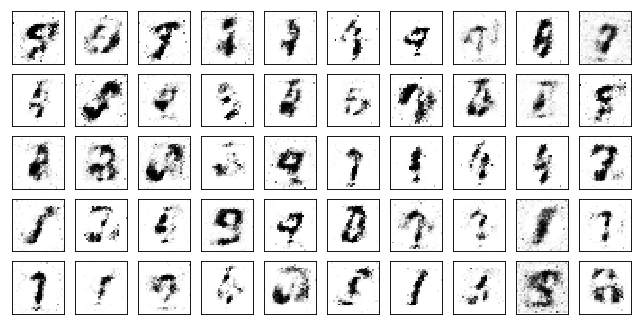

Test losses. G: 1.7498, D: 0.2006
Train Epoch: 11 [0/50000 (0%)]	Losses G: 2.0501, D: 0.3735
Train Epoch: 11 [5000/50000 (10%)]	Losses G: 2.8843, D: 0.2313
Train Epoch: 11 [10000/50000 (20%)]	Losses G: 3.1796, D: 0.1647
Train Epoch: 11 [15000/50000 (30%)]	Losses G: 3.1037, D: 0.2349
Train Epoch: 11 [20000/50000 (40%)]	Losses G: 2.8950, D: 0.1727
Train Epoch: 11 [25000/50000 (50%)]	Losses G: 2.9599, D: 0.2184
Train Epoch: 11 [30000/50000 (60%)]	Losses G: 3.0642, D: 0.2975
Train Epoch: 11 [35000/50000 (70%)]	Losses G: 3.0207, D: 0.3272
Train Epoch: 11 [40000/50000 (80%)]	Losses G: 2.2016, D: 0.2809
Train Epoch: 11 [45000/50000 (90%)]	Losses G: 2.6291, D: 0.2137
Train Epoch: 11 [50000/50000 (100%)]	Losses G: 3.0824, D: 0.2538


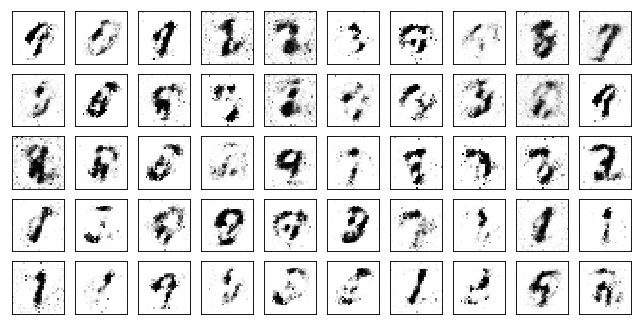

Test losses. G: 2.9935, D: 0.1228
Train Epoch: 12 [0/50000 (0%)]	Losses G: 3.1463, D: 0.2723
Train Epoch: 12 [5000/50000 (10%)]	Losses G: 2.2323, D: 0.2455
Train Epoch: 12 [10000/50000 (20%)]	Losses G: 2.4662, D: 0.2107
Train Epoch: 12 [15000/50000 (30%)]	Losses G: 2.6619, D: 0.1894
Train Epoch: 12 [20000/50000 (40%)]	Losses G: 3.0999, D: 0.2076
Train Epoch: 12 [25000/50000 (50%)]	Losses G: 3.1678, D: 0.1597
Train Epoch: 12 [30000/50000 (60%)]	Losses G: 3.0388, D: 0.3239
Train Epoch: 12 [35000/50000 (70%)]	Losses G: 2.6818, D: 0.3622
Train Epoch: 12 [40000/50000 (80%)]	Losses G: 2.6990, D: 0.3093
Train Epoch: 12 [45000/50000 (90%)]	Losses G: 2.2622, D: 0.2278
Train Epoch: 12 [50000/50000 (100%)]	Losses G: 2.4906, D: 0.3143


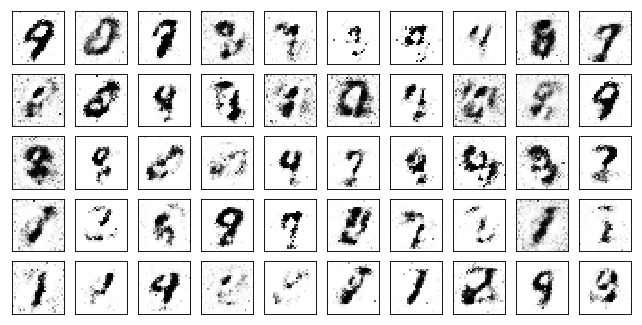

Test losses. G: 2.1569, D: 0.1702
Train Epoch: 13 [0/50000 (0%)]	Losses G: 2.7230, D: 0.2354
Train Epoch: 13 [5000/50000 (10%)]	Losses G: 2.9801, D: 0.3250
Train Epoch: 13 [10000/50000 (20%)]	Losses G: 2.8608, D: 0.2919
Train Epoch: 13 [15000/50000 (30%)]	Losses G: 2.8966, D: 0.3088
Train Epoch: 13 [20000/50000 (40%)]	Losses G: 2.8285, D: 0.2429
Train Epoch: 13 [25000/50000 (50%)]	Losses G: 1.9677, D: 0.4489
Train Epoch: 13 [30000/50000 (60%)]	Losses G: 2.3301, D: 0.4311
Train Epoch: 13 [35000/50000 (70%)]	Losses G: 2.8997, D: 0.2284
Train Epoch: 13 [40000/50000 (80%)]	Losses G: 2.7894, D: 0.3685
Train Epoch: 13 [45000/50000 (90%)]	Losses G: 2.5486, D: 0.3360
Train Epoch: 13 [50000/50000 (100%)]	Losses G: 2.9191, D: 0.2901


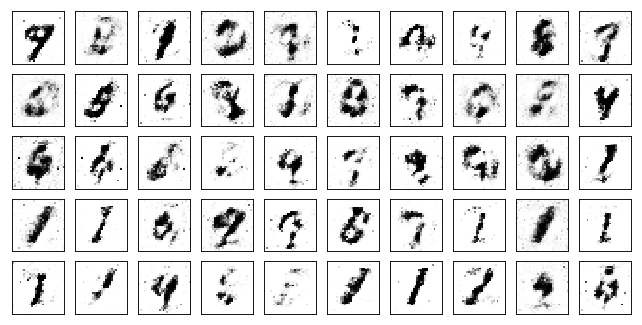

Test losses. G: 2.7151, D: 0.1317
Train Epoch: 14 [0/50000 (0%)]	Losses G: 3.2470, D: 0.1827
Train Epoch: 14 [5000/50000 (10%)]	Losses G: 2.6350, D: 0.2863
Train Epoch: 14 [10000/50000 (20%)]	Losses G: 2.0365, D: 0.3616
Train Epoch: 14 [15000/50000 (30%)]	Losses G: 2.4092, D: 0.3526
Train Epoch: 14 [20000/50000 (40%)]	Losses G: 2.5017, D: 0.3842
Train Epoch: 14 [25000/50000 (50%)]	Losses G: 1.8290, D: 0.3147
Train Epoch: 14 [30000/50000 (60%)]	Losses G: 2.2165, D: 0.3676
Train Epoch: 14 [35000/50000 (70%)]	Losses G: 1.9732, D: 0.2457
Train Epoch: 14 [40000/50000 (80%)]	Losses G: 1.5134, D: 0.2802
Train Epoch: 14 [45000/50000 (90%)]	Losses G: 2.0084, D: 0.3619
Train Epoch: 14 [50000/50000 (100%)]	Losses G: 2.2436, D: 0.3422


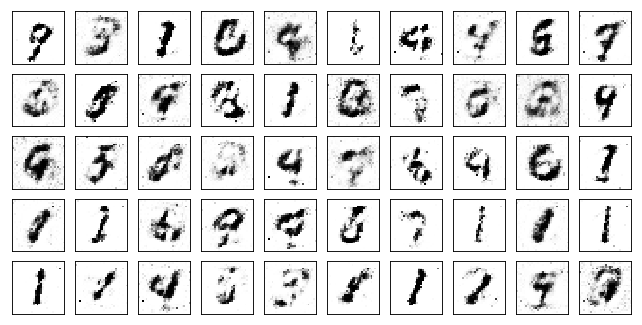

Test losses. G: 2.1636, D: 0.2512
Train Epoch: 15 [0/50000 (0%)]	Losses G: 1.8446, D: 0.3294
Train Epoch: 15 [5000/50000 (10%)]	Losses G: 2.3591, D: 0.3307
Train Epoch: 15 [10000/50000 (20%)]	Losses G: 2.8156, D: 0.2882
Train Epoch: 15 [15000/50000 (30%)]	Losses G: 2.3479, D: 0.3765
Train Epoch: 15 [20000/50000 (40%)]	Losses G: 2.7375, D: 0.3950
Train Epoch: 15 [25000/50000 (50%)]	Losses G: 2.4802, D: 0.2419
Train Epoch: 15 [30000/50000 (60%)]	Losses G: 2.0572, D: 0.3586
Train Epoch: 15 [35000/50000 (70%)]	Losses G: 1.9041, D: 0.3084
Train Epoch: 15 [40000/50000 (80%)]	Losses G: 2.3134, D: 0.3443
Train Epoch: 15 [45000/50000 (90%)]	Losses G: 2.8005, D: 0.3316
Train Epoch: 15 [50000/50000 (100%)]	Losses G: 2.5457, D: 0.3402


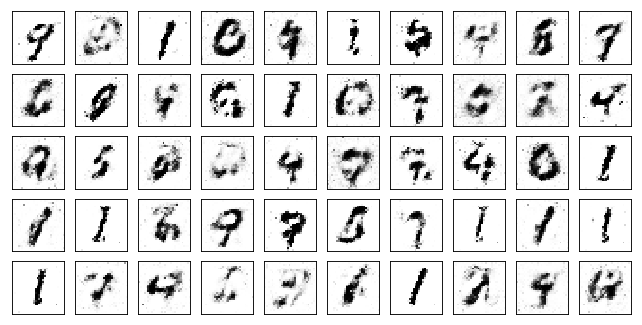

Test losses. G: 2.1321, D: 0.2501
Train Epoch: 16 [0/50000 (0%)]	Losses G: 2.2647, D: 0.3890
Train Epoch: 16 [5000/50000 (10%)]	Losses G: 1.9689, D: 0.4079
Train Epoch: 16 [10000/50000 (20%)]	Losses G: 1.7006, D: 0.4717
Train Epoch: 16 [15000/50000 (30%)]	Losses G: 2.2758, D: 0.3111
Train Epoch: 16 [20000/50000 (40%)]	Losses G: 2.2304, D: 0.2899
Train Epoch: 16 [25000/50000 (50%)]	Losses G: 1.7656, D: 0.3569
Train Epoch: 16 [30000/50000 (60%)]	Losses G: 1.6761, D: 0.4232
Train Epoch: 16 [35000/50000 (70%)]	Losses G: 1.8581, D: 0.3996
Train Epoch: 16 [40000/50000 (80%)]	Losses G: 2.0947, D: 0.3817
Train Epoch: 16 [45000/50000 (90%)]	Losses G: 1.9556, D: 0.2286
Train Epoch: 16 [50000/50000 (100%)]	Losses G: 2.1045, D: 0.3576


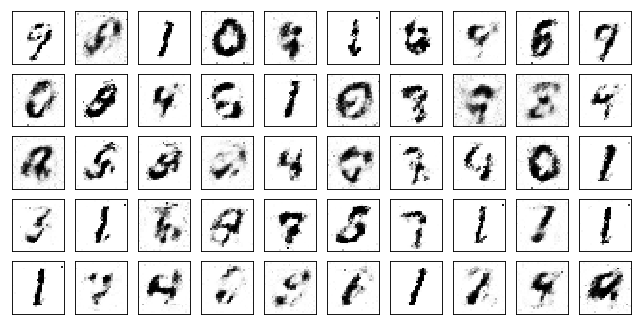

Test losses. G: 2.2143, D: 0.2335
Train Epoch: 17 [0/50000 (0%)]	Losses G: 2.4304, D: 0.2667
Train Epoch: 17 [5000/50000 (10%)]	Losses G: 1.8921, D: 0.3119
Train Epoch: 17 [10000/50000 (20%)]	Losses G: 2.1276, D: 0.4363
Train Epoch: 17 [15000/50000 (30%)]	Losses G: 2.3547, D: 0.3162
Train Epoch: 17 [20000/50000 (40%)]	Losses G: 2.0926, D: 0.3833
Train Epoch: 17 [25000/50000 (50%)]	Losses G: 2.1421, D: 0.3666
Train Epoch: 17 [30000/50000 (60%)]	Losses G: 2.0377, D: 0.4075
Train Epoch: 17 [35000/50000 (70%)]	Losses G: 1.8030, D: 0.4575
Train Epoch: 17 [40000/50000 (80%)]	Losses G: 1.5537, D: 0.5657
Train Epoch: 17 [45000/50000 (90%)]	Losses G: 1.7394, D: 0.3518
Train Epoch: 17 [50000/50000 (100%)]	Losses G: 1.7491, D: 0.3111


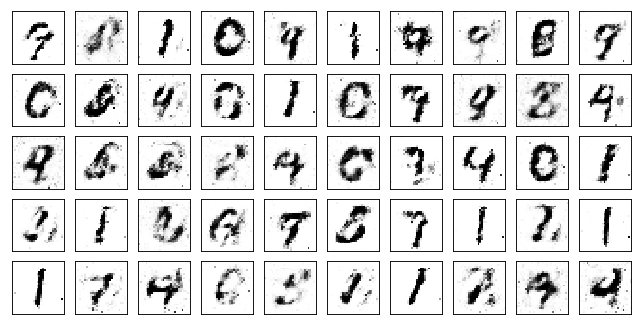

Test losses. G: 1.6167, D: 0.2405
Train Epoch: 18 [0/50000 (0%)]	Losses G: 1.5859, D: 0.3465
Train Epoch: 18 [5000/50000 (10%)]	Losses G: 1.6568, D: 0.4659
Train Epoch: 18 [10000/50000 (20%)]	Losses G: 1.5728, D: 0.4918
Train Epoch: 18 [15000/50000 (30%)]	Losses G: 1.7753, D: 0.4491
Train Epoch: 18 [20000/50000 (40%)]	Losses G: 2.1549, D: 0.4219
Train Epoch: 18 [25000/50000 (50%)]	Losses G: 1.8611, D: 0.3874
Train Epoch: 18 [30000/50000 (60%)]	Losses G: 1.5451, D: 0.4075
Train Epoch: 18 [35000/50000 (70%)]	Losses G: 2.3724, D: 0.3313
Train Epoch: 18 [40000/50000 (80%)]	Losses G: 1.8901, D: 0.2584
Train Epoch: 18 [45000/50000 (90%)]	Losses G: 2.0519, D: 0.3969
Train Epoch: 18 [50000/50000 (100%)]	Losses G: 1.7539, D: 0.4813


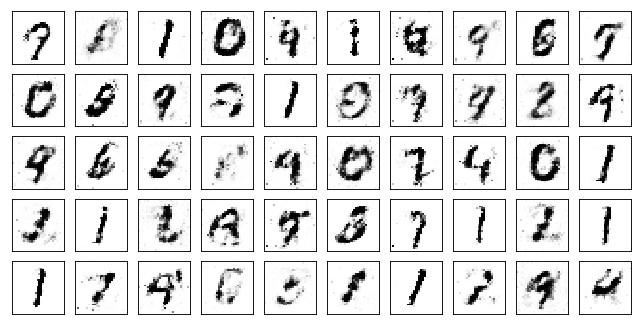

Test losses. G: 1.5494, D: 0.3432
Train Epoch: 19 [0/50000 (0%)]	Losses G: 1.5991, D: 0.4653
Train Epoch: 19 [5000/50000 (10%)]	Losses G: 1.9625, D: 0.4120
Train Epoch: 19 [10000/50000 (20%)]	Losses G: 1.5842, D: 0.3146
Train Epoch: 19 [15000/50000 (30%)]	Losses G: 2.7731, D: 0.4424
Train Epoch: 19 [20000/50000 (40%)]	Losses G: 1.7720, D: 0.3427
Train Epoch: 19 [25000/50000 (50%)]	Losses G: 1.8658, D: 0.2777
Train Epoch: 19 [30000/50000 (60%)]	Losses G: 1.7051, D: 0.4678
Train Epoch: 19 [35000/50000 (70%)]	Losses G: 2.1736, D: 0.3593
Train Epoch: 19 [40000/50000 (80%)]	Losses G: 2.5059, D: 0.4370
Train Epoch: 19 [45000/50000 (90%)]	Losses G: 2.2370, D: 0.4055
Train Epoch: 19 [50000/50000 (100%)]	Losses G: 1.7131, D: 0.3500


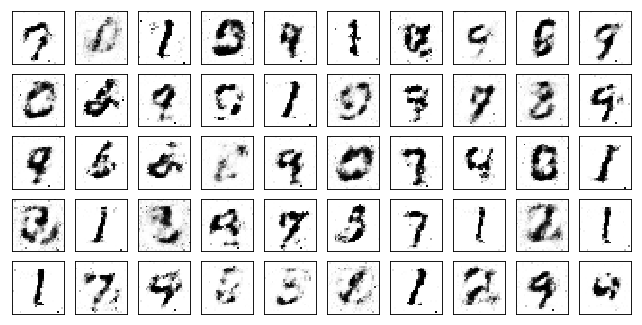

Test losses. G: 1.5487, D: 0.2798
Train Epoch: 20 [0/50000 (0%)]	Losses G: 1.6666, D: 0.3422
Train Epoch: 20 [5000/50000 (10%)]	Losses G: 1.8863, D: 0.4823
Train Epoch: 20 [10000/50000 (20%)]	Losses G: 1.4781, D: 0.4182
Train Epoch: 20 [15000/50000 (30%)]	Losses G: 1.7115, D: 0.3826
Train Epoch: 20 [20000/50000 (40%)]	Losses G: 1.4849, D: 0.4264
Train Epoch: 20 [25000/50000 (50%)]	Losses G: 1.6320, D: 0.4816
Train Epoch: 20 [30000/50000 (60%)]	Losses G: 2.0404, D: 0.4547
Train Epoch: 20 [35000/50000 (70%)]	Losses G: 1.9478, D: 0.2933
Train Epoch: 20 [40000/50000 (80%)]	Losses G: 1.9697, D: 0.4533
Train Epoch: 20 [45000/50000 (90%)]	Losses G: 1.6587, D: 0.4625
Train Epoch: 20 [50000/50000 (100%)]	Losses G: 1.2780, D: 0.4599


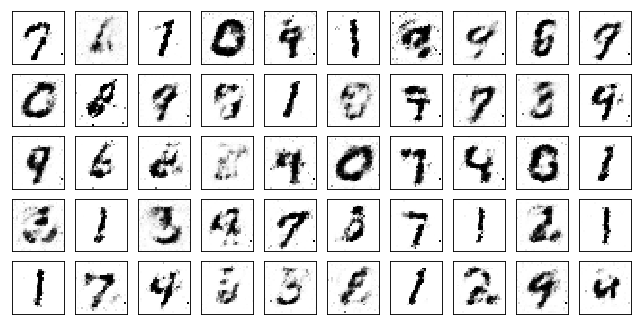

Test losses. G: 1.2601, D: 0.3452
Train Epoch: 21 [0/50000 (0%)]	Losses G: 1.1894, D: 0.4844
Train Epoch: 21 [5000/50000 (10%)]	Losses G: 1.6167, D: 0.4211
Train Epoch: 21 [10000/50000 (20%)]	Losses G: 1.8419, D: 0.3879
Train Epoch: 21 [15000/50000 (30%)]	Losses G: 1.8229, D: 0.3984
Train Epoch: 21 [20000/50000 (40%)]	Losses G: 1.6345, D: 0.4769
Train Epoch: 21 [25000/50000 (50%)]	Losses G: 1.8079, D: 0.3906
Train Epoch: 21 [30000/50000 (60%)]	Losses G: 1.5380, D: 0.4981
Train Epoch: 21 [35000/50000 (70%)]	Losses G: 1.8469, D: 0.4830
Train Epoch: 21 [40000/50000 (80%)]	Losses G: 1.4899, D: 0.3875
Train Epoch: 21 [45000/50000 (90%)]	Losses G: 1.7459, D: 0.4381
Train Epoch: 21 [50000/50000 (100%)]	Losses G: 1.7467, D: 0.3424


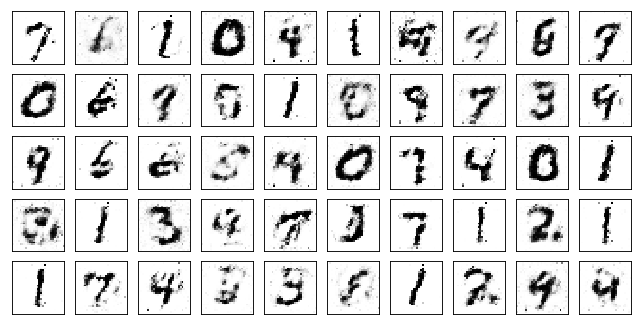

Test losses. G: 1.7792, D: 0.2629
Train Epoch: 22 [0/50000 (0%)]	Losses G: 1.8067, D: 0.3086
Train Epoch: 22 [5000/50000 (10%)]	Losses G: 1.8393, D: 0.3808
Train Epoch: 22 [10000/50000 (20%)]	Losses G: 1.5145, D: 0.3575
Train Epoch: 22 [15000/50000 (30%)]	Losses G: 1.2097, D: 0.5063
Train Epoch: 22 [20000/50000 (40%)]	Losses G: 1.7840, D: 0.4967
Train Epoch: 22 [25000/50000 (50%)]	Losses G: 1.6635, D: 0.4433
Train Epoch: 22 [30000/50000 (60%)]	Losses G: 1.6232, D: 0.3441
Train Epoch: 22 [35000/50000 (70%)]	Losses G: 1.2500, D: 0.5080
Train Epoch: 22 [40000/50000 (80%)]	Losses G: 1.2515, D: 0.5209
Train Epoch: 22 [45000/50000 (90%)]	Losses G: 1.9409, D: 0.4994
Train Epoch: 22 [50000/50000 (100%)]	Losses G: 1.9920, D: 0.4007


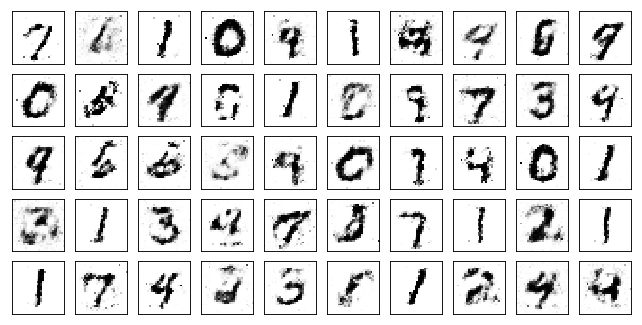

Test losses. G: 1.7722, D: 0.2738
Train Epoch: 23 [0/50000 (0%)]	Losses G: 1.6414, D: 0.3693
Train Epoch: 23 [5000/50000 (10%)]	Losses G: 1.6155, D: 0.4039
Train Epoch: 23 [10000/50000 (20%)]	Losses G: 1.3537, D: 0.5687
Train Epoch: 23 [15000/50000 (30%)]	Losses G: 1.5842, D: 0.4352
Train Epoch: 23 [20000/50000 (40%)]	Losses G: 1.4197, D: 0.4201
Train Epoch: 23 [25000/50000 (50%)]	Losses G: 1.4409, D: 0.6588
Train Epoch: 23 [30000/50000 (60%)]	Losses G: 1.6626, D: 0.4673
Train Epoch: 23 [35000/50000 (70%)]	Losses G: 1.7696, D: 0.4130
Train Epoch: 23 [40000/50000 (80%)]	Losses G: 1.6825, D: 0.3876
Train Epoch: 23 [45000/50000 (90%)]	Losses G: 1.8319, D: 0.5734
Train Epoch: 23 [50000/50000 (100%)]	Losses G: 1.4731, D: 0.4480


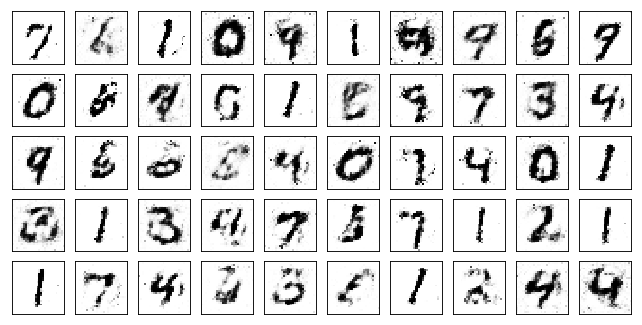

Test losses. G: 1.5292, D: 0.3893
Train Epoch: 24 [0/50000 (0%)]	Losses G: 1.7058, D: 0.4961
Train Epoch: 24 [5000/50000 (10%)]	Losses G: 1.6323, D: 0.3161
Train Epoch: 24 [10000/50000 (20%)]	Losses G: 1.4194, D: 0.4792
Train Epoch: 24 [15000/50000 (30%)]	Losses G: 1.3613, D: 0.4241
Train Epoch: 24 [20000/50000 (40%)]	Losses G: 1.4993, D: 0.4158
Train Epoch: 24 [25000/50000 (50%)]	Losses G: 1.5186, D: 0.3908
Train Epoch: 24 [30000/50000 (60%)]	Losses G: 1.3786, D: 0.4829
Train Epoch: 24 [35000/50000 (70%)]	Losses G: 1.4376, D: 0.4668
Train Epoch: 24 [40000/50000 (80%)]	Losses G: 1.8385, D: 0.4862
Train Epoch: 24 [45000/50000 (90%)]	Losses G: 1.5899, D: 0.3821
Train Epoch: 24 [50000/50000 (100%)]	Losses G: 1.3063, D: 0.4337


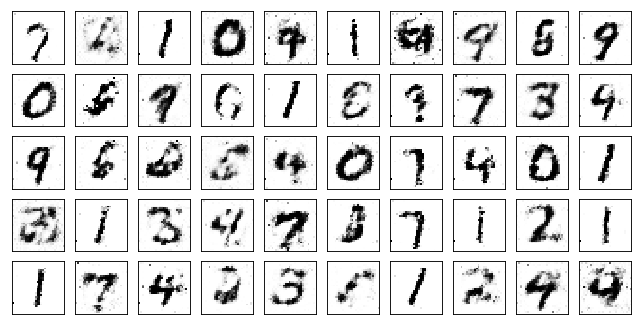

Test losses. G: 1.3007, D: 0.4037
Train Epoch: 25 [0/50000 (0%)]	Losses G: 1.5890, D: 0.4380
Train Epoch: 25 [5000/50000 (10%)]	Losses G: 1.5230, D: 0.4877
Train Epoch: 25 [10000/50000 (20%)]	Losses G: 1.7277, D: 0.4390
Train Epoch: 25 [15000/50000 (30%)]	Losses G: 1.3477, D: 0.3631
Train Epoch: 25 [20000/50000 (40%)]	Losses G: 1.2931, D: 0.4721
Train Epoch: 25 [25000/50000 (50%)]	Losses G: 1.2489, D: 0.5815
Train Epoch: 25 [30000/50000 (60%)]	Losses G: 1.8488, D: 0.3336
Train Epoch: 25 [35000/50000 (70%)]	Losses G: 1.4500, D: 0.4644
Train Epoch: 25 [40000/50000 (80%)]	Losses G: 1.1710, D: 0.5229
Train Epoch: 25 [45000/50000 (90%)]	Losses G: 1.4982, D: 0.4818
Train Epoch: 25 [50000/50000 (100%)]	Losses G: 1.8104, D: 0.3960


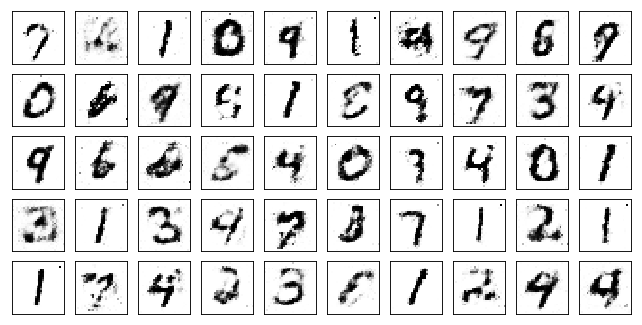

Test losses. G: 1.5814, D: 0.3447
Train Epoch: 26 [0/50000 (0%)]	Losses G: 1.8751, D: 0.3658
Train Epoch: 26 [5000/50000 (10%)]	Losses G: 1.7879, D: 0.4057
Train Epoch: 26 [10000/50000 (20%)]	Losses G: 1.0948, D: 0.5163
Train Epoch: 26 [15000/50000 (30%)]	Losses G: 1.5056, D: 0.4731
Train Epoch: 26 [20000/50000 (40%)]	Losses G: 1.3675, D: 0.4423
Train Epoch: 26 [25000/50000 (50%)]	Losses G: 1.4476, D: 0.3944
Train Epoch: 26 [30000/50000 (60%)]	Losses G: 1.2150, D: 0.5461
Train Epoch: 26 [35000/50000 (70%)]	Losses G: 1.2456, D: 0.5197
Train Epoch: 26 [40000/50000 (80%)]	Losses G: 1.5799, D: 0.4988
Train Epoch: 26 [45000/50000 (90%)]	Losses G: 2.0348, D: 0.3911
Train Epoch: 26 [50000/50000 (100%)]	Losses G: 1.3184, D: 0.5163


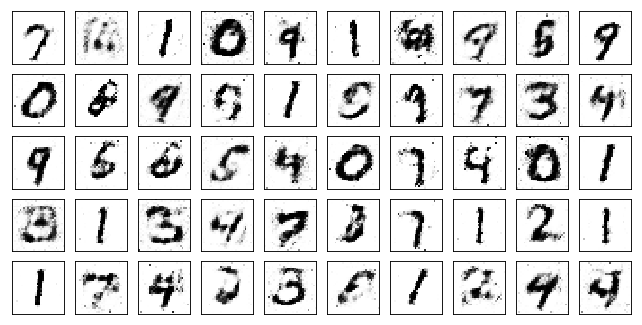

Test losses. G: 1.4452, D: 0.3672
Train Epoch: 27 [0/50000 (0%)]	Losses G: 1.8739, D: 0.4294
Train Epoch: 27 [5000/50000 (10%)]	Losses G: 1.2086, D: 0.5431
Train Epoch: 27 [10000/50000 (20%)]	Losses G: 1.2182, D: 0.5162
Train Epoch: 27 [15000/50000 (30%)]	Losses G: 1.6853, D: 0.3995
Train Epoch: 27 [20000/50000 (40%)]	Losses G: 1.6954, D: 0.4818
Train Epoch: 27 [25000/50000 (50%)]	Losses G: 1.3657, D: 0.4505
Train Epoch: 27 [30000/50000 (60%)]	Losses G: 1.5781, D: 0.4271
Train Epoch: 27 [35000/50000 (70%)]	Losses G: 1.2256, D: 0.4650
Train Epoch: 27 [40000/50000 (80%)]	Losses G: 0.9361, D: 0.5607
Train Epoch: 27 [45000/50000 (90%)]	Losses G: 1.7230, D: 0.4236
Train Epoch: 27 [50000/50000 (100%)]	Losses G: 1.3524, D: 0.4147


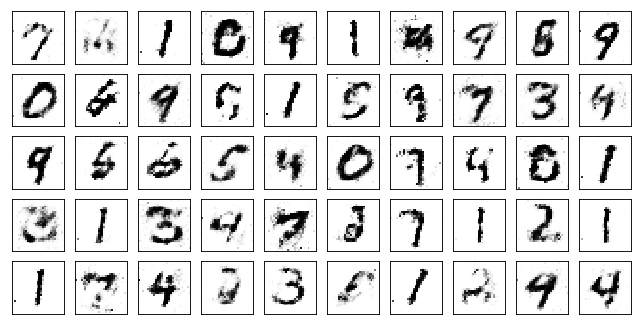

Test losses. G: 1.4335, D: 0.3407
Train Epoch: 28 [0/50000 (0%)]	Losses G: 1.5660, D: 0.4056
Train Epoch: 28 [5000/50000 (10%)]	Losses G: 1.4383, D: 0.4566
Train Epoch: 28 [10000/50000 (20%)]	Losses G: 1.1854, D: 0.6096
Train Epoch: 28 [15000/50000 (30%)]	Losses G: 1.6462, D: 0.4866
Train Epoch: 28 [20000/50000 (40%)]	Losses G: 1.4100, D: 0.4334
Train Epoch: 28 [25000/50000 (50%)]	Losses G: 1.2618, D: 0.5356
Train Epoch: 28 [30000/50000 (60%)]	Losses G: 1.2415, D: 0.5956
Train Epoch: 28 [35000/50000 (70%)]	Losses G: 1.6336, D: 0.4044
Train Epoch: 28 [40000/50000 (80%)]	Losses G: 1.6151, D: 0.5440
Train Epoch: 28 [45000/50000 (90%)]	Losses G: 1.4498, D: 0.5162
Train Epoch: 28 [50000/50000 (100%)]	Losses G: 1.4341, D: 0.4832


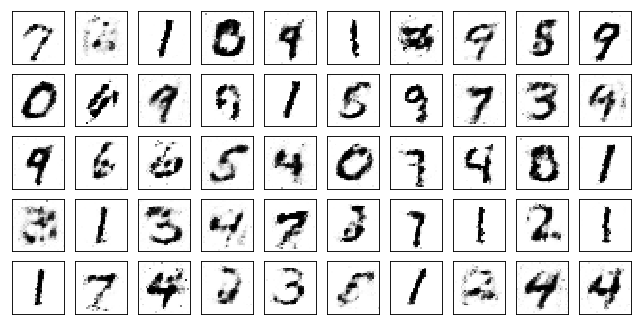

Test losses. G: 1.6407, D: 0.3546
Train Epoch: 29 [0/50000 (0%)]	Losses G: 1.4334, D: 0.4526
Train Epoch: 29 [5000/50000 (10%)]	Losses G: 1.3130, D: 0.4219
Train Epoch: 29 [10000/50000 (20%)]	Losses G: 1.2840, D: 0.6613
Train Epoch: 29 [15000/50000 (30%)]	Losses G: 1.3872, D: 0.5186
Train Epoch: 29 [20000/50000 (40%)]	Losses G: 1.6764, D: 0.4419
Train Epoch: 29 [25000/50000 (50%)]	Losses G: 1.2553, D: 0.4198
Train Epoch: 29 [30000/50000 (60%)]	Losses G: 1.3073, D: 0.4735
Train Epoch: 29 [35000/50000 (70%)]	Losses G: 1.3439, D: 0.5839
Train Epoch: 29 [40000/50000 (80%)]	Losses G: 1.2620, D: 0.5195
Train Epoch: 29 [45000/50000 (90%)]	Losses G: 1.4480, D: 0.4190
Train Epoch: 29 [50000/50000 (100%)]	Losses G: 1.2537, D: 0.5236


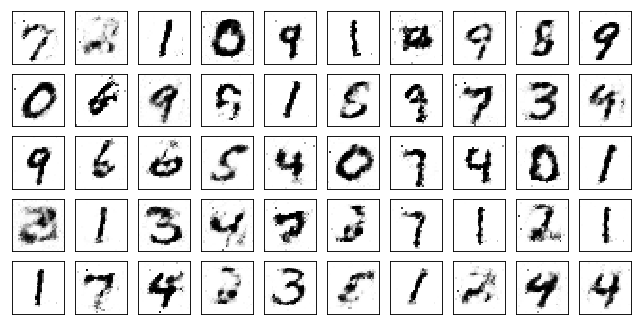

Test losses. G: 1.2359, D: 0.4415
Train Epoch: 30 [0/50000 (0%)]	Losses G: 1.2490, D: 0.5526
Train Epoch: 30 [5000/50000 (10%)]	Losses G: 1.4131, D: 0.5138
Train Epoch: 30 [10000/50000 (20%)]	Losses G: 1.7167, D: 0.3518
Train Epoch: 30 [15000/50000 (30%)]	Losses G: 1.2574, D: 0.4700
Train Epoch: 30 [20000/50000 (40%)]	Losses G: 0.8929, D: 0.5499
Train Epoch: 30 [25000/50000 (50%)]	Losses G: 1.5563, D: 0.5246
Train Epoch: 30 [30000/50000 (60%)]	Losses G: 1.6763, D: 0.5003
Train Epoch: 30 [35000/50000 (70%)]	Losses G: 1.2512, D: 0.4909
Train Epoch: 30 [40000/50000 (80%)]	Losses G: 1.1520, D: 0.5359
Train Epoch: 30 [45000/50000 (90%)]	Losses G: 1.4984, D: 0.4662
Train Epoch: 30 [50000/50000 (100%)]	Losses G: 1.3147, D: 0.5147


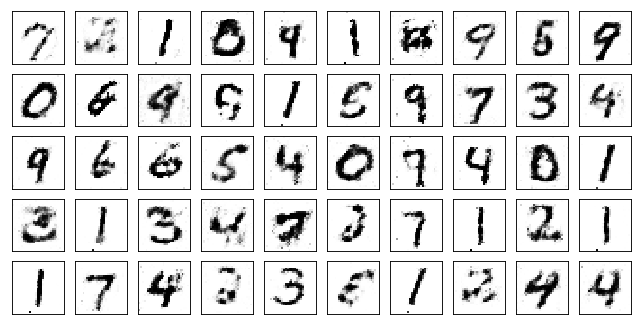

Test losses. G: 1.1594, D: 0.4402
Train Epoch: 31 [0/50000 (0%)]	Losses G: 1.4237, D: 0.5340
Train Epoch: 31 [5000/50000 (10%)]	Losses G: 1.2749, D: 0.5362
Train Epoch: 31 [10000/50000 (20%)]	Losses G: 1.3728, D: 0.4463
Train Epoch: 31 [15000/50000 (30%)]	Losses G: 1.4636, D: 0.5225
Train Epoch: 31 [20000/50000 (40%)]	Losses G: 1.2056, D: 0.6463
Train Epoch: 31 [25000/50000 (50%)]	Losses G: 1.3148, D: 0.5643
Train Epoch: 31 [30000/50000 (60%)]	Losses G: 1.3734, D: 0.5335
Train Epoch: 31 [35000/50000 (70%)]	Losses G: 1.5493, D: 0.5101
Train Epoch: 31 [40000/50000 (80%)]	Losses G: 0.9286, D: 0.6042
Train Epoch: 31 [45000/50000 (90%)]	Losses G: 1.1631, D: 0.5153
Train Epoch: 31 [50000/50000 (100%)]	Losses G: 1.6967, D: 0.4676


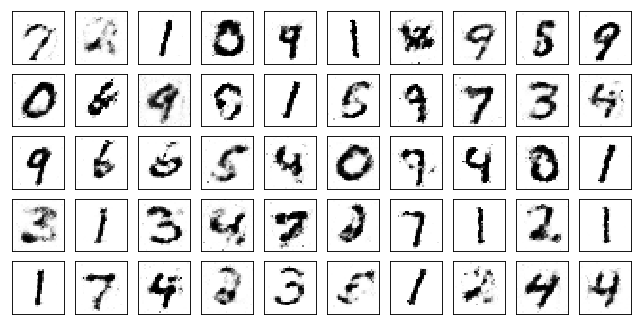

Test losses. G: 1.4948, D: 0.4204
Train Epoch: 32 [0/50000 (0%)]	Losses G: 1.3762, D: 0.5352
Train Epoch: 32 [5000/50000 (10%)]	Losses G: 1.8002, D: 0.5271
Train Epoch: 32 [10000/50000 (20%)]	Losses G: 1.2283, D: 0.4026
Train Epoch: 32 [15000/50000 (30%)]	Losses G: 1.1776, D: 0.4641
Train Epoch: 32 [20000/50000 (40%)]	Losses G: 1.3691, D: 0.5940
Train Epoch: 32 [25000/50000 (50%)]	Losses G: 1.0834, D: 0.6174
Train Epoch: 32 [30000/50000 (60%)]	Losses G: 1.3423, D: 0.4693
Train Epoch: 32 [35000/50000 (70%)]	Losses G: 1.3058, D: 0.5002
Train Epoch: 32 [40000/50000 (80%)]	Losses G: 1.3910, D: 0.5551
Train Epoch: 32 [45000/50000 (90%)]	Losses G: 1.1229, D: 0.5549
Train Epoch: 32 [50000/50000 (100%)]	Losses G: 1.3623, D: 0.5186


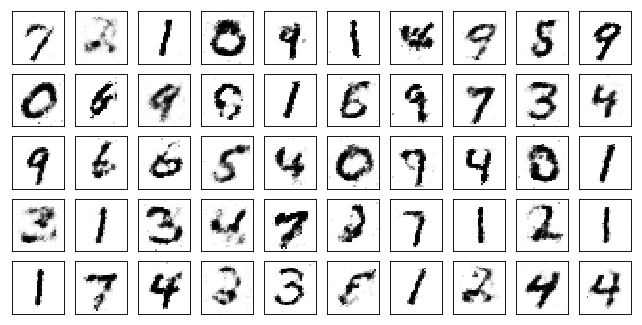

Test losses. G: 1.3561, D: 0.3953
Train Epoch: 33 [0/50000 (0%)]	Losses G: 1.3438, D: 0.5597
Train Epoch: 33 [5000/50000 (10%)]	Losses G: 1.5426, D: 0.4451
Train Epoch: 33 [10000/50000 (20%)]	Losses G: 1.2497, D: 0.4460
Train Epoch: 33 [15000/50000 (30%)]	Losses G: 1.2578, D: 0.4911
Train Epoch: 33 [20000/50000 (40%)]	Losses G: 1.1507, D: 0.5412
Train Epoch: 33 [25000/50000 (50%)]	Losses G: 1.4222, D: 0.4558
Train Epoch: 33 [30000/50000 (60%)]	Losses G: 1.4064, D: 0.5459
Train Epoch: 33 [35000/50000 (70%)]	Losses G: 1.1557, D: 0.5467
Train Epoch: 33 [40000/50000 (80%)]	Losses G: 1.2477, D: 0.4819
Train Epoch: 33 [45000/50000 (90%)]	Losses G: 1.3651, D: 0.4941
Train Epoch: 33 [50000/50000 (100%)]	Losses G: 1.4078, D: 0.5747


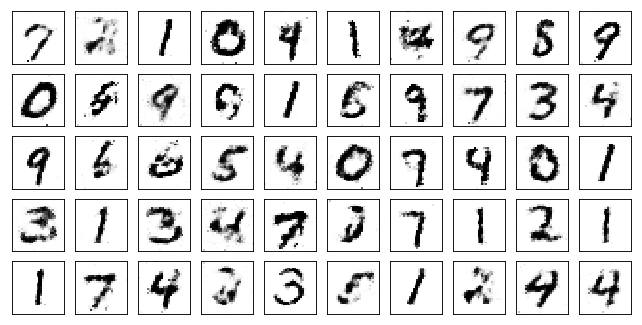

Test losses. G: 1.4488, D: 0.3825
Train Epoch: 34 [0/50000 (0%)]	Losses G: 1.4161, D: 0.5026
Train Epoch: 34 [5000/50000 (10%)]	Losses G: 1.5529, D: 0.4811
Train Epoch: 34 [10000/50000 (20%)]	Losses G: 1.1948, D: 0.5332
Train Epoch: 34 [15000/50000 (30%)]	Losses G: 1.1597, D: 0.3934
Train Epoch: 34 [20000/50000 (40%)]	Losses G: 1.2909, D: 0.5846
Train Epoch: 34 [25000/50000 (50%)]	Losses G: 1.2089, D: 0.4322
Train Epoch: 34 [30000/50000 (60%)]	Losses G: 1.3603, D: 0.5622
Train Epoch: 34 [35000/50000 (70%)]	Losses G: 1.2023, D: 0.5855
Train Epoch: 34 [40000/50000 (80%)]	Losses G: 1.6389, D: 0.4414
Train Epoch: 34 [45000/50000 (90%)]	Losses G: 1.3183, D: 0.5282
Train Epoch: 34 [50000/50000 (100%)]	Losses G: 1.3056, D: 0.5280


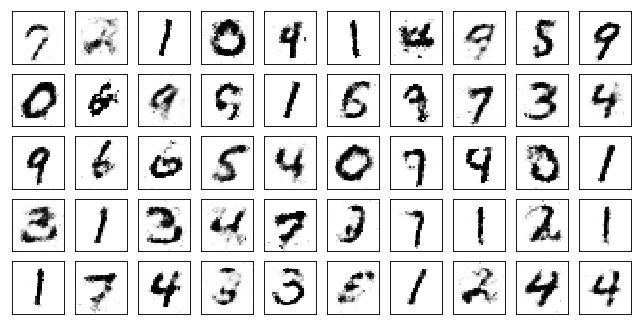

Test losses. G: 1.2222, D: 0.4693
Train Epoch: 35 [0/50000 (0%)]	Losses G: 1.0704, D: 0.5573
Train Epoch: 35 [5000/50000 (10%)]	Losses G: 1.3084, D: 0.6490
Train Epoch: 35 [10000/50000 (20%)]	Losses G: 1.4447, D: 0.4045
Train Epoch: 35 [15000/50000 (30%)]	Losses G: 1.2821, D: 0.4685
Train Epoch: 35 [20000/50000 (40%)]	Losses G: 1.3678, D: 0.5770
Train Epoch: 35 [25000/50000 (50%)]	Losses G: 1.3243, D: 0.5887
Train Epoch: 35 [30000/50000 (60%)]	Losses G: 1.2136, D: 0.4109
Train Epoch: 35 [35000/50000 (70%)]	Losses G: 1.2176, D: 0.5545
Train Epoch: 35 [40000/50000 (80%)]	Losses G: 1.5841, D: 0.5770
Train Epoch: 35 [45000/50000 (90%)]	Losses G: 1.3660, D: 0.4891
Train Epoch: 35 [50000/50000 (100%)]	Losses G: 1.1687, D: 0.6011


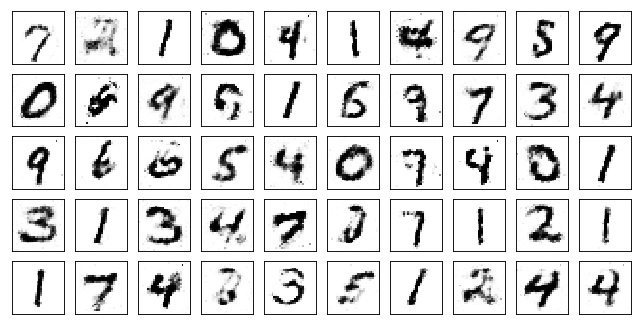

Test losses. G: 1.0825, D: 0.4692
Train Epoch: 36 [0/50000 (0%)]	Losses G: 1.1407, D: 0.5225
Train Epoch: 36 [5000/50000 (10%)]	Losses G: 1.3143, D: 0.5508
Train Epoch: 36 [10000/50000 (20%)]	Losses G: 0.9306, D: 0.5294
Train Epoch: 36 [15000/50000 (30%)]	Losses G: 1.2575, D: 0.5268
Train Epoch: 36 [20000/50000 (40%)]	Losses G: 1.4695, D: 0.5417
Train Epoch: 36 [25000/50000 (50%)]	Losses G: 1.0552, D: 0.5295
Train Epoch: 36 [30000/50000 (60%)]	Losses G: 1.2989, D: 0.5578
Train Epoch: 36 [35000/50000 (70%)]	Losses G: 1.5222, D: 0.4515
Train Epoch: 36 [40000/50000 (80%)]	Losses G: 1.4084, D: 0.4913
Train Epoch: 36 [45000/50000 (90%)]	Losses G: 1.5573, D: 0.4983
Train Epoch: 36 [50000/50000 (100%)]	Losses G: 1.1258, D: 0.4947


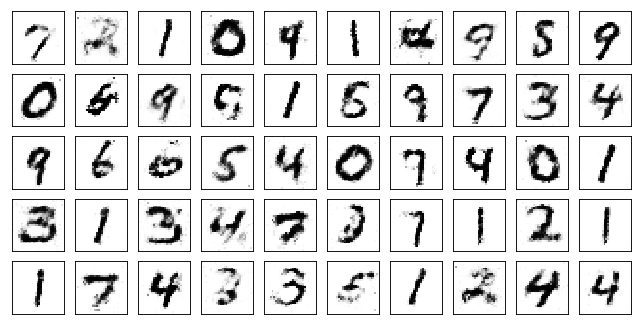

Test losses. G: 1.3717, D: 0.4029
Train Epoch: 37 [0/50000 (0%)]	Losses G: 1.5620, D: 0.4719
Train Epoch: 37 [5000/50000 (10%)]	Losses G: 1.1642, D: 0.4977
Train Epoch: 37 [10000/50000 (20%)]	Losses G: 1.3461, D: 0.5466
Train Epoch: 37 [15000/50000 (30%)]	Losses G: 1.5324, D: 0.5368
Train Epoch: 37 [20000/50000 (40%)]	Losses G: 1.3634, D: 0.5326
Train Epoch: 37 [25000/50000 (50%)]	Losses G: 1.1921, D: 0.5376
Train Epoch: 37 [30000/50000 (60%)]	Losses G: 1.3141, D: 0.4693
Train Epoch: 37 [35000/50000 (70%)]	Losses G: 1.4741, D: 0.5501
Train Epoch: 37 [40000/50000 (80%)]	Losses G: 1.0785, D: 0.4601
Train Epoch: 37 [45000/50000 (90%)]	Losses G: 1.1108, D: 0.4910
Train Epoch: 37 [50000/50000 (100%)]	Losses G: 1.1490, D: 0.5738


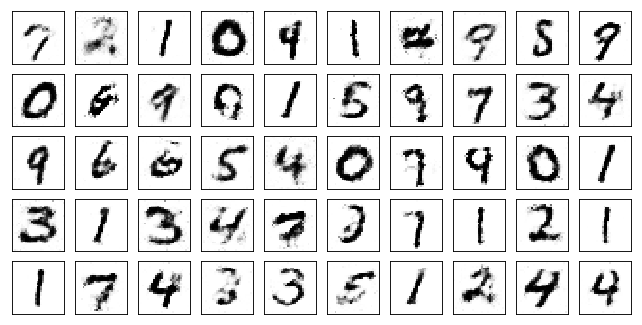

Test losses. G: 1.0835, D: 0.4887
Train Epoch: 38 [0/50000 (0%)]	Losses G: 1.2091, D: 0.5325
Train Epoch: 38 [5000/50000 (10%)]	Losses G: 1.0290, D: 0.5489
Train Epoch: 38 [10000/50000 (20%)]	Losses G: 1.0928, D: 0.5878
Train Epoch: 38 [15000/50000 (30%)]	Losses G: 1.3997, D: 0.5341
Train Epoch: 38 [20000/50000 (40%)]	Losses G: 1.0500, D: 0.5293
Train Epoch: 38 [25000/50000 (50%)]	Losses G: 1.2774, D: 0.4918
Train Epoch: 38 [30000/50000 (60%)]	Losses G: 1.3757, D: 0.4738
Train Epoch: 38 [35000/50000 (70%)]	Losses G: 1.1456, D: 0.5604
Train Epoch: 38 [40000/50000 (80%)]	Losses G: 1.5135, D: 0.4341
Train Epoch: 38 [45000/50000 (90%)]	Losses G: 1.5578, D: 0.4916
Train Epoch: 38 [50000/50000 (100%)]	Losses G: 1.3424, D: 0.5029


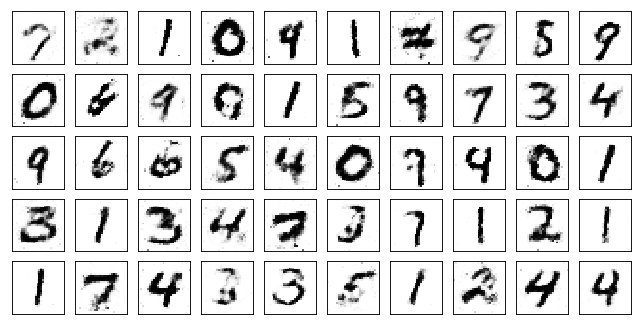

Test losses. G: 1.3375, D: 0.4370
Train Epoch: 39 [0/50000 (0%)]	Losses G: 1.3702, D: 0.5239
Train Epoch: 39 [5000/50000 (10%)]	Losses G: 1.1176, D: 0.6356
Train Epoch: 39 [10000/50000 (20%)]	Losses G: 1.5746, D: 0.6558
Train Epoch: 39 [15000/50000 (30%)]	Losses G: 1.2307, D: 0.5246
Train Epoch: 39 [20000/50000 (40%)]	Losses G: 1.4704, D: 0.4994
Train Epoch: 39 [25000/50000 (50%)]	Losses G: 1.0219, D: 0.5144
Train Epoch: 39 [30000/50000 (60%)]	Losses G: 1.5840, D: 0.6026
Train Epoch: 39 [35000/50000 (70%)]	Losses G: 1.3550, D: 0.5333
Train Epoch: 39 [40000/50000 (80%)]	Losses G: 1.3511, D: 0.5362
Train Epoch: 39 [45000/50000 (90%)]	Losses G: 1.1959, D: 0.5763
Train Epoch: 39 [50000/50000 (100%)]	Losses G: 1.4798, D: 0.4876


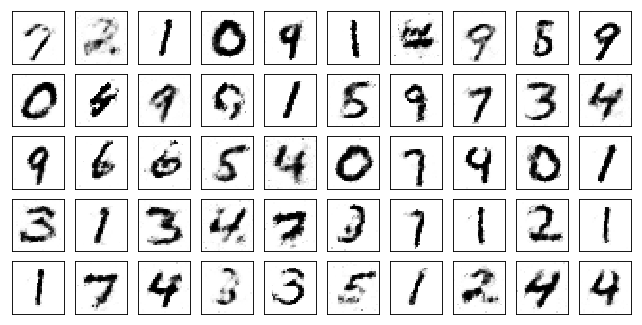

Test losses. G: 1.3317, D: 0.4479
Train Epoch: 40 [0/50000 (0%)]	Losses G: 1.6429, D: 0.5517
Train Epoch: 40 [5000/50000 (10%)]	Losses G: 1.3793, D: 0.4746
Train Epoch: 40 [10000/50000 (20%)]	Losses G: 1.2678, D: 0.4589
Train Epoch: 40 [15000/50000 (30%)]	Losses G: 1.0657, D: 0.4777
Train Epoch: 40 [20000/50000 (40%)]	Losses G: 1.2954, D: 0.4634
Train Epoch: 40 [25000/50000 (50%)]	Losses G: 1.1100, D: 0.5710
Train Epoch: 40 [30000/50000 (60%)]	Losses G: 1.4101, D: 0.5410
Train Epoch: 40 [35000/50000 (70%)]	Losses G: 1.1770, D: 0.4677
Train Epoch: 40 [40000/50000 (80%)]	Losses G: 1.0448, D: 0.5952
Train Epoch: 40 [45000/50000 (90%)]	Losses G: 1.4056, D: 0.4706
Train Epoch: 40 [50000/50000 (100%)]	Losses G: 1.1167, D: 0.5299


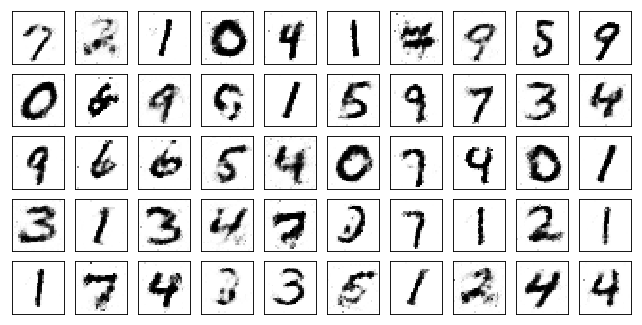

Test losses. G: 1.2823, D: 0.4414
Train Epoch: 41 [0/50000 (0%)]	Losses G: 1.3096, D: 0.4707
Train Epoch: 41 [5000/50000 (10%)]	Losses G: 1.3779, D: 0.5767
Train Epoch: 41 [10000/50000 (20%)]	Losses G: 1.2771, D: 0.5081
Train Epoch: 41 [15000/50000 (30%)]	Losses G: 1.4547, D: 0.6158
Train Epoch: 41 [20000/50000 (40%)]	Losses G: 1.1910, D: 0.5700
Train Epoch: 41 [25000/50000 (50%)]	Losses G: 1.1070, D: 0.6525
Train Epoch: 41 [30000/50000 (60%)]	Losses G: 1.5837, D: 0.4994
Train Epoch: 41 [35000/50000 (70%)]	Losses G: 1.3887, D: 0.4976
Train Epoch: 41 [40000/50000 (80%)]	Losses G: 1.5026, D: 0.4626
Train Epoch: 41 [45000/50000 (90%)]	Losses G: 1.2262, D: 0.5011
Train Epoch: 41 [50000/50000 (100%)]	Losses G: 1.2832, D: 0.5286


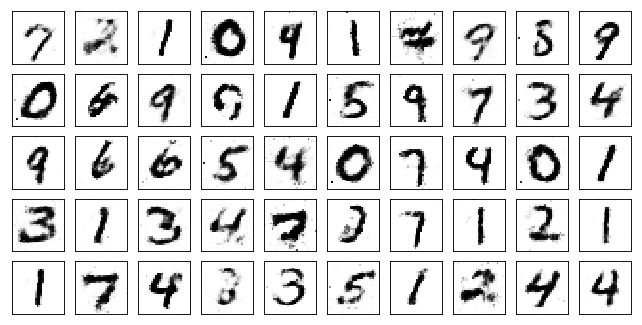

Test losses. G: 1.1476, D: 0.4575
Train Epoch: 42 [0/50000 (0%)]	Losses G: 0.9823, D: 0.6315
Train Epoch: 42 [5000/50000 (10%)]	Losses G: 1.2012, D: 0.5024
Train Epoch: 42 [10000/50000 (20%)]	Losses G: 1.0155, D: 0.5160
Train Epoch: 42 [15000/50000 (30%)]	Losses G: 1.0653, D: 0.5921
Train Epoch: 42 [20000/50000 (40%)]	Losses G: 1.3063, D: 0.6007
Train Epoch: 42 [25000/50000 (50%)]	Losses G: 1.0875, D: 0.5023
Train Epoch: 42 [30000/50000 (60%)]	Losses G: 1.4315, D: 0.5777
Train Epoch: 42 [35000/50000 (70%)]	Losses G: 1.2220, D: 0.5473
Train Epoch: 42 [40000/50000 (80%)]	Losses G: 1.1539, D: 0.5296
Train Epoch: 42 [45000/50000 (90%)]	Losses G: 1.1544, D: 0.4516
Train Epoch: 42 [50000/50000 (100%)]	Losses G: 1.3287, D: 0.4285


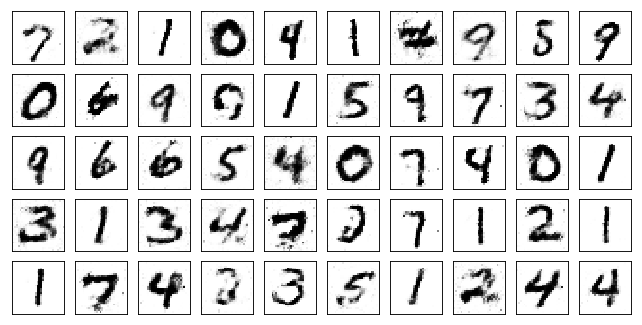

Test losses. G: 1.2663, D: 0.4357
Train Epoch: 43 [0/50000 (0%)]	Losses G: 1.1238, D: 0.5332
Train Epoch: 43 [5000/50000 (10%)]	Losses G: 1.0760, D: 0.5024
Train Epoch: 43 [10000/50000 (20%)]	Losses G: 1.2989, D: 0.5743
Train Epoch: 43 [15000/50000 (30%)]	Losses G: 1.2386, D: 0.5918
Train Epoch: 43 [20000/50000 (40%)]	Losses G: 1.1195, D: 0.5482
Train Epoch: 43 [25000/50000 (50%)]	Losses G: 1.0757, D: 0.5792
Train Epoch: 43 [30000/50000 (60%)]	Losses G: 0.9931, D: 0.5552
Train Epoch: 43 [35000/50000 (70%)]	Losses G: 1.2337, D: 0.5222
Train Epoch: 43 [40000/50000 (80%)]	Losses G: 1.4784, D: 0.6381
Train Epoch: 43 [45000/50000 (90%)]	Losses G: 1.3441, D: 0.5784
Train Epoch: 43 [50000/50000 (100%)]	Losses G: 1.2399, D: 0.4739


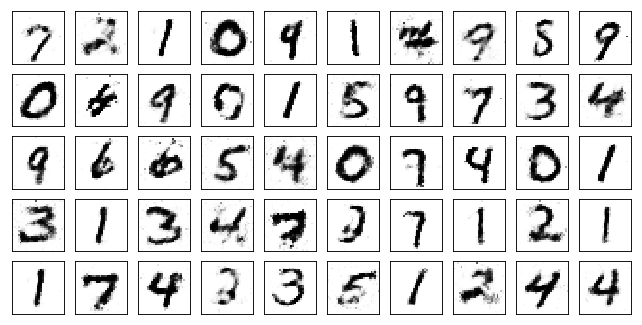

Test losses. G: 1.2955, D: 0.4582
Train Epoch: 44 [0/50000 (0%)]	Losses G: 1.3213, D: 0.5511
Train Epoch: 44 [5000/50000 (10%)]	Losses G: 1.3072, D: 0.5239
Train Epoch: 44 [10000/50000 (20%)]	Losses G: 1.7538, D: 0.4634
Train Epoch: 44 [15000/50000 (30%)]	Losses G: 1.3477, D: 0.5100
Train Epoch: 44 [20000/50000 (40%)]	Losses G: 1.4436, D: 0.4842
Train Epoch: 44 [25000/50000 (50%)]	Losses G: 1.3258, D: 0.4419
Train Epoch: 44 [30000/50000 (60%)]	Losses G: 0.9499, D: 0.4935
Train Epoch: 44 [35000/50000 (70%)]	Losses G: 1.0630, D: 0.5057
Train Epoch: 44 [40000/50000 (80%)]	Losses G: 1.0676, D: 0.4707
Train Epoch: 44 [45000/50000 (90%)]	Losses G: 1.2199, D: 0.5978
Train Epoch: 44 [50000/50000 (100%)]	Losses G: 1.0767, D: 0.5505


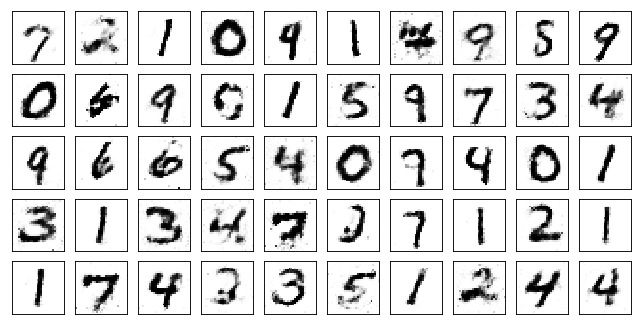

Test losses. G: 1.0532, D: 0.4788
Train Epoch: 45 [0/50000 (0%)]	Losses G: 1.0294, D: 0.5449
Train Epoch: 45 [5000/50000 (10%)]	Losses G: 1.1115, D: 0.5900
Train Epoch: 45 [10000/50000 (20%)]	Losses G: 1.1418, D: 0.5556
Train Epoch: 45 [15000/50000 (30%)]	Losses G: 1.4151, D: 0.4486
Train Epoch: 45 [20000/50000 (40%)]	Losses G: 1.3833, D: 0.4821
Train Epoch: 45 [25000/50000 (50%)]	Losses G: 1.1705, D: 0.5093
Train Epoch: 45 [30000/50000 (60%)]	Losses G: 1.1694, D: 0.6525
Train Epoch: 45 [35000/50000 (70%)]	Losses G: 1.1206, D: 0.6192
Train Epoch: 45 [40000/50000 (80%)]	Losses G: 1.1432, D: 0.5685
Train Epoch: 45 [45000/50000 (90%)]	Losses G: 1.6330, D: 0.5173
Train Epoch: 45 [50000/50000 (100%)]	Losses G: 1.3067, D: 0.4536


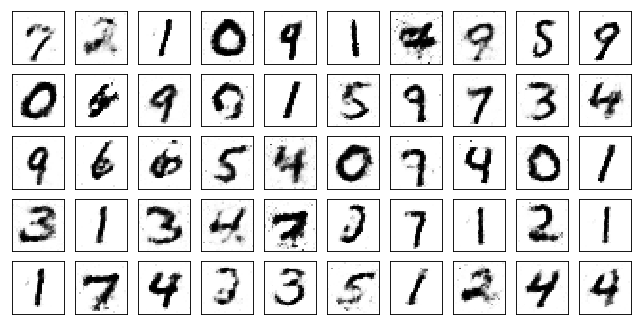

Test losses. G: 1.3828, D: 0.4311
Train Epoch: 46 [0/50000 (0%)]	Losses G: 1.3612, D: 0.5113
Train Epoch: 46 [5000/50000 (10%)]	Losses G: 1.6142, D: 0.4855
Train Epoch: 46 [10000/50000 (20%)]	Losses G: 1.4801, D: 0.4931
Train Epoch: 46 [15000/50000 (30%)]	Losses G: 1.3834, D: 0.5238
Train Epoch: 46 [20000/50000 (40%)]	Losses G: 1.3379, D: 0.5002
Train Epoch: 46 [25000/50000 (50%)]	Losses G: 1.1510, D: 0.5154
Train Epoch: 46 [30000/50000 (60%)]	Losses G: 1.2486, D: 0.5404
Train Epoch: 46 [35000/50000 (70%)]	Losses G: 1.4490, D: 0.5691
Train Epoch: 46 [40000/50000 (80%)]	Losses G: 0.9852, D: 0.5858
Train Epoch: 46 [45000/50000 (90%)]	Losses G: 0.9323, D: 0.6006
Train Epoch: 46 [50000/50000 (100%)]	Losses G: 1.1442, D: 0.5685


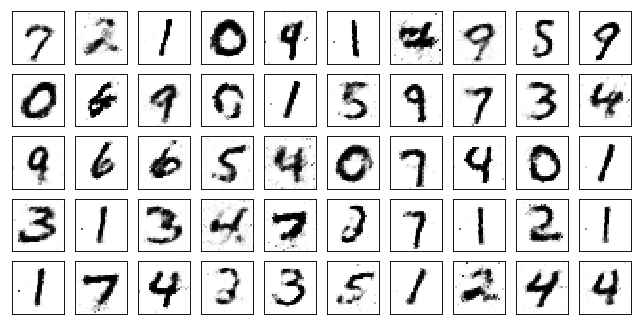

Test losses. G: 1.2307, D: 0.5010
Train Epoch: 47 [0/50000 (0%)]	Losses G: 1.2418, D: 0.6065
Train Epoch: 47 [5000/50000 (10%)]	Losses G: 1.0917, D: 0.5570
Train Epoch: 47 [10000/50000 (20%)]	Losses G: 1.1978, D: 0.6490
Train Epoch: 47 [15000/50000 (30%)]	Losses G: 1.0371, D: 0.5920
Train Epoch: 47 [20000/50000 (40%)]	Losses G: 1.2653, D: 0.5038
Train Epoch: 47 [25000/50000 (50%)]	Losses G: 1.3798, D: 0.5417
Train Epoch: 47 [30000/50000 (60%)]	Losses G: 1.3239, D: 0.5438
Train Epoch: 47 [35000/50000 (70%)]	Losses G: 1.2536, D: 0.5125
Train Epoch: 47 [40000/50000 (80%)]	Losses G: 1.1294, D: 0.5257
Train Epoch: 47 [45000/50000 (90%)]	Losses G: 0.9825, D: 0.6393
Train Epoch: 47 [50000/50000 (100%)]	Losses G: 1.1342, D: 0.4918


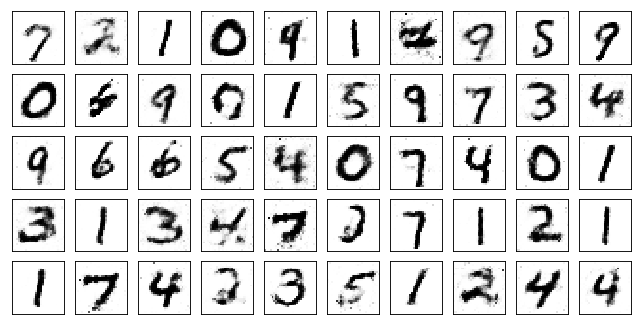

Test losses. G: 1.0292, D: 0.4811
Train Epoch: 48 [0/50000 (0%)]	Losses G: 0.9855, D: 0.5663
Train Epoch: 48 [5000/50000 (10%)]	Losses G: 1.3551, D: 0.5002
Train Epoch: 48 [10000/50000 (20%)]	Losses G: 1.2500, D: 0.5610
Train Epoch: 48 [15000/50000 (30%)]	Losses G: 0.9190, D: 0.5107
Train Epoch: 48 [20000/50000 (40%)]	Losses G: 1.1711, D: 0.4909
Train Epoch: 48 [25000/50000 (50%)]	Losses G: 1.1305, D: 0.6366
Train Epoch: 48 [30000/50000 (60%)]	Losses G: 1.3634, D: 0.5853
Train Epoch: 48 [35000/50000 (70%)]	Losses G: 1.1286, D: 0.5736
Train Epoch: 48 [40000/50000 (80%)]	Losses G: 1.1886, D: 0.5767
Train Epoch: 48 [45000/50000 (90%)]	Losses G: 1.1042, D: 0.5451
Train Epoch: 48 [50000/50000 (100%)]	Losses G: 1.0142, D: 0.5791


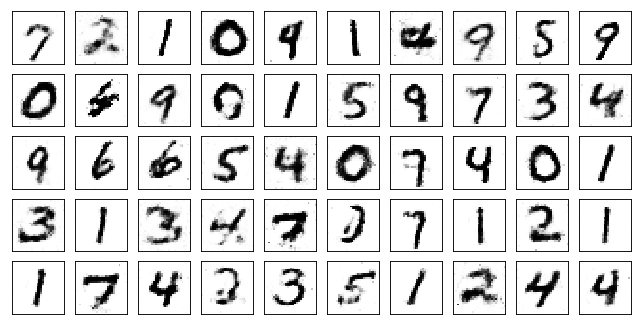

Test losses. G: 1.0363, D: 0.5055
Train Epoch: 49 [0/50000 (0%)]	Losses G: 1.0556, D: 0.5552
Train Epoch: 49 [5000/50000 (10%)]	Losses G: 1.3217, D: 0.5566
Train Epoch: 49 [10000/50000 (20%)]	Losses G: 0.9651, D: 0.6209
Train Epoch: 49 [15000/50000 (30%)]	Losses G: 1.0316, D: 0.6800
Train Epoch: 49 [20000/50000 (40%)]	Losses G: 1.1789, D: 0.5565
Train Epoch: 49 [25000/50000 (50%)]	Losses G: 1.0062, D: 0.5924
Train Epoch: 49 [30000/50000 (60%)]	Losses G: 0.9766, D: 0.6470
Train Epoch: 49 [35000/50000 (70%)]	Losses G: 1.4098, D: 0.5718
Train Epoch: 49 [40000/50000 (80%)]	Losses G: 1.2435, D: 0.5158
Train Epoch: 49 [45000/50000 (90%)]	Losses G: 1.0003, D: 0.4804
Train Epoch: 49 [50000/50000 (100%)]	Losses G: 1.2606, D: 0.5502


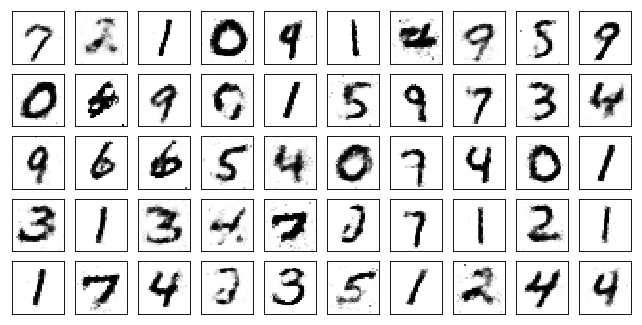

Test losses. G: 1.5108, D: 0.4524
Train Epoch: 50 [0/50000 (0%)]	Losses G: 1.3659, D: 0.5459
Train Epoch: 50 [5000/50000 (10%)]	Losses G: 1.1184, D: 0.5111
Train Epoch: 50 [10000/50000 (20%)]	Losses G: 1.2670, D: 0.5949
Train Epoch: 50 [15000/50000 (30%)]	Losses G: 0.9865, D: 0.6128
Train Epoch: 50 [20000/50000 (40%)]	Losses G: 1.3804, D: 0.5397
Train Epoch: 50 [25000/50000 (50%)]	Losses G: 1.3394, D: 0.5943
Train Epoch: 50 [30000/50000 (60%)]	Losses G: 1.1964, D: 0.5736
Train Epoch: 50 [35000/50000 (70%)]	Losses G: 1.0888, D: 0.5628
Train Epoch: 50 [40000/50000 (80%)]	Losses G: 0.9901, D: 0.5712
Train Epoch: 50 [45000/50000 (90%)]	Losses G: 1.1071, D: 0.5449
Train Epoch: 50 [50000/50000 (100%)]	Losses G: 1.3707, D: 0.5289


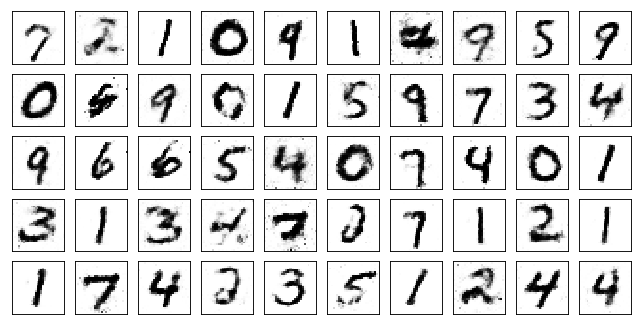

Test losses. G: 1.2759, D: 0.4281
Train Epoch: 51 [0/50000 (0%)]	Losses G: 1.2880, D: 0.4588
Train Epoch: 51 [5000/50000 (10%)]	Losses G: 1.1497, D: 0.4517
Train Epoch: 51 [10000/50000 (20%)]	Losses G: 1.3621, D: 0.5442
Train Epoch: 51 [15000/50000 (30%)]	Losses G: 1.3273, D: 0.4609
Train Epoch: 51 [20000/50000 (40%)]	Losses G: 1.1416, D: 0.6321
Train Epoch: 51 [25000/50000 (50%)]	Losses G: 0.9486, D: 0.5549
Train Epoch: 51 [30000/50000 (60%)]	Losses G: 1.0097, D: 0.5251
Train Epoch: 51 [35000/50000 (70%)]	Losses G: 1.0529, D: 0.6224
Train Epoch: 51 [40000/50000 (80%)]	Losses G: 0.9415, D: 0.5100
Train Epoch: 51 [45000/50000 (90%)]	Losses G: 1.0195, D: 0.6122
Train Epoch: 51 [50000/50000 (100%)]	Losses G: 1.2542, D: 0.5743


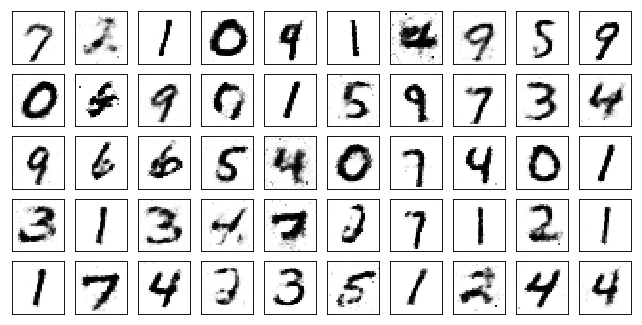

Test losses. G: 1.1216, D: 0.5054
Train Epoch: 52 [0/50000 (0%)]	Losses G: 1.0193, D: 0.5317
Train Epoch: 52 [5000/50000 (10%)]	Losses G: 1.2117, D: 0.5054
Train Epoch: 52 [10000/50000 (20%)]	Losses G: 1.4189, D: 0.4952
Train Epoch: 52 [15000/50000 (30%)]	Losses G: 1.1325, D: 0.4495
Train Epoch: 52 [20000/50000 (40%)]	Losses G: 1.0139, D: 0.5090
Train Epoch: 52 [25000/50000 (50%)]	Losses G: 1.2611, D: 0.5412
Train Epoch: 52 [30000/50000 (60%)]	Losses G: 1.3630, D: 0.5461
Train Epoch: 52 [35000/50000 (70%)]	Losses G: 1.2856, D: 0.5497
Train Epoch: 52 [40000/50000 (80%)]	Losses G: 1.2418, D: 0.5413
Train Epoch: 52 [45000/50000 (90%)]	Losses G: 1.1580, D: 0.5853
Train Epoch: 52 [50000/50000 (100%)]	Losses G: 1.2242, D: 0.4863


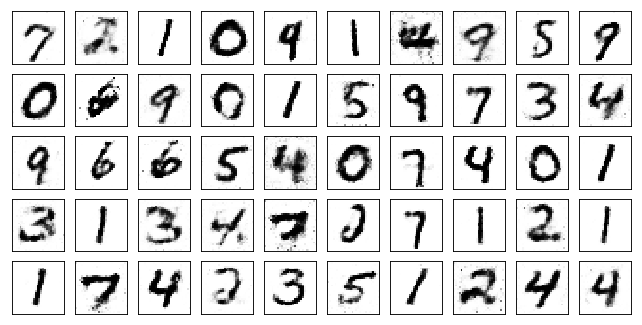

Test losses. G: 1.1603, D: 0.5303
Train Epoch: 53 [0/50000 (0%)]	Losses G: 1.3677, D: 0.5523
Train Epoch: 53 [5000/50000 (10%)]	Losses G: 1.1147, D: 0.5853
Train Epoch: 53 [10000/50000 (20%)]	Losses G: 1.3253, D: 0.6445
Train Epoch: 53 [15000/50000 (30%)]	Losses G: 1.2601, D: 0.5595
Train Epoch: 53 [20000/50000 (40%)]	Losses G: 1.1025, D: 0.5305
Train Epoch: 53 [25000/50000 (50%)]	Losses G: 1.1103, D: 0.4708
Train Epoch: 53 [30000/50000 (60%)]	Losses G: 1.2806, D: 0.5121
Train Epoch: 53 [35000/50000 (70%)]	Losses G: 1.3246, D: 0.5095
Train Epoch: 53 [40000/50000 (80%)]	Losses G: 1.2398, D: 0.5129
Train Epoch: 53 [45000/50000 (90%)]	Losses G: 1.2232, D: 0.5200
Train Epoch: 53 [50000/50000 (100%)]	Losses G: 1.2510, D: 0.5411


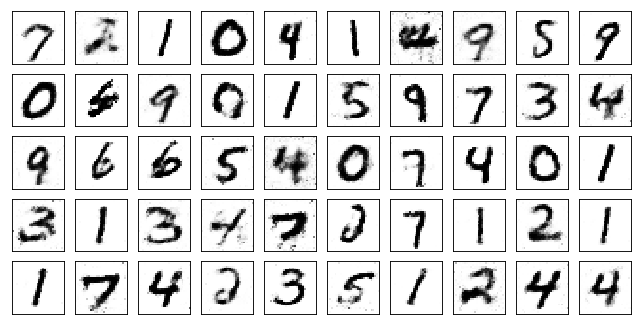

Test losses. G: 1.2432, D: 0.4802
Train Epoch: 54 [0/50000 (0%)]	Losses G: 1.2376, D: 0.5409
Train Epoch: 54 [5000/50000 (10%)]	Losses G: 1.1587, D: 0.6051
Train Epoch: 54 [10000/50000 (20%)]	Losses G: 1.1373, D: 0.6006
Train Epoch: 54 [15000/50000 (30%)]	Losses G: 1.0194, D: 0.5244
Train Epoch: 54 [20000/50000 (40%)]	Losses G: 1.2121, D: 0.5632
Train Epoch: 54 [25000/50000 (50%)]	Losses G: 0.9633, D: 0.5928
Train Epoch: 54 [30000/50000 (60%)]	Losses G: 1.0480, D: 0.5629
Train Epoch: 54 [35000/50000 (70%)]	Losses G: 1.0667, D: 0.4867
Train Epoch: 54 [40000/50000 (80%)]	Losses G: 1.2418, D: 0.5473
Train Epoch: 54 [45000/50000 (90%)]	Losses G: 1.2458, D: 0.5779
Train Epoch: 54 [50000/50000 (100%)]	Losses G: 1.1628, D: 0.5279


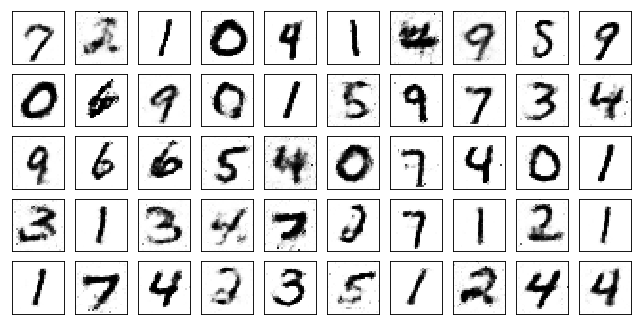

Test losses. G: 1.1006, D: 0.4839
Train Epoch: 55 [0/50000 (0%)]	Losses G: 1.2526, D: 0.6043
Train Epoch: 55 [5000/50000 (10%)]	Losses G: 1.2398, D: 0.5069
Train Epoch: 55 [10000/50000 (20%)]	Losses G: 1.3086, D: 0.4882
Train Epoch: 55 [15000/50000 (30%)]	Losses G: 1.0896, D: 0.5786
Train Epoch: 55 [20000/50000 (40%)]	Losses G: 1.0535, D: 0.6074
Train Epoch: 55 [25000/50000 (50%)]	Losses G: 0.9635, D: 0.5327
Train Epoch: 55 [30000/50000 (60%)]	Losses G: 1.1853, D: 0.6089
Train Epoch: 55 [35000/50000 (70%)]	Losses G: 1.2153, D: 0.5031
Train Epoch: 55 [40000/50000 (80%)]	Losses G: 1.1738, D: 0.5534
Train Epoch: 55 [45000/50000 (90%)]	Losses G: 1.0488, D: 0.5376
Train Epoch: 55 [50000/50000 (100%)]	Losses G: 1.0243, D: 0.5489


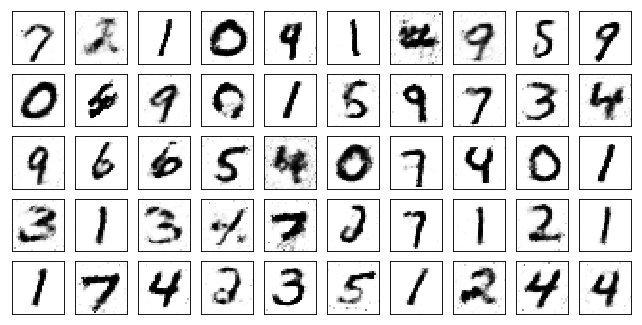

Test losses. G: 1.0127, D: 0.5018
Train Epoch: 56 [0/50000 (0%)]	Losses G: 1.0311, D: 0.5346
Train Epoch: 56 [5000/50000 (10%)]	Losses G: 1.0572, D: 0.4761
Train Epoch: 56 [10000/50000 (20%)]	Losses G: 1.4503, D: 0.4780
Train Epoch: 56 [15000/50000 (30%)]	Losses G: 1.3935, D: 0.5919
Train Epoch: 56 [20000/50000 (40%)]	Losses G: 1.2032, D: 0.6137
Train Epoch: 56 [25000/50000 (50%)]	Losses G: 1.1883, D: 0.4825
Train Epoch: 56 [30000/50000 (60%)]	Losses G: 1.2269, D: 0.5250
Train Epoch: 56 [35000/50000 (70%)]	Losses G: 0.9797, D: 0.5668
Train Epoch: 56 [40000/50000 (80%)]	Losses G: 1.1056, D: 0.6084
Train Epoch: 56 [45000/50000 (90%)]	Losses G: 1.1562, D: 0.6770
Train Epoch: 56 [50000/50000 (100%)]	Losses G: 1.2162, D: 0.4553


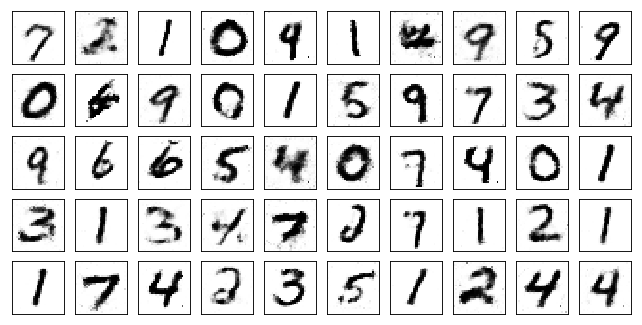

Test losses. G: 1.2486, D: 0.4720
Train Epoch: 57 [0/50000 (0%)]	Losses G: 1.0470, D: 0.5227
Train Epoch: 57 [5000/50000 (10%)]	Losses G: 1.3648, D: 0.5953
Train Epoch: 57 [10000/50000 (20%)]	Losses G: 1.1457, D: 0.4997
Train Epoch: 57 [15000/50000 (30%)]	Losses G: 1.0496, D: 0.4896
Train Epoch: 57 [20000/50000 (40%)]	Losses G: 1.1500, D: 0.4698
Train Epoch: 57 [25000/50000 (50%)]	Losses G: 1.1695, D: 0.5604
Train Epoch: 57 [30000/50000 (60%)]	Losses G: 1.0596, D: 0.6138
Train Epoch: 57 [35000/50000 (70%)]	Losses G: 0.8552, D: 0.6064
Train Epoch: 57 [40000/50000 (80%)]	Losses G: 1.2041, D: 0.5723
Train Epoch: 57 [45000/50000 (90%)]	Losses G: 1.1486, D: 0.5007
Train Epoch: 57 [50000/50000 (100%)]	Losses G: 1.1039, D: 0.5451


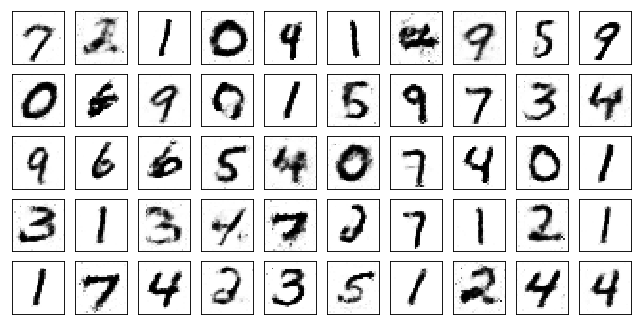

Test losses. G: 1.1170, D: 0.4994
Train Epoch: 58 [0/50000 (0%)]	Losses G: 1.3150, D: 0.5335
Train Epoch: 58 [5000/50000 (10%)]	Losses G: 1.0445, D: 0.5140
Train Epoch: 58 [10000/50000 (20%)]	Losses G: 1.0316, D: 0.4700
Train Epoch: 58 [15000/50000 (30%)]	Losses G: 1.1184, D: 0.5021
Train Epoch: 58 [20000/50000 (40%)]	Losses G: 1.1843, D: 0.5205
Train Epoch: 58 [25000/50000 (50%)]	Losses G: 1.1672, D: 0.5706
Train Epoch: 58 [30000/50000 (60%)]	Losses G: 1.2281, D: 0.5505
Train Epoch: 58 [35000/50000 (70%)]	Losses G: 0.9620, D: 0.6467
Train Epoch: 58 [40000/50000 (80%)]	Losses G: 1.2839, D: 0.5206
Train Epoch: 58 [45000/50000 (90%)]	Losses G: 0.8893, D: 0.5647
Train Epoch: 58 [50000/50000 (100%)]	Losses G: 0.9606, D: 0.6537


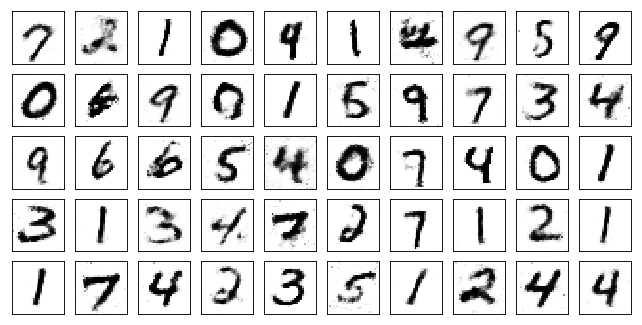

Test losses. G: 0.8428, D: 0.5516
Train Epoch: 59 [0/50000 (0%)]	Losses G: 0.9232, D: 0.6843
Train Epoch: 59 [5000/50000 (10%)]	Losses G: 1.1677, D: 0.5475
Train Epoch: 59 [10000/50000 (20%)]	Losses G: 1.1159, D: 0.5659
Train Epoch: 59 [15000/50000 (30%)]	Losses G: 0.9648, D: 0.6167
Train Epoch: 59 [20000/50000 (40%)]	Losses G: 1.1710, D: 0.5806
Train Epoch: 59 [25000/50000 (50%)]	Losses G: 1.2937, D: 0.5947
Train Epoch: 59 [30000/50000 (60%)]	Losses G: 0.9522, D: 0.4983
Train Epoch: 59 [35000/50000 (70%)]	Losses G: 1.1111, D: 0.6504
Train Epoch: 59 [40000/50000 (80%)]	Losses G: 1.0546, D: 0.5816
Train Epoch: 59 [45000/50000 (90%)]	Losses G: 1.2066, D: 0.5869
Train Epoch: 59 [50000/50000 (100%)]	Losses G: 1.1659, D: 0.6329


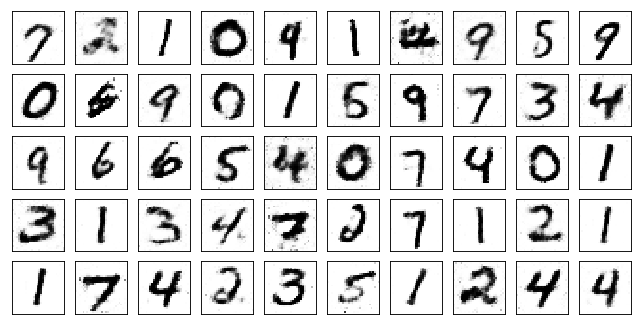

Test losses. G: 1.0597, D: 0.5455
Train Epoch: 60 [0/50000 (0%)]	Losses G: 1.0420, D: 0.5292
Train Epoch: 60 [5000/50000 (10%)]	Losses G: 0.9146, D: 0.5253
Train Epoch: 60 [10000/50000 (20%)]	Losses G: 1.0835, D: 0.5518
Train Epoch: 60 [15000/50000 (30%)]	Losses G: 0.9383, D: 0.6603
Train Epoch: 60 [20000/50000 (40%)]	Losses G: 1.0123, D: 0.6206
Train Epoch: 60 [25000/50000 (50%)]	Losses G: 1.3319, D: 0.4950
Train Epoch: 60 [30000/50000 (60%)]	Losses G: 0.9101, D: 0.5561
Train Epoch: 60 [35000/50000 (70%)]	Losses G: 1.1395, D: 0.6221
Train Epoch: 60 [40000/50000 (80%)]	Losses G: 1.1448, D: 0.5253
Train Epoch: 60 [45000/50000 (90%)]	Losses G: 1.1674, D: 0.5322
Train Epoch: 60 [50000/50000 (100%)]	Losses G: 1.2024, D: 0.5474


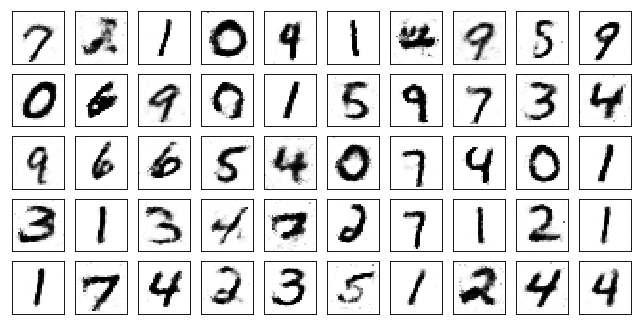

Test losses. G: 1.3442, D: 0.5018
Train Epoch: 61 [0/50000 (0%)]	Losses G: 1.1176, D: 0.5261
Train Epoch: 61 [5000/50000 (10%)]	Losses G: 1.0976, D: 0.5663
Train Epoch: 61 [10000/50000 (20%)]	Losses G: 1.0779, D: 0.5400
Train Epoch: 61 [15000/50000 (30%)]	Losses G: 1.0821, D: 0.5566
Train Epoch: 61 [20000/50000 (40%)]	Losses G: 0.8902, D: 0.6121
Train Epoch: 61 [25000/50000 (50%)]	Losses G: 1.2726, D: 0.6019
Train Epoch: 61 [30000/50000 (60%)]	Losses G: 1.0846, D: 0.6486
Train Epoch: 61 [35000/50000 (70%)]	Losses G: 0.9977, D: 0.5786
Train Epoch: 61 [40000/50000 (80%)]	Losses G: 0.9099, D: 0.5973
Train Epoch: 61 [45000/50000 (90%)]	Losses G: 0.9364, D: 0.6297
Train Epoch: 61 [50000/50000 (100%)]	Losses G: 0.9891, D: 0.6138


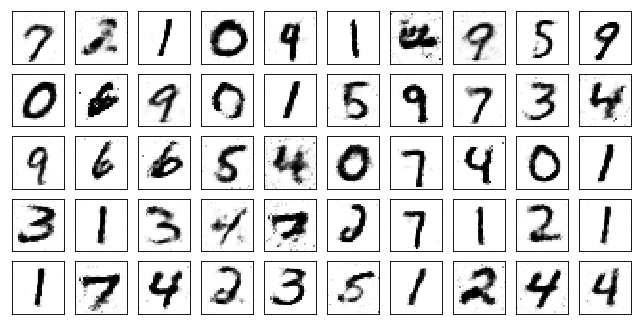

Test losses. G: 0.9471, D: 0.5433
Train Epoch: 62 [0/50000 (0%)]	Losses G: 0.9853, D: 0.5727
Train Epoch: 62 [5000/50000 (10%)]	Losses G: 1.0396, D: 0.6312
Train Epoch: 62 [10000/50000 (20%)]	Losses G: 1.2742, D: 0.6609
Train Epoch: 62 [15000/50000 (30%)]	Losses G: 1.3544, D: 0.5082
Train Epoch: 62 [20000/50000 (40%)]	Losses G: 1.3856, D: 0.5081
Train Epoch: 62 [25000/50000 (50%)]	Losses G: 1.2617, D: 0.5140
Train Epoch: 62 [30000/50000 (60%)]	Losses G: 1.2097, D: 0.5876
Train Epoch: 62 [35000/50000 (70%)]	Losses G: 1.1410, D: 0.5665
Train Epoch: 62 [40000/50000 (80%)]	Losses G: 1.2940, D: 0.5742
Train Epoch: 62 [45000/50000 (90%)]	Losses G: 1.0771, D: 0.5251
Train Epoch: 62 [50000/50000 (100%)]	Losses G: 1.1410, D: 0.5604


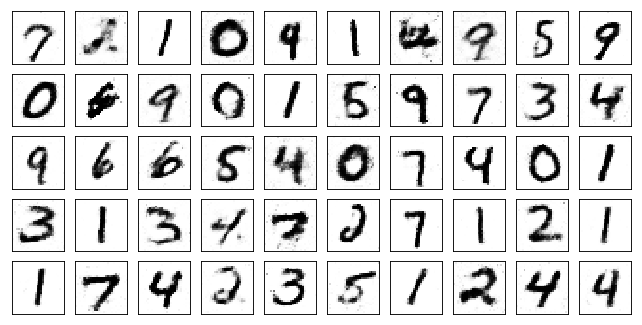

Test losses. G: 1.1284, D: 0.5457
Train Epoch: 63 [0/50000 (0%)]	Losses G: 1.1742, D: 0.5986
Train Epoch: 63 [5000/50000 (10%)]	Losses G: 1.1549, D: 0.5275
Train Epoch: 63 [10000/50000 (20%)]	Losses G: 1.0499, D: 0.6801
Train Epoch: 63 [15000/50000 (30%)]	Losses G: 0.9863, D: 0.5212
Train Epoch: 63 [20000/50000 (40%)]	Losses G: 1.0182, D: 0.5146
Train Epoch: 63 [25000/50000 (50%)]	Losses G: 1.0468, D: 0.5842
Train Epoch: 63 [30000/50000 (60%)]	Losses G: 1.1039, D: 0.6160
Train Epoch: 63 [35000/50000 (70%)]	Losses G: 1.0837, D: 0.5716
Train Epoch: 63 [40000/50000 (80%)]	Losses G: 1.2153, D: 0.5609
Train Epoch: 63 [45000/50000 (90%)]	Losses G: 1.0140, D: 0.5950
Train Epoch: 63 [50000/50000 (100%)]	Losses G: 1.0411, D: 0.6442


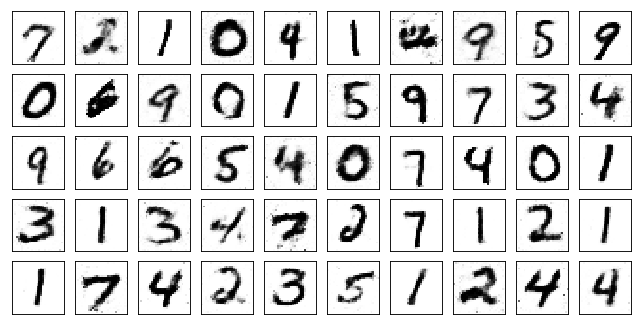

Test losses. G: 0.9729, D: 0.5091
Train Epoch: 64 [0/50000 (0%)]	Losses G: 0.9714, D: 0.4867
Train Epoch: 64 [5000/50000 (10%)]	Losses G: 1.1221, D: 0.5745
Train Epoch: 64 [10000/50000 (20%)]	Losses G: 1.1665, D: 0.5478
Train Epoch: 64 [15000/50000 (30%)]	Losses G: 1.0685, D: 0.5735
Train Epoch: 64 [20000/50000 (40%)]	Losses G: 1.0467, D: 0.5859
Train Epoch: 64 [25000/50000 (50%)]	Losses G: 1.0385, D: 0.6405
Train Epoch: 64 [30000/50000 (60%)]	Losses G: 1.0598, D: 0.5644
Train Epoch: 64 [35000/50000 (70%)]	Losses G: 1.2121, D: 0.6688
Train Epoch: 64 [40000/50000 (80%)]	Losses G: 1.2164, D: 0.6329
Train Epoch: 64 [45000/50000 (90%)]	Losses G: 1.1649, D: 0.5136
Train Epoch: 64 [50000/50000 (100%)]	Losses G: 1.1676, D: 0.5011


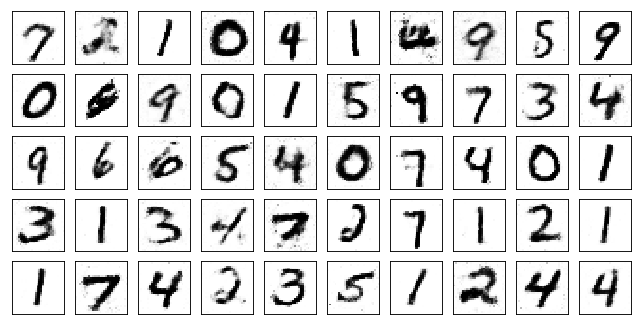

Test losses. G: 1.2785, D: 0.4875
Train Epoch: 65 [0/50000 (0%)]	Losses G: 1.0783, D: 0.5638
Train Epoch: 65 [5000/50000 (10%)]	Losses G: 1.0843, D: 0.5161
Train Epoch: 65 [10000/50000 (20%)]	Losses G: 1.1252, D: 0.5164
Train Epoch: 65 [15000/50000 (30%)]	Losses G: 1.1944, D: 0.5645
Train Epoch: 65 [20000/50000 (40%)]	Losses G: 1.3352, D: 0.5791
Train Epoch: 65 [25000/50000 (50%)]	Losses G: 1.1584, D: 0.5095
Train Epoch: 65 [30000/50000 (60%)]	Losses G: 0.9534, D: 0.5904
Train Epoch: 65 [35000/50000 (70%)]	Losses G: 1.1569, D: 0.5845
Train Epoch: 65 [40000/50000 (80%)]	Losses G: 1.1505, D: 0.6736
Train Epoch: 65 [45000/50000 (90%)]	Losses G: 0.8259, D: 0.5505
Train Epoch: 65 [50000/50000 (100%)]	Losses G: 0.9908, D: 0.5964


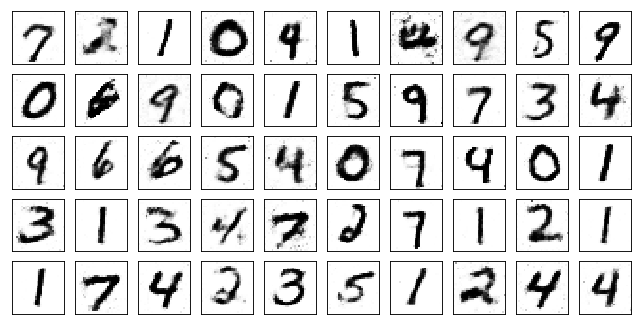

Test losses. G: 0.9967, D: 0.5391
Train Epoch: 66 [0/50000 (0%)]	Losses G: 1.0770, D: 0.4858
Train Epoch: 66 [5000/50000 (10%)]	Losses G: 1.0423, D: 0.5801
Train Epoch: 66 [10000/50000 (20%)]	Losses G: 1.2365, D: 0.5656
Train Epoch: 66 [15000/50000 (30%)]	Losses G: 1.2299, D: 0.5493
Train Epoch: 66 [20000/50000 (40%)]	Losses G: 1.1658, D: 0.6085
Train Epoch: 66 [25000/50000 (50%)]	Losses G: 1.0578, D: 0.5556
Train Epoch: 66 [30000/50000 (60%)]	Losses G: 1.0750, D: 0.6509
Train Epoch: 66 [35000/50000 (70%)]	Losses G: 1.0045, D: 0.5839
Train Epoch: 66 [40000/50000 (80%)]	Losses G: 1.0081, D: 0.6386
Train Epoch: 66 [45000/50000 (90%)]	Losses G: 1.0701, D: 0.6061
Train Epoch: 66 [50000/50000 (100%)]	Losses G: 1.0957, D: 0.5720


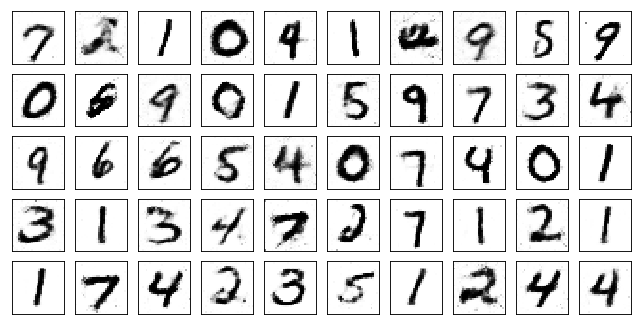

Test losses. G: 1.0922, D: 0.4921
Train Epoch: 67 [0/50000 (0%)]	Losses G: 1.1699, D: 0.5315
Train Epoch: 67 [5000/50000 (10%)]	Losses G: 1.2328, D: 0.5588
Train Epoch: 67 [10000/50000 (20%)]	Losses G: 1.1725, D: 0.5577
Train Epoch: 67 [15000/50000 (30%)]	Losses G: 0.9989, D: 0.6363
Train Epoch: 67 [20000/50000 (40%)]	Losses G: 1.1477, D: 0.5073
Train Epoch: 67 [25000/50000 (50%)]	Losses G: 1.3703, D: 0.5496
Train Epoch: 67 [30000/50000 (60%)]	Losses G: 1.1535, D: 0.5184
Train Epoch: 67 [35000/50000 (70%)]	Losses G: 1.2090, D: 0.5454
Train Epoch: 67 [40000/50000 (80%)]	Losses G: 0.9502, D: 0.4994
Train Epoch: 67 [45000/50000 (90%)]	Losses G: 0.9934, D: 0.6556
Train Epoch: 67 [50000/50000 (100%)]	Losses G: 1.0258, D: 0.6531


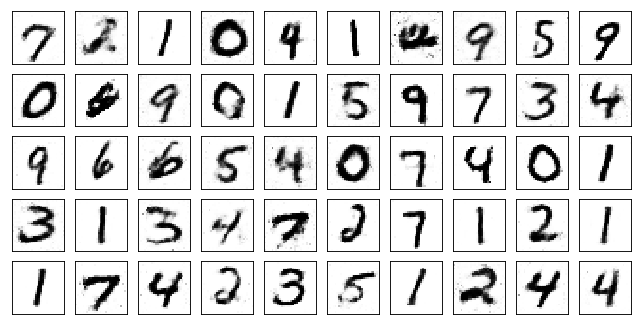

Test losses. G: 1.0549, D: 0.5198
Train Epoch: 68 [0/50000 (0%)]	Losses G: 0.9937, D: 0.5441
Train Epoch: 68 [5000/50000 (10%)]	Losses G: 1.1396, D: 0.5765
Train Epoch: 68 [10000/50000 (20%)]	Losses G: 1.0622, D: 0.5827
Train Epoch: 68 [15000/50000 (30%)]	Losses G: 1.1860, D: 0.5532
Train Epoch: 68 [20000/50000 (40%)]	Losses G: 0.9586, D: 0.6252
Train Epoch: 68 [25000/50000 (50%)]	Losses G: 1.0207, D: 0.5724
Train Epoch: 68 [30000/50000 (60%)]	Losses G: 1.0971, D: 0.5502
Train Epoch: 68 [35000/50000 (70%)]	Losses G: 0.9201, D: 0.5738
Train Epoch: 68 [40000/50000 (80%)]	Losses G: 1.1693, D: 0.6224
Train Epoch: 68 [45000/50000 (90%)]	Losses G: 1.1346, D: 0.5993
Train Epoch: 68 [50000/50000 (100%)]	Losses G: 1.1351, D: 0.6043


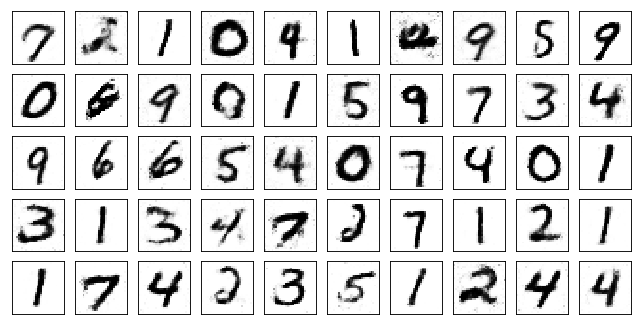

Test losses. G: 1.1719, D: 0.5197
Train Epoch: 69 [0/50000 (0%)]	Losses G: 1.4433, D: 0.4977
Train Epoch: 69 [5000/50000 (10%)]	Losses G: 1.2142, D: 0.5549
Train Epoch: 69 [10000/50000 (20%)]	Losses G: 1.0717, D: 0.6103
Train Epoch: 69 [15000/50000 (30%)]	Losses G: 1.1407, D: 0.5444
Train Epoch: 69 [20000/50000 (40%)]	Losses G: 0.8044, D: 0.6079
Train Epoch: 69 [25000/50000 (50%)]	Losses G: 0.9686, D: 0.6300
Train Epoch: 69 [30000/50000 (60%)]	Losses G: 1.2551, D: 0.6571
Train Epoch: 69 [35000/50000 (70%)]	Losses G: 1.1032, D: 0.5344
Train Epoch: 69 [40000/50000 (80%)]	Losses G: 1.1963, D: 0.5141
Train Epoch: 69 [45000/50000 (90%)]	Losses G: 1.0858, D: 0.5807
Train Epoch: 69 [50000/50000 (100%)]	Losses G: 0.8883, D: 0.5660


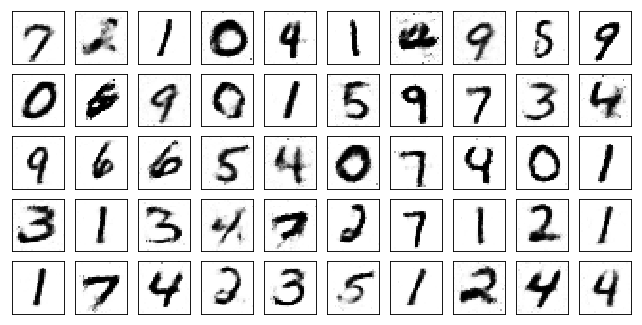

Test losses. G: 1.0227, D: 0.5167
Train Epoch: 70 [0/50000 (0%)]	Losses G: 1.0172, D: 0.6160
Train Epoch: 70 [5000/50000 (10%)]	Losses G: 0.9322, D: 0.6025
Train Epoch: 70 [10000/50000 (20%)]	Losses G: 1.0463, D: 0.5475
Train Epoch: 70 [15000/50000 (30%)]	Losses G: 1.2004, D: 0.5844
Train Epoch: 70 [20000/50000 (40%)]	Losses G: 1.2076, D: 0.5726
Train Epoch: 70 [25000/50000 (50%)]	Losses G: 0.9419, D: 0.5917
Train Epoch: 70 [30000/50000 (60%)]	Losses G: 0.9574, D: 0.6345
Train Epoch: 70 [35000/50000 (70%)]	Losses G: 1.1011, D: 0.5451
Train Epoch: 70 [40000/50000 (80%)]	Losses G: 1.0067, D: 0.5693
Train Epoch: 70 [45000/50000 (90%)]	Losses G: 0.9458, D: 0.6284
Train Epoch: 70 [50000/50000 (100%)]	Losses G: 0.8413, D: 0.6260


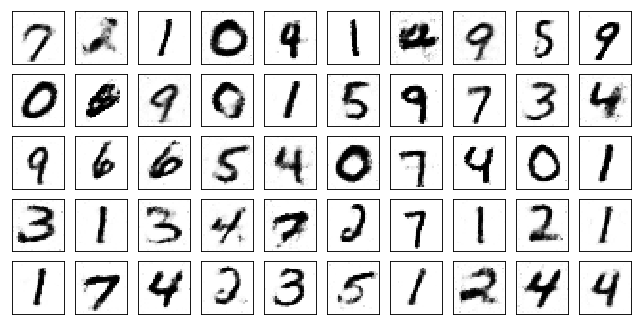

Test losses. G: 1.0633, D: 0.5386
Train Epoch: 71 [0/50000 (0%)]	Losses G: 1.1127, D: 0.5517
Train Epoch: 71 [5000/50000 (10%)]	Losses G: 0.9774, D: 0.5971
Train Epoch: 71 [10000/50000 (20%)]	Losses G: 0.9910, D: 0.5378
Train Epoch: 71 [15000/50000 (30%)]	Losses G: 1.1271, D: 0.5315
Train Epoch: 71 [20000/50000 (40%)]	Losses G: 1.3626, D: 0.5282
Train Epoch: 71 [25000/50000 (50%)]	Losses G: 1.1271, D: 0.6046
Train Epoch: 71 [30000/50000 (60%)]	Losses G: 1.0599, D: 0.6501
Train Epoch: 71 [35000/50000 (70%)]	Losses G: 0.9251, D: 0.5178
Train Epoch: 71 [40000/50000 (80%)]	Losses G: 1.2520, D: 0.5523
Train Epoch: 71 [45000/50000 (90%)]	Losses G: 1.0140, D: 0.5781
Train Epoch: 71 [50000/50000 (100%)]	Losses G: 1.2915, D: 0.5956


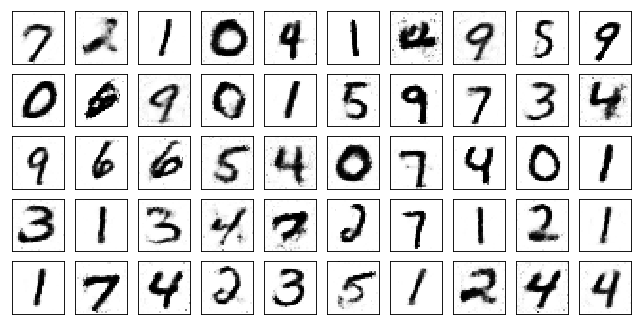

Test losses. G: 1.1020, D: 0.5401
Train Epoch: 72 [0/50000 (0%)]	Losses G: 1.1632, D: 0.5791
Train Epoch: 72 [5000/50000 (10%)]	Losses G: 1.0098, D: 0.5864
Train Epoch: 72 [10000/50000 (20%)]	Losses G: 0.9547, D: 0.5687
Train Epoch: 72 [15000/50000 (30%)]	Losses G: 1.3007, D: 0.4920
Train Epoch: 72 [20000/50000 (40%)]	Losses G: 1.1474, D: 0.4685
Train Epoch: 72 [25000/50000 (50%)]	Losses G: 1.0564, D: 0.5965
Train Epoch: 72 [30000/50000 (60%)]	Losses G: 1.1777, D: 0.5369
Train Epoch: 72 [35000/50000 (70%)]	Losses G: 1.0304, D: 0.4840
Train Epoch: 72 [40000/50000 (80%)]	Losses G: 1.1820, D: 0.5218
Train Epoch: 72 [45000/50000 (90%)]	Losses G: 1.0747, D: 0.5745
Train Epoch: 72 [50000/50000 (100%)]	Losses G: 1.0192, D: 0.6466


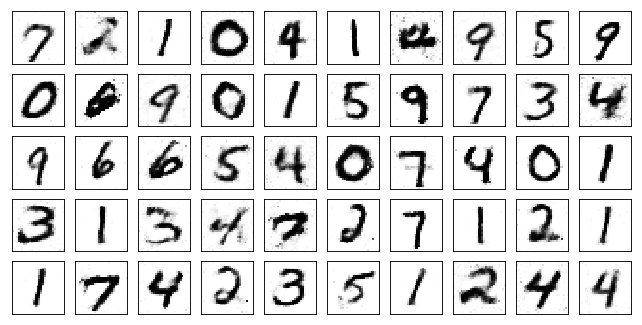

Test losses. G: 0.9874, D: 0.5784
Train Epoch: 73 [0/50000 (0%)]	Losses G: 1.0028, D: 0.6388
Train Epoch: 73 [5000/50000 (10%)]	Losses G: 1.1623, D: 0.5266
Train Epoch: 73 [10000/50000 (20%)]	Losses G: 1.0084, D: 0.5212
Train Epoch: 73 [15000/50000 (30%)]	Losses G: 1.0266, D: 0.5708
Train Epoch: 73 [20000/50000 (40%)]	Losses G: 0.9772, D: 0.6006
Train Epoch: 73 [25000/50000 (50%)]	Losses G: 1.1112, D: 0.5223
Train Epoch: 73 [30000/50000 (60%)]	Losses G: 1.0205, D: 0.5671
Train Epoch: 73 [35000/50000 (70%)]	Losses G: 0.8490, D: 0.6218
Train Epoch: 73 [40000/50000 (80%)]	Losses G: 1.2449, D: 0.5723
Train Epoch: 73 [45000/50000 (90%)]	Losses G: 1.0580, D: 0.6378
Train Epoch: 73 [50000/50000 (100%)]	Losses G: 1.1000, D: 0.5953


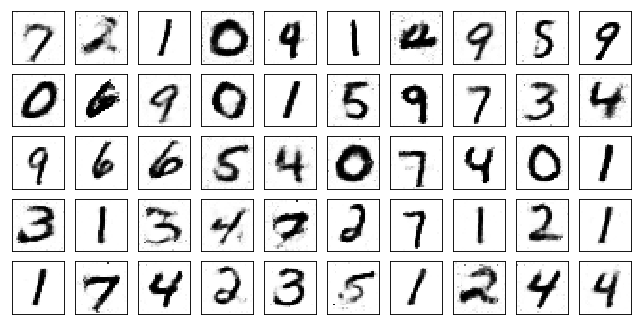

Test losses. G: 1.0040, D: 0.5504
Train Epoch: 74 [0/50000 (0%)]	Losses G: 1.1100, D: 0.6503
Train Epoch: 74 [5000/50000 (10%)]	Losses G: 1.0563, D: 0.5461
Train Epoch: 74 [10000/50000 (20%)]	Losses G: 0.9904, D: 0.5820
Train Epoch: 74 [15000/50000 (30%)]	Losses G: 0.9388, D: 0.5367
Train Epoch: 74 [20000/50000 (40%)]	Losses G: 0.9252, D: 0.5251
Train Epoch: 74 [25000/50000 (50%)]	Losses G: 1.1835, D: 0.5652
Train Epoch: 74 [30000/50000 (60%)]	Losses G: 1.0895, D: 0.5355
Train Epoch: 74 [35000/50000 (70%)]	Losses G: 1.1299, D: 0.4964
Train Epoch: 74 [40000/50000 (80%)]	Losses G: 0.8986, D: 0.6062
Train Epoch: 74 [45000/50000 (90%)]	Losses G: 1.0331, D: 0.5936
Train Epoch: 74 [50000/50000 (100%)]	Losses G: 1.1227, D: 0.5345


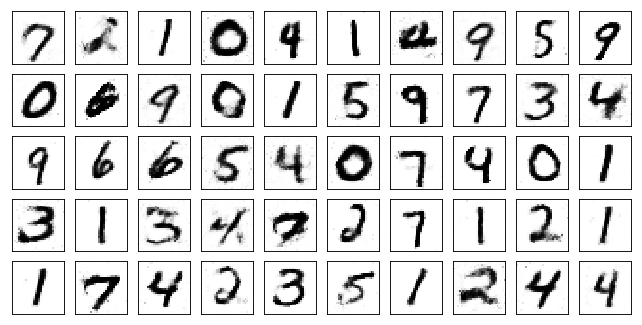

Test losses. G: 1.0261, D: 0.5152
Train Epoch: 75 [0/50000 (0%)]	Losses G: 1.1685, D: 0.5145
Train Epoch: 75 [5000/50000 (10%)]	Losses G: 1.2468, D: 0.5736
Train Epoch: 75 [10000/50000 (20%)]	Losses G: 1.3248, D: 0.5601
Train Epoch: 75 [15000/50000 (30%)]	Losses G: 1.1607, D: 0.5259
Train Epoch: 75 [20000/50000 (40%)]	Losses G: 0.9631, D: 0.5170
Train Epoch: 75 [25000/50000 (50%)]	Losses G: 0.8385, D: 0.5565
Train Epoch: 75 [30000/50000 (60%)]	Losses G: 0.9921, D: 0.6074
Train Epoch: 75 [35000/50000 (70%)]	Losses G: 1.0656, D: 0.5820
Train Epoch: 75 [40000/50000 (80%)]	Losses G: 0.9211, D: 0.6265
Train Epoch: 75 [45000/50000 (90%)]	Losses G: 0.9837, D: 0.5593
Train Epoch: 75 [50000/50000 (100%)]	Losses G: 1.2516, D: 0.5769


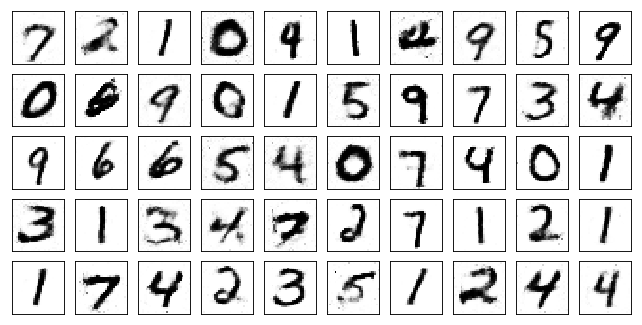

Test losses. G: 0.9796, D: 0.5233
Train Epoch: 76 [0/50000 (0%)]	Losses G: 1.0674, D: 0.6113
Train Epoch: 76 [5000/50000 (10%)]	Losses G: 1.1196, D: 0.5426
Train Epoch: 76 [10000/50000 (20%)]	Losses G: 1.0700, D: 0.5687
Train Epoch: 76 [15000/50000 (30%)]	Losses G: 1.0976, D: 0.5383
Train Epoch: 76 [20000/50000 (40%)]	Losses G: 0.8892, D: 0.6378
Train Epoch: 76 [25000/50000 (50%)]	Losses G: 0.8435, D: 0.5467
Train Epoch: 76 [30000/50000 (60%)]	Losses G: 1.0381, D: 0.6085
Train Epoch: 76 [35000/50000 (70%)]	Losses G: 0.9233, D: 0.5805
Train Epoch: 76 [40000/50000 (80%)]	Losses G: 0.8556, D: 0.5929
Train Epoch: 76 [45000/50000 (90%)]	Losses G: 1.0656, D: 0.6182
Train Epoch: 76 [50000/50000 (100%)]	Losses G: 0.9130, D: 0.5556


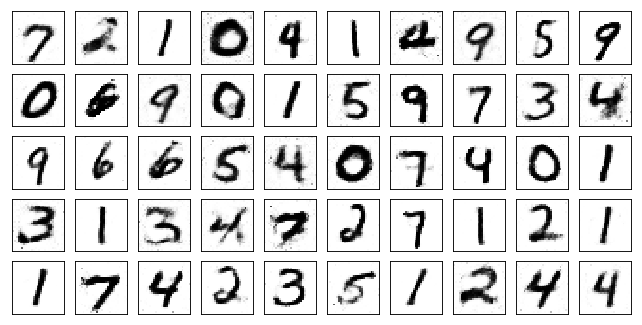

Test losses. G: 0.9794, D: 0.5468
Train Epoch: 77 [0/50000 (0%)]	Losses G: 0.9689, D: 0.5783
Train Epoch: 77 [5000/50000 (10%)]	Losses G: 1.2574, D: 0.6124
Train Epoch: 77 [10000/50000 (20%)]	Losses G: 0.9425, D: 0.6100
Train Epoch: 77 [15000/50000 (30%)]	Losses G: 0.9564, D: 0.5689
Train Epoch: 77 [20000/50000 (40%)]	Losses G: 1.1670, D: 0.5724
Train Epoch: 77 [25000/50000 (50%)]	Losses G: 1.2021, D: 0.6314
Train Epoch: 77 [30000/50000 (60%)]	Losses G: 1.0468, D: 0.6614
Train Epoch: 77 [35000/50000 (70%)]	Losses G: 1.2301, D: 0.5476
Train Epoch: 77 [40000/50000 (80%)]	Losses G: 0.9902, D: 0.5050
Train Epoch: 77 [45000/50000 (90%)]	Losses G: 1.1334, D: 0.5965
Train Epoch: 77 [50000/50000 (100%)]	Losses G: 1.0706, D: 0.5359


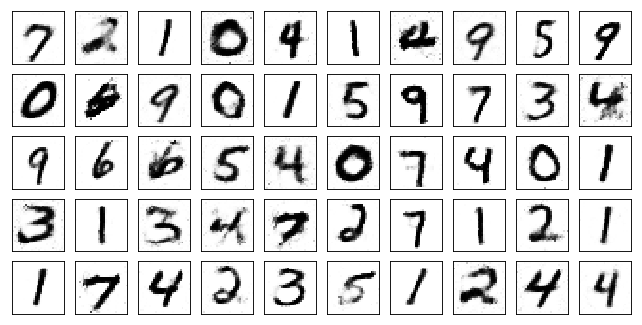

Test losses. G: 1.0482, D: 0.5394
Train Epoch: 78 [0/50000 (0%)]	Losses G: 1.0193, D: 0.6539
Train Epoch: 78 [5000/50000 (10%)]	Losses G: 0.9750, D: 0.6316
Train Epoch: 78 [10000/50000 (20%)]	Losses G: 1.0791, D: 0.6086
Train Epoch: 78 [15000/50000 (30%)]	Losses G: 1.3330, D: 0.4622
Train Epoch: 78 [20000/50000 (40%)]	Losses G: 0.9614, D: 0.6126
Train Epoch: 78 [25000/50000 (50%)]	Losses G: 0.9104, D: 0.5652
Train Epoch: 78 [30000/50000 (60%)]	Losses G: 0.9039, D: 0.6076
Train Epoch: 78 [35000/50000 (70%)]	Losses G: 0.9941, D: 0.6096
Train Epoch: 78 [40000/50000 (80%)]	Losses G: 1.1507, D: 0.5534
Train Epoch: 78 [45000/50000 (90%)]	Losses G: 1.2466, D: 0.5827
Train Epoch: 78 [50000/50000 (100%)]	Losses G: 1.0973, D: 0.5654


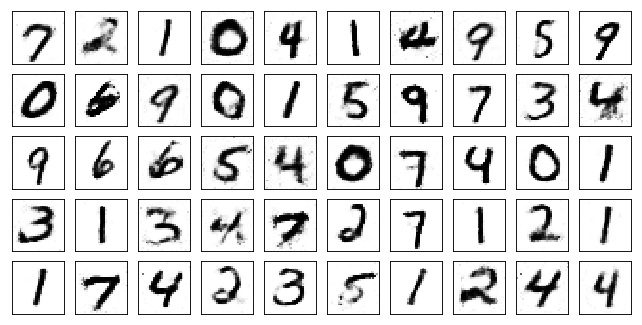

Test losses. G: 1.1234, D: 0.5014
Train Epoch: 79 [0/50000 (0%)]	Losses G: 1.2215, D: 0.5438
Train Epoch: 79 [5000/50000 (10%)]	Losses G: 1.0828, D: 0.5759
Train Epoch: 79 [10000/50000 (20%)]	Losses G: 1.1744, D: 0.5471
Train Epoch: 79 [15000/50000 (30%)]	Losses G: 1.0186, D: 0.5111
Train Epoch: 79 [20000/50000 (40%)]	Losses G: 1.0828, D: 0.5700
Train Epoch: 79 [25000/50000 (50%)]	Losses G: 0.9937, D: 0.5620
Train Epoch: 79 [30000/50000 (60%)]	Losses G: 1.0511, D: 0.5712
Train Epoch: 79 [35000/50000 (70%)]	Losses G: 0.8595, D: 0.5710
Train Epoch: 79 [40000/50000 (80%)]	Losses G: 1.2288, D: 0.5324
Train Epoch: 79 [45000/50000 (90%)]	Losses G: 1.0355, D: 0.6654
Train Epoch: 79 [50000/50000 (100%)]	Losses G: 1.2577, D: 0.4627


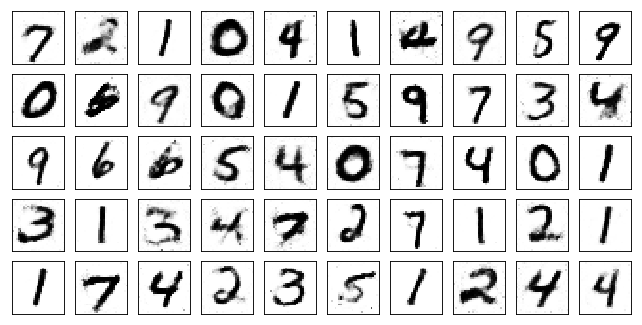

Test losses. G: 1.0288, D: 0.5138
Train Epoch: 80 [0/50000 (0%)]	Losses G: 1.1644, D: 0.5883
Train Epoch: 80 [5000/50000 (10%)]	Losses G: 1.1585, D: 0.5388
Train Epoch: 80 [10000/50000 (20%)]	Losses G: 1.3640, D: 0.4834
Train Epoch: 80 [15000/50000 (30%)]	Losses G: 1.0818, D: 0.5749
Train Epoch: 80 [20000/50000 (40%)]	Losses G: 0.9343, D: 0.4931
Train Epoch: 80 [25000/50000 (50%)]	Losses G: 1.0363, D: 0.7040
Train Epoch: 80 [30000/50000 (60%)]	Losses G: 1.0849, D: 0.5946
Train Epoch: 80 [35000/50000 (70%)]	Losses G: 0.9349, D: 0.5652
Train Epoch: 80 [40000/50000 (80%)]	Losses G: 1.0360, D: 0.5277
Train Epoch: 80 [45000/50000 (90%)]	Losses G: 0.8413, D: 0.6406
Train Epoch: 80 [50000/50000 (100%)]	Losses G: 1.0055, D: 0.6219


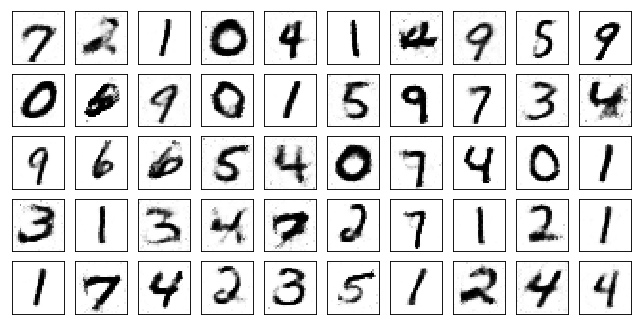

Test losses. G: 0.8656, D: 0.5672
Train Epoch: 81 [0/50000 (0%)]	Losses G: 0.9038, D: 0.6200
Train Epoch: 81 [5000/50000 (10%)]	Losses G: 0.9684, D: 0.6583
Train Epoch: 81 [10000/50000 (20%)]	Losses G: 1.1145, D: 0.6007
Train Epoch: 81 [15000/50000 (30%)]	Losses G: 0.9476, D: 0.6022
Train Epoch: 81 [20000/50000 (40%)]	Losses G: 1.0923, D: 0.5779
Train Epoch: 81 [25000/50000 (50%)]	Losses G: 1.2541, D: 0.6013
Train Epoch: 81 [30000/50000 (60%)]	Losses G: 1.1890, D: 0.5821
Train Epoch: 81 [35000/50000 (70%)]	Losses G: 1.0966, D: 0.5714
Train Epoch: 81 [40000/50000 (80%)]	Losses G: 1.0051, D: 0.5802
Train Epoch: 81 [45000/50000 (90%)]	Losses G: 1.2820, D: 0.5913
Train Epoch: 81 [50000/50000 (100%)]	Losses G: 1.0073, D: 0.6288


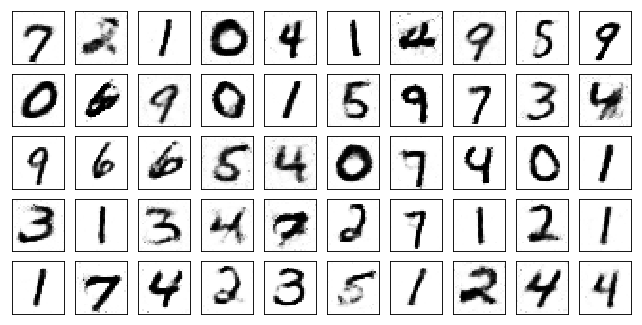

Test losses. G: 1.0450, D: 0.5239
Train Epoch: 82 [0/50000 (0%)]	Losses G: 0.9166, D: 0.5822
Train Epoch: 82 [5000/50000 (10%)]	Losses G: 1.0813, D: 0.5860
Train Epoch: 82 [10000/50000 (20%)]	Losses G: 0.9802, D: 0.6179
Train Epoch: 82 [15000/50000 (30%)]	Losses G: 1.2168, D: 0.5854
Train Epoch: 82 [20000/50000 (40%)]	Losses G: 0.9988, D: 0.4920
Train Epoch: 82 [25000/50000 (50%)]	Losses G: 1.0710, D: 0.5433
Train Epoch: 82 [30000/50000 (60%)]	Losses G: 0.9848, D: 0.5538
Train Epoch: 82 [35000/50000 (70%)]	Losses G: 0.8887, D: 0.5889
Train Epoch: 82 [40000/50000 (80%)]	Losses G: 1.1392, D: 0.6841
Train Epoch: 82 [45000/50000 (90%)]	Losses G: 1.0638, D: 0.5092
Train Epoch: 82 [50000/50000 (100%)]	Losses G: 1.1831, D: 0.5317


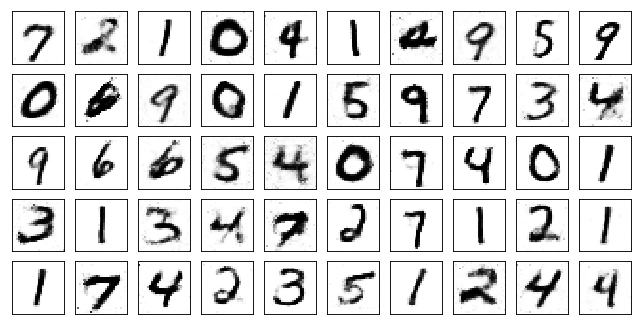

Test losses. G: 1.0311, D: 0.5370
Train Epoch: 83 [0/50000 (0%)]	Losses G: 1.0135, D: 0.5191
Train Epoch: 83 [5000/50000 (10%)]	Losses G: 1.0828, D: 0.5508
Train Epoch: 83 [10000/50000 (20%)]	Losses G: 1.0553, D: 0.5962
Train Epoch: 83 [15000/50000 (30%)]	Losses G: 1.0594, D: 0.5989
Train Epoch: 83 [20000/50000 (40%)]	Losses G: 1.0726, D: 0.5521
Train Epoch: 83 [25000/50000 (50%)]	Losses G: 1.0831, D: 0.6511
Train Epoch: 83 [30000/50000 (60%)]	Losses G: 1.1004, D: 0.6176
Train Epoch: 83 [35000/50000 (70%)]	Losses G: 1.0462, D: 0.5591
Train Epoch: 83 [40000/50000 (80%)]	Losses G: 1.3598, D: 0.5380
Train Epoch: 83 [45000/50000 (90%)]	Losses G: 1.0577, D: 0.6033
Train Epoch: 83 [50000/50000 (100%)]	Losses G: 0.9599, D: 0.5477


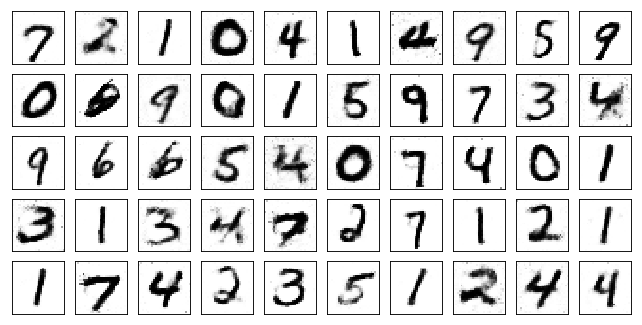

Test losses. G: 1.1280, D: 0.4900
Train Epoch: 84 [0/50000 (0%)]	Losses G: 0.9858, D: 0.5665
Train Epoch: 84 [5000/50000 (10%)]	Losses G: 0.9642, D: 0.5421
Train Epoch: 84 [10000/50000 (20%)]	Losses G: 1.1457, D: 0.6469
Train Epoch: 84 [15000/50000 (30%)]	Losses G: 1.1841, D: 0.5314
Train Epoch: 84 [20000/50000 (40%)]	Losses G: 0.9467, D: 0.5270
Train Epoch: 84 [25000/50000 (50%)]	Losses G: 0.9318, D: 0.5722
Train Epoch: 84 [30000/50000 (60%)]	Losses G: 0.9577, D: 0.6341
Train Epoch: 84 [35000/50000 (70%)]	Losses G: 1.0065, D: 0.5266
Train Epoch: 84 [40000/50000 (80%)]	Losses G: 1.1276, D: 0.6167
Train Epoch: 84 [45000/50000 (90%)]	Losses G: 1.0942, D: 0.5897
Train Epoch: 84 [50000/50000 (100%)]	Losses G: 0.8219, D: 0.6235


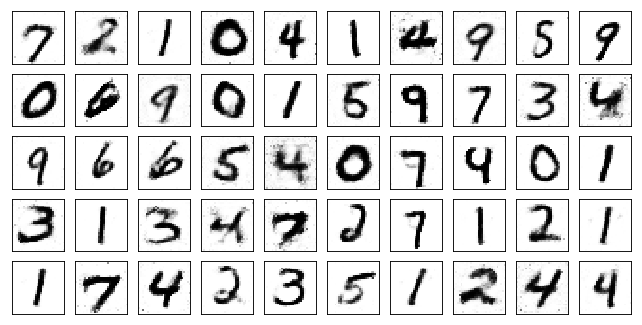

Test losses. G: 0.9321, D: 0.5578
Train Epoch: 85 [0/50000 (0%)]	Losses G: 0.7889, D: 0.5864
Train Epoch: 85 [5000/50000 (10%)]	Losses G: 1.0319, D: 0.6529
Train Epoch: 85 [10000/50000 (20%)]	Losses G: 0.9094, D: 0.5898
Train Epoch: 85 [15000/50000 (30%)]	Losses G: 1.1840, D: 0.6105
Train Epoch: 85 [20000/50000 (40%)]	Losses G: 1.0227, D: 0.5036
Train Epoch: 85 [25000/50000 (50%)]	Losses G: 1.0071, D: 0.5770
Train Epoch: 85 [30000/50000 (60%)]	Losses G: 0.8608, D: 0.5555
Train Epoch: 85 [35000/50000 (70%)]	Losses G: 0.9545, D: 0.6103
Train Epoch: 85 [40000/50000 (80%)]	Losses G: 1.0469, D: 0.6496
Train Epoch: 85 [45000/50000 (90%)]	Losses G: 1.0954, D: 0.5429
Train Epoch: 85 [50000/50000 (100%)]	Losses G: 1.0526, D: 0.5964


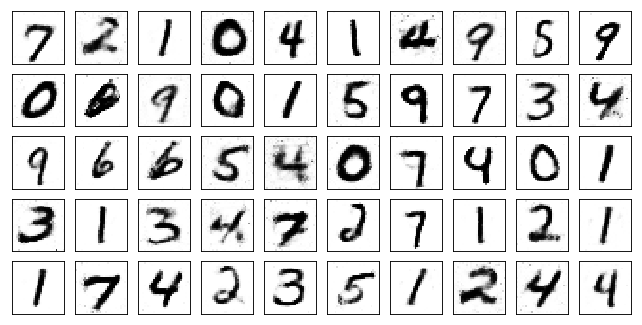

Test losses. G: 1.2799, D: 0.5251
Train Epoch: 86 [0/50000 (0%)]	Losses G: 1.0725, D: 0.6165
Train Epoch: 86 [5000/50000 (10%)]	Losses G: 1.1164, D: 0.5659
Train Epoch: 86 [10000/50000 (20%)]	Losses G: 1.0894, D: 0.5988
Train Epoch: 86 [15000/50000 (30%)]	Losses G: 1.2034, D: 0.5250
Train Epoch: 86 [20000/50000 (40%)]	Losses G: 0.9550, D: 0.6079
Train Epoch: 86 [25000/50000 (50%)]	Losses G: 1.0614, D: 0.5652
Train Epoch: 86 [30000/50000 (60%)]	Losses G: 1.0501, D: 0.6348
Train Epoch: 86 [35000/50000 (70%)]	Losses G: 0.8539, D: 0.6437
Train Epoch: 86 [40000/50000 (80%)]	Losses G: 0.8930, D: 0.5939
Train Epoch: 86 [45000/50000 (90%)]	Losses G: 0.8795, D: 0.5792
Train Epoch: 86 [50000/50000 (100%)]	Losses G: 1.1508, D: 0.5096


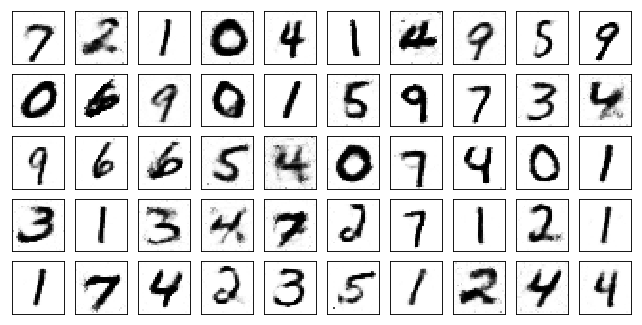

Test losses. G: 0.9762, D: 0.5402
Train Epoch: 87 [0/50000 (0%)]	Losses G: 1.0402, D: 0.5701
Train Epoch: 87 [5000/50000 (10%)]	Losses G: 1.0663, D: 0.5468
Train Epoch: 87 [10000/50000 (20%)]	Losses G: 1.1803, D: 0.5664
Train Epoch: 87 [15000/50000 (30%)]	Losses G: 1.1048, D: 0.5156
Train Epoch: 87 [20000/50000 (40%)]	Losses G: 0.9583, D: 0.5936
Train Epoch: 87 [25000/50000 (50%)]	Losses G: 0.9317, D: 0.5244
Train Epoch: 87 [30000/50000 (60%)]	Losses G: 1.1856, D: 0.5819
Train Epoch: 87 [35000/50000 (70%)]	Losses G: 1.0073, D: 0.5991
Train Epoch: 87 [40000/50000 (80%)]	Losses G: 0.9578, D: 0.5281
Train Epoch: 87 [45000/50000 (90%)]	Losses G: 1.0998, D: 0.5592
Train Epoch: 87 [50000/50000 (100%)]	Losses G: 1.2268, D: 0.5754


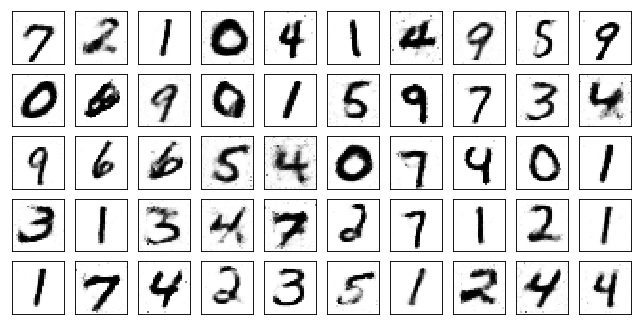

Test losses. G: 0.9795, D: 0.5794
Train Epoch: 88 [0/50000 (0%)]	Losses G: 1.2678, D: 0.5998
Train Epoch: 88 [5000/50000 (10%)]	Losses G: 1.1115, D: 0.5427
Train Epoch: 88 [10000/50000 (20%)]	Losses G: 1.1432, D: 0.5301
Train Epoch: 88 [15000/50000 (30%)]	Losses G: 1.1386, D: 0.5358
Train Epoch: 88 [20000/50000 (40%)]	Losses G: 1.1573, D: 0.6020
Train Epoch: 88 [25000/50000 (50%)]	Losses G: 1.0884, D: 0.5530
Train Epoch: 88 [30000/50000 (60%)]	Losses G: 0.9324, D: 0.6318
Train Epoch: 88 [35000/50000 (70%)]	Losses G: 0.8410, D: 0.5730
Train Epoch: 88 [40000/50000 (80%)]	Losses G: 1.0587, D: 0.5376
Train Epoch: 88 [45000/50000 (90%)]	Losses G: 1.1414, D: 0.4768
Train Epoch: 88 [50000/50000 (100%)]	Losses G: 1.0282, D: 0.6493


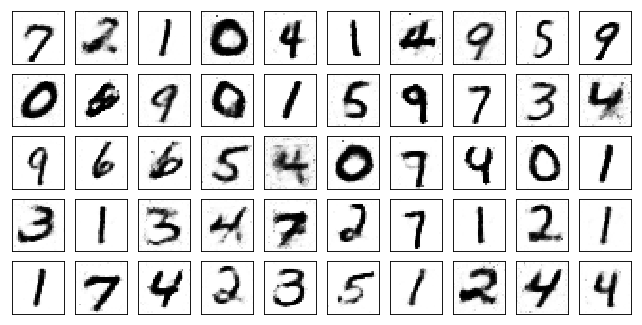

Test losses. G: 0.9723, D: 0.5629
Train Epoch: 89 [0/50000 (0%)]	Losses G: 0.9301, D: 0.5699
Train Epoch: 89 [5000/50000 (10%)]	Losses G: 1.0705, D: 0.5877
Train Epoch: 89 [10000/50000 (20%)]	Losses G: 1.1154, D: 0.6351
Train Epoch: 89 [15000/50000 (30%)]	Losses G: 1.2964, D: 0.5596
Train Epoch: 89 [20000/50000 (40%)]	Losses G: 1.2253, D: 0.5273
Train Epoch: 89 [25000/50000 (50%)]	Losses G: 1.0269, D: 0.6133
Train Epoch: 89 [30000/50000 (60%)]	Losses G: 0.9469, D: 0.6281
Train Epoch: 89 [35000/50000 (70%)]	Losses G: 1.1645, D: 0.5729
Train Epoch: 89 [40000/50000 (80%)]	Losses G: 1.1837, D: 0.5948
Train Epoch: 89 [45000/50000 (90%)]	Losses G: 1.1043, D: 0.5800
Train Epoch: 89 [50000/50000 (100%)]	Losses G: 0.9861, D: 0.5438


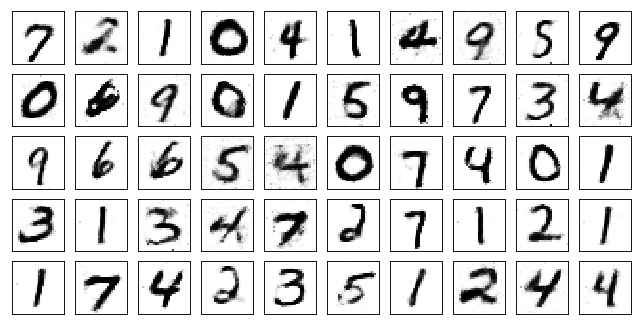

Test losses. G: 1.1098, D: 0.5384
Train Epoch: 90 [0/50000 (0%)]	Losses G: 1.0007, D: 0.5438
Train Epoch: 90 [5000/50000 (10%)]	Losses G: 0.9875, D: 0.4900
Train Epoch: 90 [10000/50000 (20%)]	Losses G: 1.0888, D: 0.5193
Train Epoch: 90 [15000/50000 (30%)]	Losses G: 0.9418, D: 0.5770
Train Epoch: 90 [20000/50000 (40%)]	Losses G: 0.9198, D: 0.5836
Train Epoch: 90 [25000/50000 (50%)]	Losses G: 1.0302, D: 0.6168
Train Epoch: 90 [30000/50000 (60%)]	Losses G: 0.8969, D: 0.6241
Train Epoch: 90 [35000/50000 (70%)]	Losses G: 0.8969, D: 0.5273
Train Epoch: 90 [40000/50000 (80%)]	Losses G: 0.9678, D: 0.6034
Train Epoch: 90 [45000/50000 (90%)]	Losses G: 1.0231, D: 0.6276
Train Epoch: 90 [50000/50000 (100%)]	Losses G: 0.9816, D: 0.5825


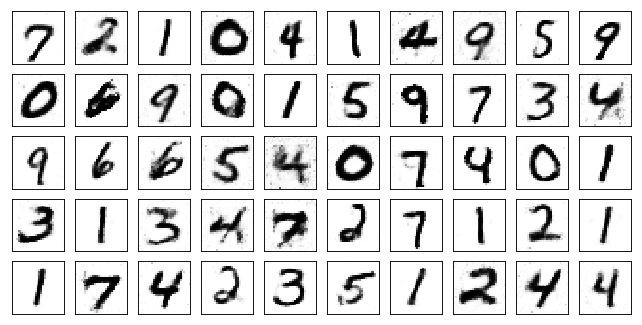

Test losses. G: 0.8782, D: 0.5493
Train Epoch: 91 [0/50000 (0%)]	Losses G: 0.7913, D: 0.5985
Train Epoch: 91 [5000/50000 (10%)]	Losses G: 1.0432, D: 0.5876
Train Epoch: 91 [10000/50000 (20%)]	Losses G: 1.0552, D: 0.5868
Train Epoch: 91 [15000/50000 (30%)]	Losses G: 1.1679, D: 0.6228
Train Epoch: 91 [20000/50000 (40%)]	Losses G: 1.2339, D: 0.5080
Train Epoch: 91 [25000/50000 (50%)]	Losses G: 0.9910, D: 0.6304
Train Epoch: 91 [30000/50000 (60%)]	Losses G: 1.2017, D: 0.6290
Train Epoch: 91 [35000/50000 (70%)]	Losses G: 1.1073, D: 0.5162
Train Epoch: 91 [40000/50000 (80%)]	Losses G: 1.2998, D: 0.5542
Train Epoch: 91 [45000/50000 (90%)]	Losses G: 1.1542, D: 0.6173
Train Epoch: 91 [50000/50000 (100%)]	Losses G: 1.2472, D: 0.6012


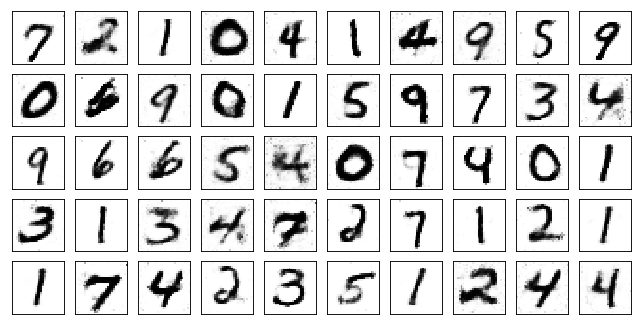

Test losses. G: 1.2253, D: 0.5480
Train Epoch: 92 [0/50000 (0%)]	Losses G: 1.4577, D: 0.5296
Train Epoch: 92 [5000/50000 (10%)]	Losses G: 0.9290, D: 0.6257
Train Epoch: 92 [10000/50000 (20%)]	Losses G: 1.2111, D: 0.5516
Train Epoch: 92 [15000/50000 (30%)]	Losses G: 1.0468, D: 0.5813
Train Epoch: 92 [20000/50000 (40%)]	Losses G: 1.0530, D: 0.5454
Train Epoch: 92 [25000/50000 (50%)]	Losses G: 1.1454, D: 0.5993
Train Epoch: 92 [30000/50000 (60%)]	Losses G: 1.0105, D: 0.5807
Train Epoch: 92 [35000/50000 (70%)]	Losses G: 1.1242, D: 0.5055
Train Epoch: 92 [40000/50000 (80%)]	Losses G: 0.8818, D: 0.5568
Train Epoch: 92 [45000/50000 (90%)]	Losses G: 1.1333, D: 0.6249
Train Epoch: 92 [50000/50000 (100%)]	Losses G: 1.0308, D: 0.5689


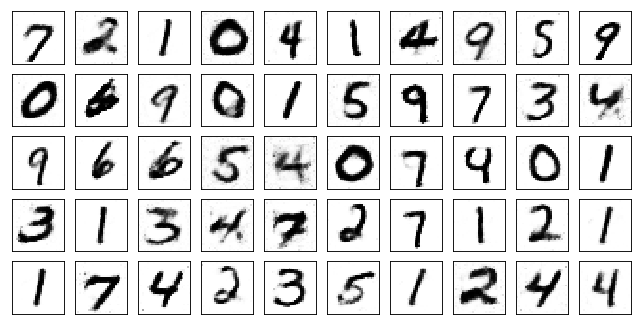

Test losses. G: 1.0688, D: 0.5570
Train Epoch: 93 [0/50000 (0%)]	Losses G: 0.9977, D: 0.5165
Train Epoch: 93 [5000/50000 (10%)]	Losses G: 0.9120, D: 0.5853
Train Epoch: 93 [10000/50000 (20%)]	Losses G: 1.0081, D: 0.5725
Train Epoch: 93 [15000/50000 (30%)]	Losses G: 1.0827, D: 0.5517
Train Epoch: 93 [20000/50000 (40%)]	Losses G: 0.9447, D: 0.5848
Train Epoch: 93 [25000/50000 (50%)]	Losses G: 1.1848, D: 0.6334
Train Epoch: 93 [30000/50000 (60%)]	Losses G: 0.9655, D: 0.5784
Train Epoch: 93 [35000/50000 (70%)]	Losses G: 1.1490, D: 0.5911
Train Epoch: 93 [40000/50000 (80%)]	Losses G: 1.0524, D: 0.6048
Train Epoch: 93 [45000/50000 (90%)]	Losses G: 1.0899, D: 0.5983
Train Epoch: 93 [50000/50000 (100%)]	Losses G: 0.9846, D: 0.5944


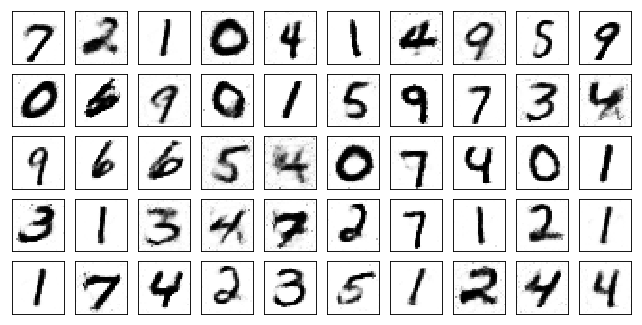

Test losses. G: 0.9098, D: 0.5525
Train Epoch: 94 [0/50000 (0%)]	Losses G: 0.8846, D: 0.5994
Train Epoch: 94 [5000/50000 (10%)]	Losses G: 1.1411, D: 0.5766
Train Epoch: 94 [10000/50000 (20%)]	Losses G: 1.1533, D: 0.5474
Train Epoch: 94 [15000/50000 (30%)]	Losses G: 1.0516, D: 0.5747
Train Epoch: 94 [20000/50000 (40%)]	Losses G: 1.1149, D: 0.6271
Train Epoch: 94 [25000/50000 (50%)]	Losses G: 1.1055, D: 0.5896
Train Epoch: 94 [30000/50000 (60%)]	Losses G: 0.9083, D: 0.6159
Train Epoch: 94 [35000/50000 (70%)]	Losses G: 1.0537, D: 0.6104
Train Epoch: 94 [40000/50000 (80%)]	Losses G: 0.8658, D: 0.5983
Train Epoch: 94 [45000/50000 (90%)]	Losses G: 1.0222, D: 0.6044
Train Epoch: 94 [50000/50000 (100%)]	Losses G: 0.9941, D: 0.5372


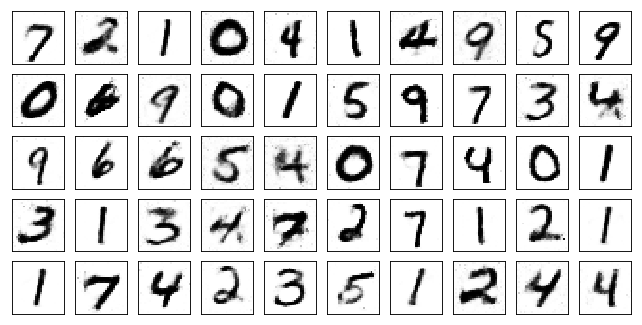

Test losses. G: 1.0096, D: 0.5529
Train Epoch: 95 [0/50000 (0%)]	Losses G: 1.2181, D: 0.6296
Train Epoch: 95 [5000/50000 (10%)]	Losses G: 0.9310, D: 0.6466
Train Epoch: 95 [10000/50000 (20%)]	Losses G: 1.0486, D: 0.5833
Train Epoch: 95 [15000/50000 (30%)]	Losses G: 1.0521, D: 0.5275
Train Epoch: 95 [20000/50000 (40%)]	Losses G: 1.0346, D: 0.5986
Train Epoch: 95 [25000/50000 (50%)]	Losses G: 1.2236, D: 0.5395
Train Epoch: 95 [30000/50000 (60%)]	Losses G: 1.0212, D: 0.5833
Train Epoch: 95 [35000/50000 (70%)]	Losses G: 0.9942, D: 0.6367
Train Epoch: 95 [40000/50000 (80%)]	Losses G: 1.1263, D: 0.4337
Train Epoch: 95 [45000/50000 (90%)]	Losses G: 1.0222, D: 0.5771
Train Epoch: 95 [50000/50000 (100%)]	Losses G: 0.9123, D: 0.6213


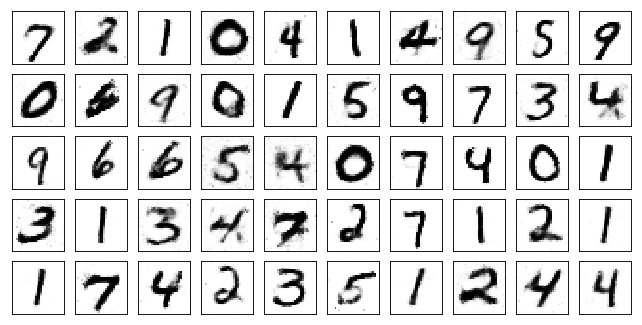

Test losses. G: 1.0508, D: 0.5214
Train Epoch: 96 [0/50000 (0%)]	Losses G: 0.9171, D: 0.4735
Train Epoch: 96 [5000/50000 (10%)]	Losses G: 1.0035, D: 0.5211
Train Epoch: 96 [10000/50000 (20%)]	Losses G: 0.9577, D: 0.5745
Train Epoch: 96 [15000/50000 (30%)]	Losses G: 1.1778, D: 0.5289
Train Epoch: 96 [20000/50000 (40%)]	Losses G: 1.1219, D: 0.5795
Train Epoch: 96 [25000/50000 (50%)]	Losses G: 1.0802, D: 0.4811
Train Epoch: 96 [30000/50000 (60%)]	Losses G: 0.9961, D: 0.5760
Train Epoch: 96 [35000/50000 (70%)]	Losses G: 1.0092, D: 0.6162
Train Epoch: 96 [40000/50000 (80%)]	Losses G: 1.0899, D: 0.6127
Train Epoch: 96 [45000/50000 (90%)]	Losses G: 0.9669, D: 0.6047
Train Epoch: 96 [50000/50000 (100%)]	Losses G: 1.0225, D: 0.5894


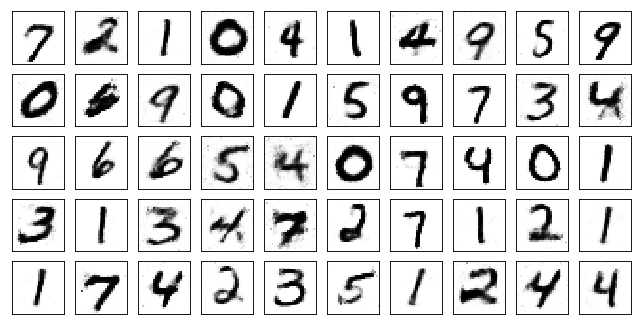

Test losses. G: 1.0003, D: 0.5417
Train Epoch: 97 [0/50000 (0%)]	Losses G: 0.9161, D: 0.5525
Train Epoch: 97 [5000/50000 (10%)]	Losses G: 1.0652, D: 0.5246
Train Epoch: 97 [10000/50000 (20%)]	Losses G: 1.2452, D: 0.6058
Train Epoch: 97 [15000/50000 (30%)]	Losses G: 0.9123, D: 0.5512
Train Epoch: 97 [20000/50000 (40%)]	Losses G: 1.0452, D: 0.5898
Train Epoch: 97 [25000/50000 (50%)]	Losses G: 1.0316, D: 0.5724
Train Epoch: 97 [30000/50000 (60%)]	Losses G: 1.0712, D: 0.6833
Train Epoch: 97 [35000/50000 (70%)]	Losses G: 1.0440, D: 0.5520
Train Epoch: 97 [40000/50000 (80%)]	Losses G: 1.0530, D: 0.6612
Train Epoch: 97 [45000/50000 (90%)]	Losses G: 1.1785, D: 0.5958
Train Epoch: 97 [50000/50000 (100%)]	Losses G: 0.8796, D: 0.6159


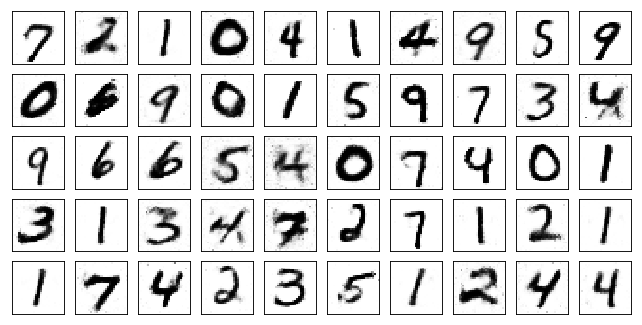

Test losses. G: 0.9127, D: 0.5714
Train Epoch: 98 [0/50000 (0%)]	Losses G: 0.9662, D: 0.5941
Train Epoch: 98 [5000/50000 (10%)]	Losses G: 0.8187, D: 0.5999
Train Epoch: 98 [10000/50000 (20%)]	Losses G: 0.9863, D: 0.6822
Train Epoch: 98 [15000/50000 (30%)]	Losses G: 1.1951, D: 0.5395
Train Epoch: 98 [20000/50000 (40%)]	Losses G: 1.0541, D: 0.5662
Train Epoch: 98 [25000/50000 (50%)]	Losses G: 1.0797, D: 0.5762
Train Epoch: 98 [30000/50000 (60%)]	Losses G: 1.1804, D: 0.5698
Train Epoch: 98 [35000/50000 (70%)]	Losses G: 1.1580, D: 0.5266
Train Epoch: 98 [40000/50000 (80%)]	Losses G: 1.1711, D: 0.5887
Train Epoch: 98 [45000/50000 (90%)]	Losses G: 1.0662, D: 0.5995
Train Epoch: 98 [50000/50000 (100%)]	Losses G: 1.0188, D: 0.5389


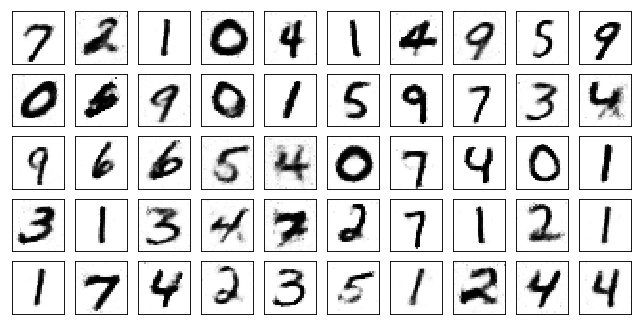

Test losses. G: 1.0625, D: 0.5418
Train Epoch: 99 [0/50000 (0%)]	Losses G: 0.9871, D: 0.6006
Train Epoch: 99 [5000/50000 (10%)]	Losses G: 0.9425, D: 0.6110
Train Epoch: 99 [10000/50000 (20%)]	Losses G: 1.2607, D: 0.5522
Train Epoch: 99 [15000/50000 (30%)]	Losses G: 0.9387, D: 0.5698
Train Epoch: 99 [20000/50000 (40%)]	Losses G: 1.0521, D: 0.5623
Train Epoch: 99 [25000/50000 (50%)]	Losses G: 1.2850, D: 0.5482
Train Epoch: 99 [30000/50000 (60%)]	Losses G: 1.0947, D: 0.5535
Train Epoch: 99 [35000/50000 (70%)]	Losses G: 1.0778, D: 0.5896
Train Epoch: 99 [40000/50000 (80%)]	Losses G: 1.0359, D: 0.6275
Train Epoch: 99 [45000/50000 (90%)]	Losses G: 0.9206, D: 0.5761
Train Epoch: 99 [50000/50000 (100%)]	Losses G: 1.0250, D: 0.5746


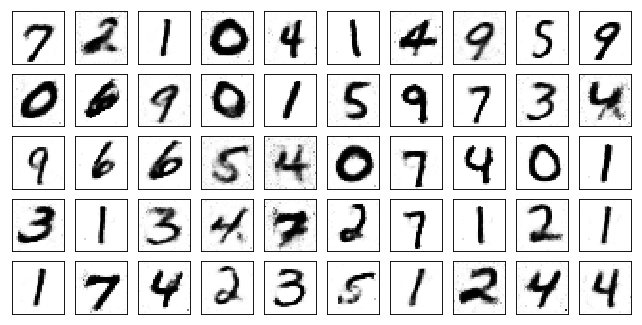

Test losses. G: 1.0889, D: 0.5450
Train Epoch: 100 [0/50000 (0%)]	Losses G: 1.1760, D: 0.5691
Train Epoch: 100 [5000/50000 (10%)]	Losses G: 0.9896, D: 0.5993
Train Epoch: 100 [10000/50000 (20%)]	Losses G: 0.9971, D: 0.6249
Train Epoch: 100 [15000/50000 (30%)]	Losses G: 1.1076, D: 0.5712
Train Epoch: 100 [20000/50000 (40%)]	Losses G: 0.9339, D: 0.6825
Train Epoch: 100 [25000/50000 (50%)]	Losses G: 1.0474, D: 0.5785
Train Epoch: 100 [30000/50000 (60%)]	Losses G: 1.3078, D: 0.4845
Train Epoch: 100 [35000/50000 (70%)]	Losses G: 0.8664, D: 0.6506
Train Epoch: 100 [40000/50000 (80%)]	Losses G: 0.9542, D: 0.5790
Train Epoch: 100 [45000/50000 (90%)]	Losses G: 1.1809, D: 0.5814
Train Epoch: 100 [50000/50000 (100%)]	Losses G: 1.0609, D: 0.5299


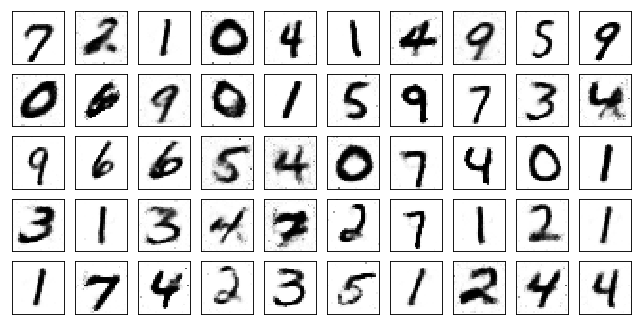

Test losses. G: 0.9677, D: 0.5467
Train Epoch: 101 [0/50000 (0%)]	Losses G: 1.0738, D: 0.5673
Train Epoch: 101 [5000/50000 (10%)]	Losses G: 1.0397, D: 0.6427
Train Epoch: 101 [10000/50000 (20%)]	Losses G: 1.0848, D: 0.6282
Train Epoch: 101 [15000/50000 (30%)]	Losses G: 1.1176, D: 0.5580
Train Epoch: 101 [20000/50000 (40%)]	Losses G: 0.9454, D: 0.6235
Train Epoch: 101 [25000/50000 (50%)]	Losses G: 0.9536, D: 0.5980
Train Epoch: 101 [30000/50000 (60%)]	Losses G: 0.9824, D: 0.5791
Train Epoch: 101 [35000/50000 (70%)]	Losses G: 0.9675, D: 0.5920
Train Epoch: 101 [40000/50000 (80%)]	Losses G: 1.1166, D: 0.5756
Train Epoch: 101 [45000/50000 (90%)]	Losses G: 1.1641, D: 0.5695
Train Epoch: 101 [50000/50000 (100%)]	Losses G: 1.1997, D: 0.5761


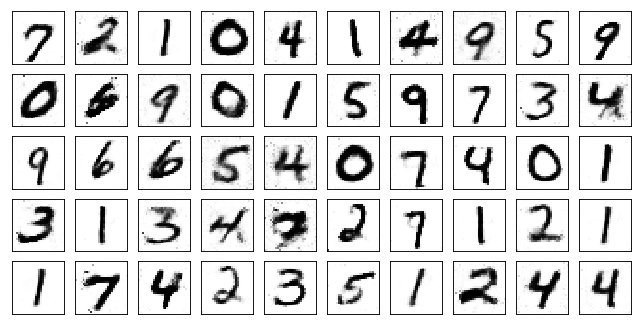

Test losses. G: 0.9669, D: 0.5646
Train Epoch: 102 [0/50000 (0%)]	Losses G: 1.1759, D: 0.5220
Train Epoch: 102 [5000/50000 (10%)]	Losses G: 1.1490, D: 0.5878
Train Epoch: 102 [10000/50000 (20%)]	Losses G: 0.9615, D: 0.5198
Train Epoch: 102 [15000/50000 (30%)]	Losses G: 0.8991, D: 0.6317
Train Epoch: 102 [20000/50000 (40%)]	Losses G: 1.0997, D: 0.6084
Train Epoch: 102 [25000/50000 (50%)]	Losses G: 1.0136, D: 0.5461
Train Epoch: 102 [30000/50000 (60%)]	Losses G: 1.1848, D: 0.5313
Train Epoch: 102 [35000/50000 (70%)]	Losses G: 0.8632, D: 0.5382
Train Epoch: 102 [40000/50000 (80%)]	Losses G: 0.8968, D: 0.6576
Train Epoch: 102 [45000/50000 (90%)]	Losses G: 1.0597, D: 0.5079
Train Epoch: 102 [50000/50000 (100%)]	Losses G: 1.0626, D: 0.6048


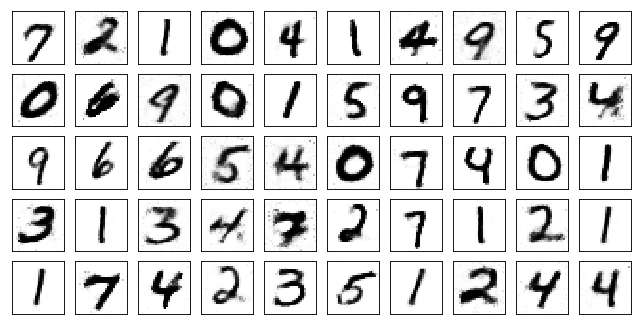

Test losses. G: 1.0684, D: 0.5542
Train Epoch: 103 [0/50000 (0%)]	Losses G: 0.9889, D: 0.6154
Train Epoch: 103 [5000/50000 (10%)]	Losses G: 0.9241, D: 0.6363
Train Epoch: 103 [10000/50000 (20%)]	Losses G: 0.7508, D: 0.6487
Train Epoch: 103 [15000/50000 (30%)]	Losses G: 1.0427, D: 0.5820
Train Epoch: 103 [20000/50000 (40%)]	Losses G: 0.8458, D: 0.6366
Train Epoch: 103 [25000/50000 (50%)]	Losses G: 0.8294, D: 0.6055
Train Epoch: 103 [30000/50000 (60%)]	Losses G: 0.8950, D: 0.6084
Train Epoch: 103 [35000/50000 (70%)]	Losses G: 1.0386, D: 0.6147
Train Epoch: 103 [40000/50000 (80%)]	Losses G: 0.8482, D: 0.6638
Train Epoch: 103 [45000/50000 (90%)]	Losses G: 1.2916, D: 0.6375
Train Epoch: 103 [50000/50000 (100%)]	Losses G: 0.9143, D: 0.5795


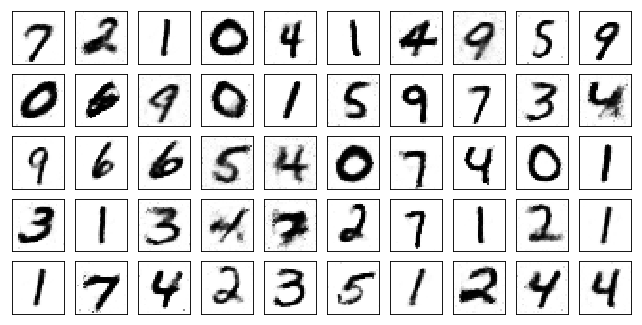

Test losses. G: 0.9896, D: 0.5168
Train Epoch: 104 [0/50000 (0%)]	Losses G: 0.9345, D: 0.5785
Train Epoch: 104 [5000/50000 (10%)]	Losses G: 1.0125, D: 0.5673
Train Epoch: 104 [10000/50000 (20%)]	Losses G: 0.9939, D: 0.5356
Train Epoch: 104 [15000/50000 (30%)]	Losses G: 1.0928, D: 0.5718
Train Epoch: 104 [20000/50000 (40%)]	Losses G: 1.0397, D: 0.6269
Train Epoch: 104 [25000/50000 (50%)]	Losses G: 0.8743, D: 0.5845
Train Epoch: 104 [30000/50000 (60%)]	Losses G: 1.1826, D: 0.5732
Train Epoch: 104 [35000/50000 (70%)]	Losses G: 1.1478, D: 0.6458
Train Epoch: 104 [40000/50000 (80%)]	Losses G: 1.1172, D: 0.6373
Train Epoch: 104 [45000/50000 (90%)]	Losses G: 1.1625, D: 0.6008
Train Epoch: 104 [50000/50000 (100%)]	Losses G: 1.0430, D: 0.5675


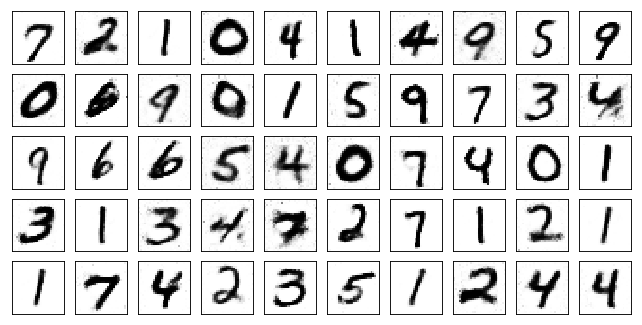

Test losses. G: 0.9666, D: 0.5528
Train Epoch: 105 [0/50000 (0%)]	Losses G: 1.0183, D: 0.6144
Train Epoch: 105 [5000/50000 (10%)]	Losses G: 0.8568, D: 0.6115
Train Epoch: 105 [10000/50000 (20%)]	Losses G: 1.1123, D: 0.6400
Train Epoch: 105 [15000/50000 (30%)]	Losses G: 1.1187, D: 0.5564
Train Epoch: 105 [20000/50000 (40%)]	Losses G: 0.9991, D: 0.5841
Train Epoch: 105 [25000/50000 (50%)]	Losses G: 1.0601, D: 0.6058
Train Epoch: 105 [30000/50000 (60%)]	Losses G: 1.0017, D: 0.6266
Train Epoch: 105 [35000/50000 (70%)]	Losses G: 0.9343, D: 0.6006
Train Epoch: 105 [40000/50000 (80%)]	Losses G: 1.1617, D: 0.6156
Train Epoch: 105 [45000/50000 (90%)]	Losses G: 1.0050, D: 0.6233
Train Epoch: 105 [50000/50000 (100%)]	Losses G: 0.9287, D: 0.6634


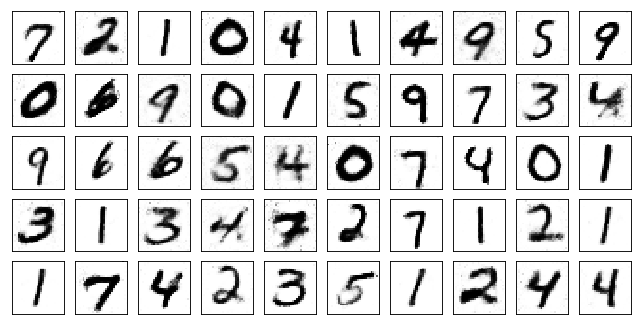

Test losses. G: 0.8663, D: 0.5816
Train Epoch: 106 [0/50000 (0%)]	Losses G: 0.9222, D: 0.5930
Train Epoch: 106 [5000/50000 (10%)]	Losses G: 0.9140, D: 0.5865
Train Epoch: 106 [10000/50000 (20%)]	Losses G: 1.1884, D: 0.6072
Train Epoch: 106 [15000/50000 (30%)]	Losses G: 1.0672, D: 0.5981
Train Epoch: 106 [20000/50000 (40%)]	Losses G: 0.9632, D: 0.5349
Train Epoch: 106 [25000/50000 (50%)]	Losses G: 1.0629, D: 0.5653
Train Epoch: 106 [30000/50000 (60%)]	Losses G: 1.0528, D: 0.5664
Train Epoch: 106 [35000/50000 (70%)]	Losses G: 1.0826, D: 0.6567
Train Epoch: 106 [40000/50000 (80%)]	Losses G: 1.0342, D: 0.5590
Train Epoch: 106 [45000/50000 (90%)]	Losses G: 1.0435, D: 0.5257
Train Epoch: 106 [50000/50000 (100%)]	Losses G: 1.1767, D: 0.6289


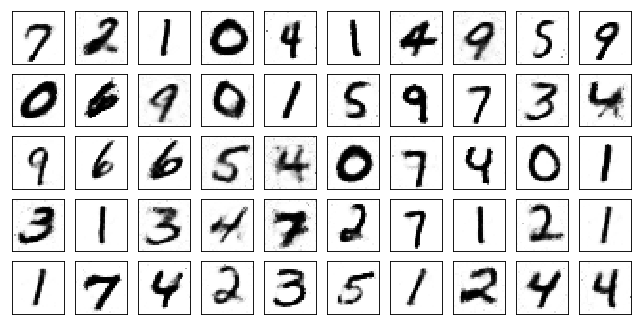

Test losses. G: 0.9922, D: 0.5661
Train Epoch: 107 [0/50000 (0%)]	Losses G: 1.1064, D: 0.5693
Train Epoch: 107 [5000/50000 (10%)]	Losses G: 1.0881, D: 0.5679
Train Epoch: 107 [10000/50000 (20%)]	Losses G: 0.9880, D: 0.6280
Train Epoch: 107 [15000/50000 (30%)]	Losses G: 1.0896, D: 0.5445
Train Epoch: 107 [20000/50000 (40%)]	Losses G: 1.1553, D: 0.5374
Train Epoch: 107 [25000/50000 (50%)]	Losses G: 0.9665, D: 0.5372
Train Epoch: 107 [30000/50000 (60%)]	Losses G: 1.1075, D: 0.6927
Train Epoch: 107 [35000/50000 (70%)]	Losses G: 0.8686, D: 0.6054
Train Epoch: 107 [40000/50000 (80%)]	Losses G: 0.9700, D: 0.5894
Train Epoch: 107 [45000/50000 (90%)]	Losses G: 0.8795, D: 0.6403
Train Epoch: 107 [50000/50000 (100%)]	Losses G: 1.0081, D: 0.6638


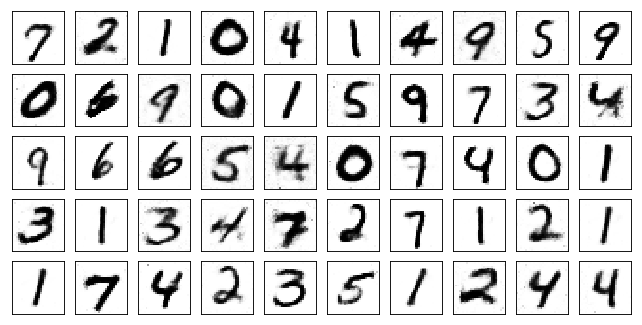

Test losses. G: 1.0824, D: 0.5620
Train Epoch: 108 [0/50000 (0%)]	Losses G: 0.9306, D: 0.5965
Train Epoch: 108 [5000/50000 (10%)]	Losses G: 0.9236, D: 0.5789
Train Epoch: 108 [10000/50000 (20%)]	Losses G: 1.1955, D: 0.6074
Train Epoch: 108 [15000/50000 (30%)]	Losses G: 1.1370, D: 0.6585
Train Epoch: 108 [20000/50000 (40%)]	Losses G: 1.0437, D: 0.5848
Train Epoch: 108 [25000/50000 (50%)]	Losses G: 0.9845, D: 0.4851
Train Epoch: 108 [30000/50000 (60%)]	Losses G: 1.0711, D: 0.5748
Train Epoch: 108 [35000/50000 (70%)]	Losses G: 1.0376, D: 0.5674
Train Epoch: 108 [40000/50000 (80%)]	Losses G: 1.1283, D: 0.5862
Train Epoch: 108 [45000/50000 (90%)]	Losses G: 1.0285, D: 0.5913
Train Epoch: 108 [50000/50000 (100%)]	Losses G: 1.0918, D: 0.4893


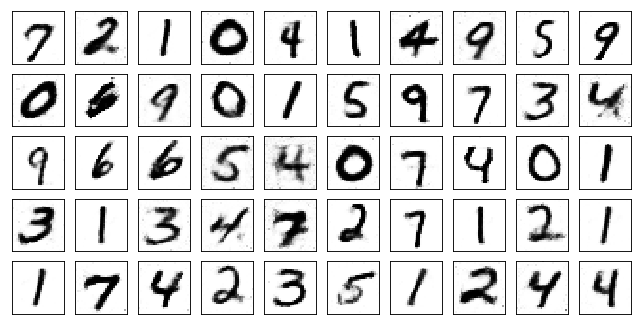

Test losses. G: 1.1117, D: 0.5376
Train Epoch: 109 [0/50000 (0%)]	Losses G: 1.1587, D: 0.6124
Train Epoch: 109 [5000/50000 (10%)]	Losses G: 0.9278, D: 0.6133
Train Epoch: 109 [10000/50000 (20%)]	Losses G: 0.9639, D: 0.6124
Train Epoch: 109 [15000/50000 (30%)]	Losses G: 0.8778, D: 0.6188
Train Epoch: 109 [20000/50000 (40%)]	Losses G: 1.0415, D: 0.6101
Train Epoch: 109 [25000/50000 (50%)]	Losses G: 1.0338, D: 0.5516
Train Epoch: 109 [30000/50000 (60%)]	Losses G: 1.1056, D: 0.5117
Train Epoch: 109 [35000/50000 (70%)]	Losses G: 1.0037, D: 0.6094
Train Epoch: 109 [40000/50000 (80%)]	Losses G: 1.1421, D: 0.5787
Train Epoch: 109 [45000/50000 (90%)]	Losses G: 0.9437, D: 0.5834
Train Epoch: 109 [50000/50000 (100%)]	Losses G: 1.0030, D: 0.5853


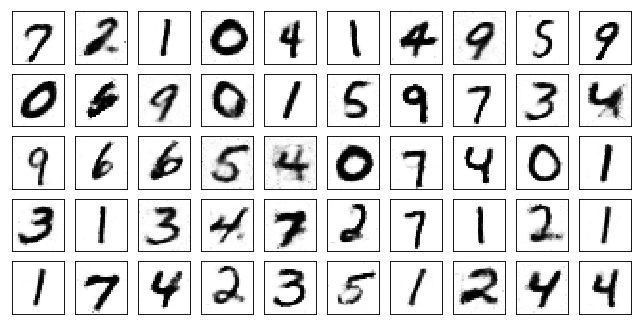

Test losses. G: 0.9206, D: 0.5474
Train Epoch: 110 [0/50000 (0%)]	Losses G: 1.1029, D: 0.5661
Train Epoch: 110 [5000/50000 (10%)]	Losses G: 1.0585, D: 0.5725
Train Epoch: 110 [10000/50000 (20%)]	Losses G: 1.0797, D: 0.6228
Train Epoch: 110 [15000/50000 (30%)]	Losses G: 1.0269, D: 0.5259
Train Epoch: 110 [20000/50000 (40%)]	Losses G: 1.1137, D: 0.5403
Train Epoch: 110 [25000/50000 (50%)]	Losses G: 1.1355, D: 0.5761
Train Epoch: 110 [30000/50000 (60%)]	Losses G: 0.9888, D: 0.6735
Train Epoch: 110 [35000/50000 (70%)]	Losses G: 1.0155, D: 0.6932
Train Epoch: 110 [40000/50000 (80%)]	Losses G: 0.9766, D: 0.6071
Train Epoch: 110 [45000/50000 (90%)]	Losses G: 0.9368, D: 0.6367
Train Epoch: 110 [50000/50000 (100%)]	Losses G: 1.0495, D: 0.5379


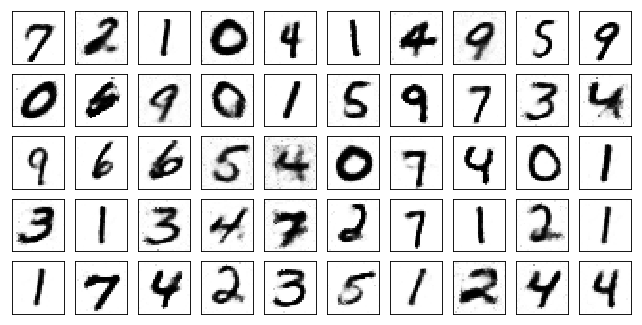

Test losses. G: 1.2135, D: 0.5521
Train Epoch: 111 [0/50000 (0%)]	Losses G: 1.0842, D: 0.5524
Train Epoch: 111 [5000/50000 (10%)]	Losses G: 0.9742, D: 0.5468
Train Epoch: 111 [10000/50000 (20%)]	Losses G: 1.1116, D: 0.5535
Train Epoch: 111 [15000/50000 (30%)]	Losses G: 0.9452, D: 0.5822
Train Epoch: 111 [20000/50000 (40%)]	Losses G: 1.0053, D: 0.5602
Train Epoch: 111 [25000/50000 (50%)]	Losses G: 1.0187, D: 0.6020
Train Epoch: 111 [30000/50000 (60%)]	Losses G: 1.0827, D: 0.6202
Train Epoch: 111 [35000/50000 (70%)]	Losses G: 1.1132, D: 0.6077
Train Epoch: 111 [40000/50000 (80%)]	Losses G: 1.1824, D: 0.5839
Train Epoch: 111 [45000/50000 (90%)]	Losses G: 1.0595, D: 0.5180
Train Epoch: 111 [50000/50000 (100%)]	Losses G: 0.8976, D: 0.6005


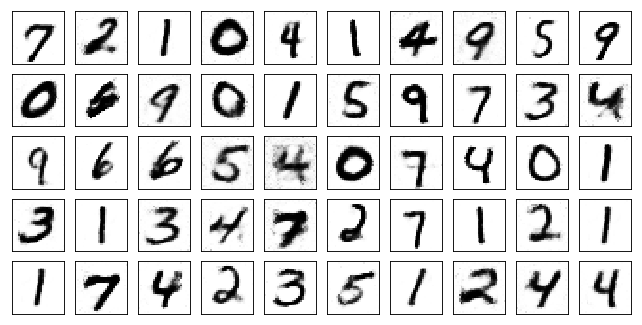

Test losses. G: 0.8394, D: 0.5641
Train Epoch: 112 [0/50000 (0%)]	Losses G: 1.0734, D: 0.5686
Train Epoch: 112 [5000/50000 (10%)]	Losses G: 0.9746, D: 0.5917
Train Epoch: 112 [10000/50000 (20%)]	Losses G: 1.1028, D: 0.5560
Train Epoch: 112 [15000/50000 (30%)]	Losses G: 1.1817, D: 0.6048
Train Epoch: 112 [20000/50000 (40%)]	Losses G: 1.0523, D: 0.6179
Train Epoch: 112 [25000/50000 (50%)]	Losses G: 1.2349, D: 0.6139
Train Epoch: 112 [30000/50000 (60%)]	Losses G: 0.9785, D: 0.5421
Train Epoch: 112 [35000/50000 (70%)]	Losses G: 1.0490, D: 0.6457
Train Epoch: 112 [40000/50000 (80%)]	Losses G: 1.0491, D: 0.5745
Train Epoch: 112 [45000/50000 (90%)]	Losses G: 0.9173, D: 0.6070
Train Epoch: 112 [50000/50000 (100%)]	Losses G: 0.9247, D: 0.5361


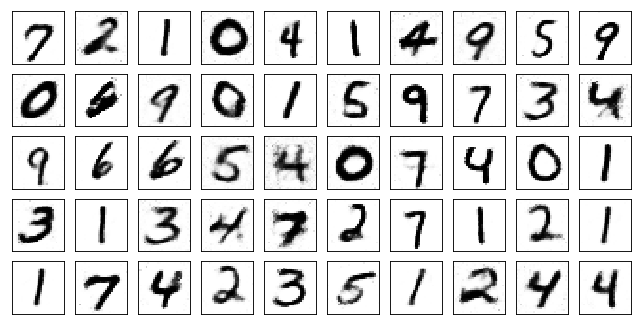

Test losses. G: 0.9647, D: 0.5691
Train Epoch: 113 [0/50000 (0%)]	Losses G: 1.1928, D: 0.5467
Train Epoch: 113 [5000/50000 (10%)]	Losses G: 0.9885, D: 0.6178
Train Epoch: 113 [10000/50000 (20%)]	Losses G: 1.0636, D: 0.6038
Train Epoch: 113 [15000/50000 (30%)]	Losses G: 0.8291, D: 0.6634
Train Epoch: 113 [20000/50000 (40%)]	Losses G: 1.0663, D: 0.5468
Train Epoch: 113 [25000/50000 (50%)]	Losses G: 0.8635, D: 0.4651
Train Epoch: 113 [30000/50000 (60%)]	Losses G: 1.1742, D: 0.5759
Train Epoch: 113 [35000/50000 (70%)]	Losses G: 1.0478, D: 0.5939
Train Epoch: 113 [40000/50000 (80%)]	Losses G: 1.1320, D: 0.6658
Train Epoch: 113 [45000/50000 (90%)]	Losses G: 1.0244, D: 0.5956
Train Epoch: 113 [50000/50000 (100%)]	Losses G: 0.8798, D: 0.6001


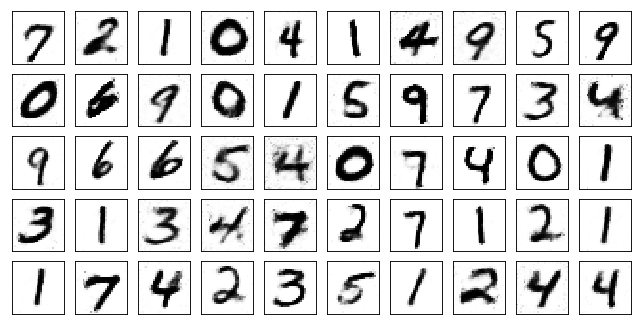

Test losses. G: 0.9601, D: 0.5368
Train Epoch: 114 [0/50000 (0%)]	Losses G: 0.8347, D: 0.6009
Train Epoch: 114 [5000/50000 (10%)]	Losses G: 1.1610, D: 0.5749
Train Epoch: 114 [10000/50000 (20%)]	Losses G: 0.9923, D: 0.5663
Train Epoch: 114 [15000/50000 (30%)]	Losses G: 0.7961, D: 0.5923
Train Epoch: 114 [20000/50000 (40%)]	Losses G: 1.0289, D: 0.5752
Train Epoch: 114 [25000/50000 (50%)]	Losses G: 0.9677, D: 0.6292
Train Epoch: 114 [30000/50000 (60%)]	Losses G: 1.0242, D: 0.5702
Train Epoch: 114 [35000/50000 (70%)]	Losses G: 1.2459, D: 0.6158
Train Epoch: 114 [40000/50000 (80%)]	Losses G: 1.1626, D: 0.6137
Train Epoch: 114 [45000/50000 (90%)]	Losses G: 0.9808, D: 0.5977
Train Epoch: 114 [50000/50000 (100%)]	Losses G: 0.9429, D: 0.6870


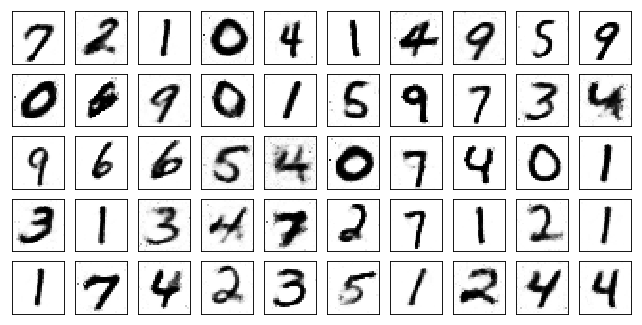

Test losses. G: 0.9230, D: 0.5641
Train Epoch: 115 [0/50000 (0%)]	Losses G: 0.9902, D: 0.6399
Train Epoch: 115 [5000/50000 (10%)]	Losses G: 0.9587, D: 0.5876
Train Epoch: 115 [10000/50000 (20%)]	Losses G: 0.9391, D: 0.6563
Train Epoch: 115 [15000/50000 (30%)]	Losses G: 1.0784, D: 0.6541
Train Epoch: 115 [20000/50000 (40%)]	Losses G: 0.9032, D: 0.5879
Train Epoch: 115 [25000/50000 (50%)]	Losses G: 0.8520, D: 0.6026
Train Epoch: 115 [30000/50000 (60%)]	Losses G: 1.0014, D: 0.5190
Train Epoch: 115 [35000/50000 (70%)]	Losses G: 1.0953, D: 0.6112
Train Epoch: 115 [40000/50000 (80%)]	Losses G: 1.0972, D: 0.5611
Train Epoch: 115 [45000/50000 (90%)]	Losses G: 0.9284, D: 0.6659
Train Epoch: 115 [50000/50000 (100%)]	Losses G: 1.1152, D: 0.6213


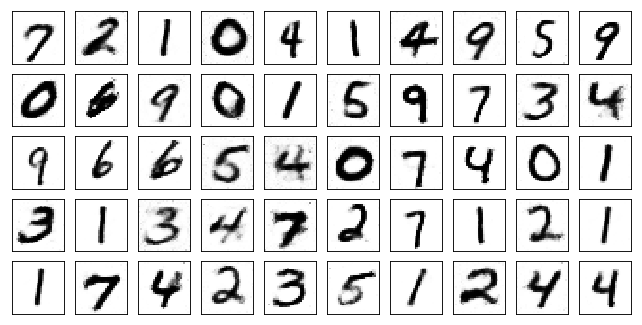

Test losses. G: 1.0611, D: 0.5664
Train Epoch: 116 [0/50000 (0%)]	Losses G: 1.1900, D: 0.7043
Train Epoch: 116 [5000/50000 (10%)]	Losses G: 0.9312, D: 0.5979
Train Epoch: 116 [10000/50000 (20%)]	Losses G: 0.8845, D: 0.5976
Train Epoch: 116 [15000/50000 (30%)]	Losses G: 1.1781, D: 0.5985
Train Epoch: 116 [20000/50000 (40%)]	Losses G: 1.4938, D: 0.5835
Train Epoch: 116 [25000/50000 (50%)]	Losses G: 0.9872, D: 0.5620
Train Epoch: 116 [30000/50000 (60%)]	Losses G: 1.2703, D: 0.5475
Train Epoch: 116 [35000/50000 (70%)]	Losses G: 1.0904, D: 0.6189
Train Epoch: 116 [40000/50000 (80%)]	Losses G: 1.1411, D: 0.5187
Train Epoch: 116 [45000/50000 (90%)]	Losses G: 1.0406, D: 0.5710
Train Epoch: 116 [50000/50000 (100%)]	Losses G: 1.4710, D: 0.5344


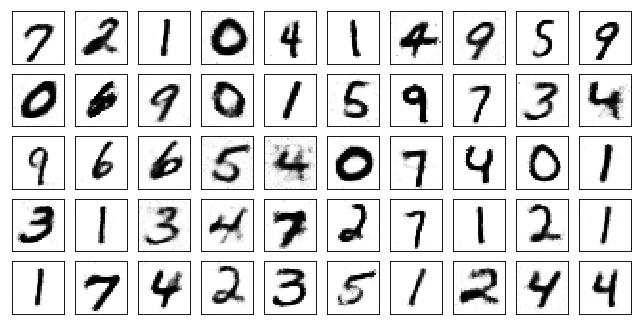

Test losses. G: 1.0858, D: 0.5392
Train Epoch: 117 [0/50000 (0%)]	Losses G: 1.0797, D: 0.5399
Train Epoch: 117 [5000/50000 (10%)]	Losses G: 1.2347, D: 0.5569
Train Epoch: 117 [10000/50000 (20%)]	Losses G: 1.1180, D: 0.5410
Train Epoch: 117 [15000/50000 (30%)]	Losses G: 1.1848, D: 0.5545
Train Epoch: 117 [20000/50000 (40%)]	Losses G: 0.9648, D: 0.6178
Train Epoch: 117 [25000/50000 (50%)]	Losses G: 1.0342, D: 0.6089
Train Epoch: 117 [30000/50000 (60%)]	Losses G: 1.0903, D: 0.5877
Train Epoch: 117 [35000/50000 (70%)]	Losses G: 1.0237, D: 0.5688
Train Epoch: 117 [40000/50000 (80%)]	Losses G: 1.2051, D: 0.5853
Train Epoch: 117 [45000/50000 (90%)]	Losses G: 1.1681, D: 0.5890
Train Epoch: 117 [50000/50000 (100%)]	Losses G: 1.1283, D: 0.5496


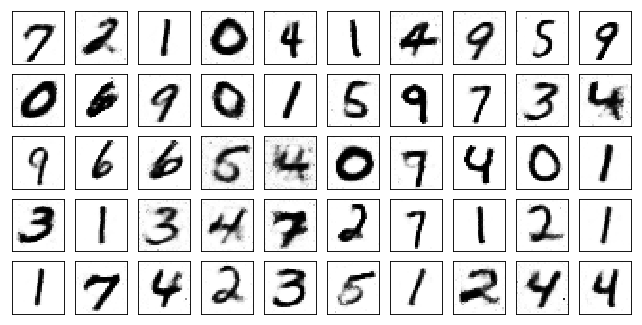

Test losses. G: 1.2653, D: 0.5279
Train Epoch: 118 [0/50000 (0%)]	Losses G: 1.2486, D: 0.5247
Train Epoch: 118 [5000/50000 (10%)]	Losses G: 1.1150, D: 0.5829
Train Epoch: 118 [10000/50000 (20%)]	Losses G: 1.1054, D: 0.5939
Train Epoch: 118 [15000/50000 (30%)]	Losses G: 1.1984, D: 0.6096
Train Epoch: 118 [20000/50000 (40%)]	Losses G: 1.2274, D: 0.6182
Train Epoch: 118 [25000/50000 (50%)]	Losses G: 1.1348, D: 0.5692
Train Epoch: 118 [30000/50000 (60%)]	Losses G: 1.1717, D: 0.5631
Train Epoch: 118 [35000/50000 (70%)]	Losses G: 1.1131, D: 0.5632
Train Epoch: 118 [40000/50000 (80%)]	Losses G: 1.0228, D: 0.4973
Train Epoch: 118 [45000/50000 (90%)]	Losses G: 0.8016, D: 0.5945
Train Epoch: 118 [50000/50000 (100%)]	Losses G: 0.8803, D: 0.5756


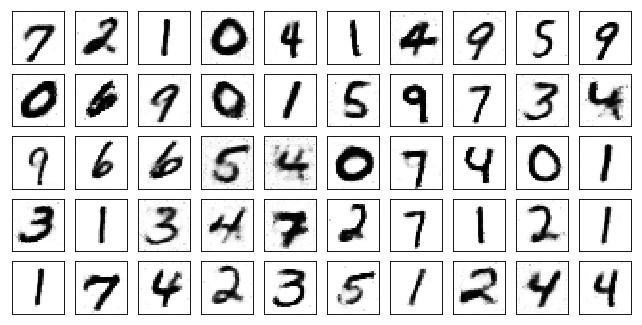

Test losses. G: 1.0615, D: 0.5199
Train Epoch: 119 [0/50000 (0%)]	Losses G: 0.9278, D: 0.5800
Train Epoch: 119 [5000/50000 (10%)]	Losses G: 0.9969, D: 0.6143
Train Epoch: 119 [10000/50000 (20%)]	Losses G: 0.9611, D: 0.5574
Train Epoch: 119 [15000/50000 (30%)]	Losses G: 1.0226, D: 0.6367
Train Epoch: 119 [20000/50000 (40%)]	Losses G: 0.9935, D: 0.5595
Train Epoch: 119 [25000/50000 (50%)]	Losses G: 1.1726, D: 0.5972
Train Epoch: 119 [30000/50000 (60%)]	Losses G: 0.9748, D: 0.5548
Train Epoch: 119 [35000/50000 (70%)]	Losses G: 0.9298, D: 0.5818
Train Epoch: 119 [40000/50000 (80%)]	Losses G: 1.1086, D: 0.5857
Train Epoch: 119 [45000/50000 (90%)]	Losses G: 0.9358, D: 0.5879
Train Epoch: 119 [50000/50000 (100%)]	Losses G: 1.1611, D: 0.6540


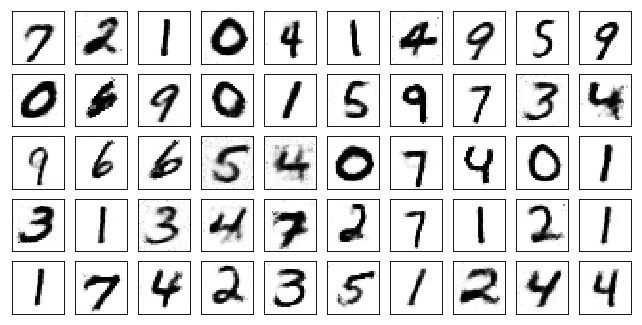

Test losses. G: 1.0233, D: 0.5606
Train Epoch: 120 [0/50000 (0%)]	Losses G: 1.1174, D: 0.5743
Train Epoch: 120 [5000/50000 (10%)]	Losses G: 0.8384, D: 0.5734
Train Epoch: 120 [10000/50000 (20%)]	Losses G: 1.1161, D: 0.5715
Train Epoch: 120 [15000/50000 (30%)]	Losses G: 0.8564, D: 0.5978
Train Epoch: 120 [20000/50000 (40%)]	Losses G: 0.9145, D: 0.5947
Train Epoch: 120 [25000/50000 (50%)]	Losses G: 0.9821, D: 0.6049
Train Epoch: 120 [30000/50000 (60%)]	Losses G: 0.8051, D: 0.6271
Train Epoch: 120 [35000/50000 (70%)]	Losses G: 0.8283, D: 0.6623
Train Epoch: 120 [40000/50000 (80%)]	Losses G: 1.2091, D: 0.6753
Train Epoch: 120 [45000/50000 (90%)]	Losses G: 1.0260, D: 0.6037
Train Epoch: 120 [50000/50000 (100%)]	Losses G: 1.0809, D: 0.5442


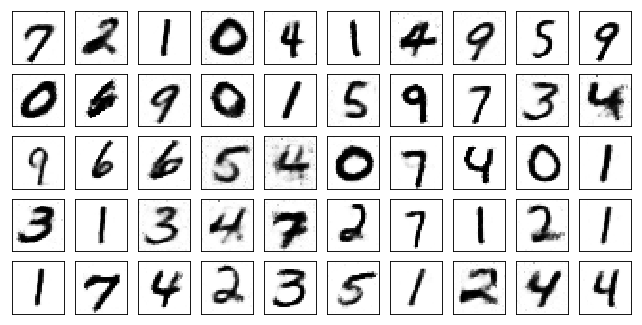

Test losses. G: 1.0648, D: 0.5538
Train Epoch: 121 [0/50000 (0%)]	Losses G: 1.0954, D: 0.5369
Train Epoch: 121 [5000/50000 (10%)]	Losses G: 1.0452, D: 0.6079
Train Epoch: 121 [10000/50000 (20%)]	Losses G: 0.9147, D: 0.5799
Train Epoch: 121 [15000/50000 (30%)]	Losses G: 0.8919, D: 0.5259
Train Epoch: 121 [20000/50000 (40%)]	Losses G: 0.9334, D: 0.5869
Train Epoch: 121 [25000/50000 (50%)]	Losses G: 1.0399, D: 0.5394
Train Epoch: 121 [30000/50000 (60%)]	Losses G: 1.0143, D: 0.5543
Train Epoch: 121 [35000/50000 (70%)]	Losses G: 1.2020, D: 0.6053
Train Epoch: 121 [40000/50000 (80%)]	Losses G: 0.8845, D: 0.5219
Train Epoch: 121 [45000/50000 (90%)]	Losses G: 1.2507, D: 0.6551
Train Epoch: 121 [50000/50000 (100%)]	Losses G: 1.0635, D: 0.6585


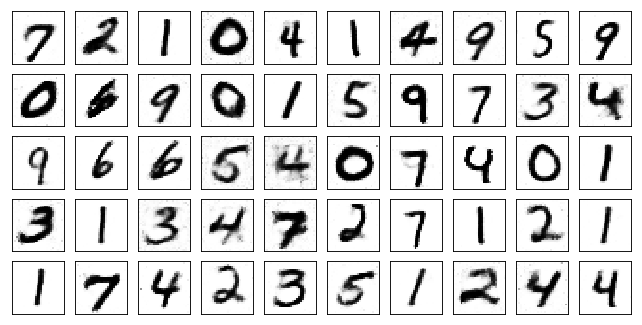

Test losses. G: 1.0881, D: 0.5497
Train Epoch: 122 [0/50000 (0%)]	Losses G: 1.0786, D: 0.6355
Train Epoch: 122 [5000/50000 (10%)]	Losses G: 0.9936, D: 0.6197
Train Epoch: 122 [10000/50000 (20%)]	Losses G: 0.8272, D: 0.6829
Train Epoch: 122 [15000/50000 (30%)]	Losses G: 0.9564, D: 0.6070
Train Epoch: 122 [20000/50000 (40%)]	Losses G: 1.0551, D: 0.5869
Train Epoch: 122 [25000/50000 (50%)]	Losses G: 1.1690, D: 0.5306
Train Epoch: 122 [30000/50000 (60%)]	Losses G: 1.0362, D: 0.5872
Train Epoch: 122 [35000/50000 (70%)]	Losses G: 1.1953, D: 0.5063
Train Epoch: 122 [40000/50000 (80%)]	Losses G: 1.1014, D: 0.5499
Train Epoch: 122 [45000/50000 (90%)]	Losses G: 1.0491, D: 0.6823
Train Epoch: 122 [50000/50000 (100%)]	Losses G: 0.9103, D: 0.5735


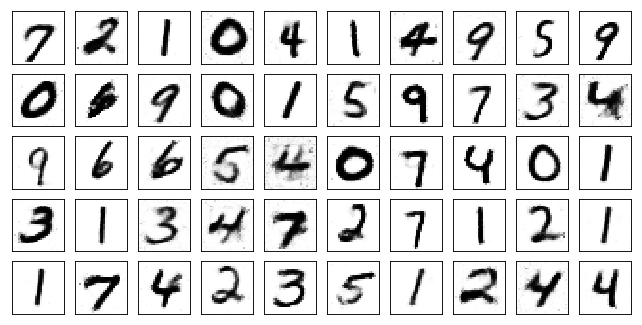

Test losses. G: 0.9004, D: 0.5559
Train Epoch: 123 [0/50000 (0%)]	Losses G: 0.8539, D: 0.5599
Train Epoch: 123 [5000/50000 (10%)]	Losses G: 1.1694, D: 0.6256
Train Epoch: 123 [10000/50000 (20%)]	Losses G: 1.0374, D: 0.6068
Train Epoch: 123 [15000/50000 (30%)]	Losses G: 1.1856, D: 0.6038
Train Epoch: 123 [20000/50000 (40%)]	Losses G: 0.9105, D: 0.6178
Train Epoch: 123 [25000/50000 (50%)]	Losses G: 1.1544, D: 0.5343
Train Epoch: 123 [30000/50000 (60%)]	Losses G: 0.9315, D: 0.5688
Train Epoch: 123 [35000/50000 (70%)]	Losses G: 1.1798, D: 0.5115
Train Epoch: 123 [40000/50000 (80%)]	Losses G: 0.9235, D: 0.6796
Train Epoch: 123 [45000/50000 (90%)]	Losses G: 1.0616, D: 0.5580
Train Epoch: 123 [50000/50000 (100%)]	Losses G: 1.1375, D: 0.5043


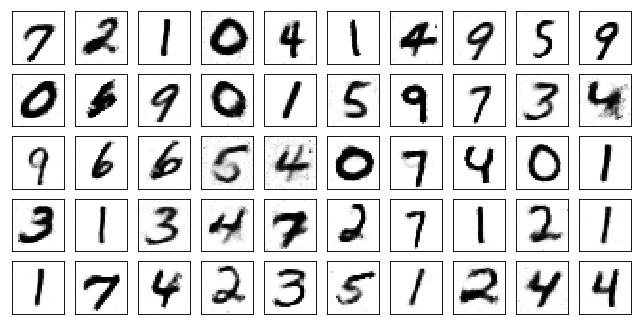

Test losses. G: 1.1243, D: 0.5488
Train Epoch: 124 [0/50000 (0%)]	Losses G: 1.0627, D: 0.5348
Train Epoch: 124 [5000/50000 (10%)]	Losses G: 0.9301, D: 0.5548
Train Epoch: 124 [10000/50000 (20%)]	Losses G: 0.9392, D: 0.5590
Train Epoch: 124 [15000/50000 (30%)]	Losses G: 1.0658, D: 0.5992
Train Epoch: 124 [20000/50000 (40%)]	Losses G: 1.0694, D: 0.5688
Train Epoch: 124 [25000/50000 (50%)]	Losses G: 0.9846, D: 0.5452
Train Epoch: 124 [30000/50000 (60%)]	Losses G: 1.1323, D: 0.5910
Train Epoch: 124 [35000/50000 (70%)]	Losses G: 1.0347, D: 0.5640
Train Epoch: 124 [40000/50000 (80%)]	Losses G: 0.8929, D: 0.5861
Train Epoch: 124 [45000/50000 (90%)]	Losses G: 0.9403, D: 0.6156
Train Epoch: 124 [50000/50000 (100%)]	Losses G: 0.8882, D: 0.5950


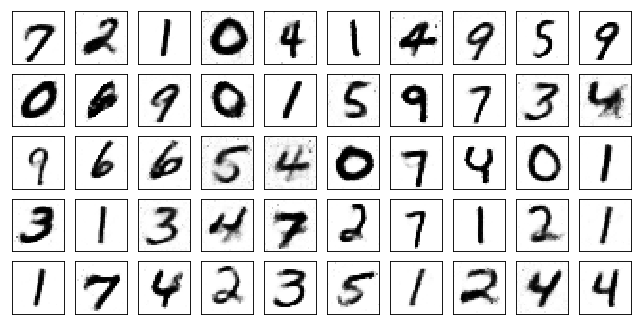

Test losses. G: 0.9487, D: 0.5715
Train Epoch: 125 [0/50000 (0%)]	Losses G: 0.9804, D: 0.6503
Train Epoch: 125 [5000/50000 (10%)]	Losses G: 0.9785, D: 0.5595
Train Epoch: 125 [10000/50000 (20%)]	Losses G: 1.0656, D: 0.6011
Train Epoch: 125 [15000/50000 (30%)]	Losses G: 1.0586, D: 0.5647
Train Epoch: 125 [20000/50000 (40%)]	Losses G: 1.1163, D: 0.5649
Train Epoch: 125 [25000/50000 (50%)]	Losses G: 1.1344, D: 0.5582
Train Epoch: 125 [30000/50000 (60%)]	Losses G: 1.1684, D: 0.6232
Train Epoch: 125 [35000/50000 (70%)]	Losses G: 1.0284, D: 0.5706
Train Epoch: 125 [40000/50000 (80%)]	Losses G: 1.0298, D: 0.5599
Train Epoch: 125 [45000/50000 (90%)]	Losses G: 1.0071, D: 0.5813
Train Epoch: 125 [50000/50000 (100%)]	Losses G: 0.9563, D: 0.6625


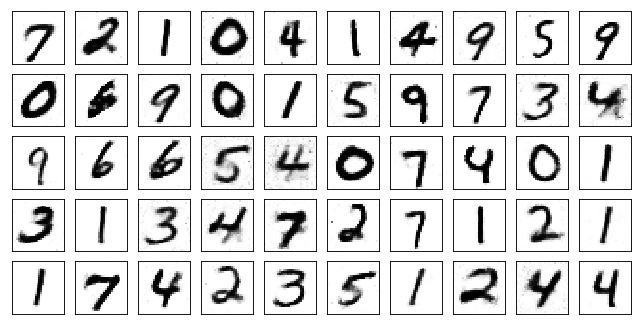

Test losses. G: 0.9611, D: 0.5564
Train Epoch: 126 [0/50000 (0%)]	Losses G: 0.9814, D: 0.5757
Train Epoch: 126 [5000/50000 (10%)]	Losses G: 1.1958, D: 0.5355
Train Epoch: 126 [10000/50000 (20%)]	Losses G: 1.1482, D: 0.5983
Train Epoch: 126 [15000/50000 (30%)]	Losses G: 1.0647, D: 0.6411
Train Epoch: 126 [20000/50000 (40%)]	Losses G: 1.0997, D: 0.5568
Train Epoch: 126 [25000/50000 (50%)]	Losses G: 1.1691, D: 0.5950
Train Epoch: 126 [30000/50000 (60%)]	Losses G: 1.2029, D: 0.4860
Train Epoch: 126 [35000/50000 (70%)]	Losses G: 1.1543, D: 0.6419
Train Epoch: 126 [40000/50000 (80%)]	Losses G: 1.0187, D: 0.5398
Train Epoch: 126 [45000/50000 (90%)]	Losses G: 1.0038, D: 0.5272
Train Epoch: 126 [50000/50000 (100%)]	Losses G: 1.1163, D: 0.5491


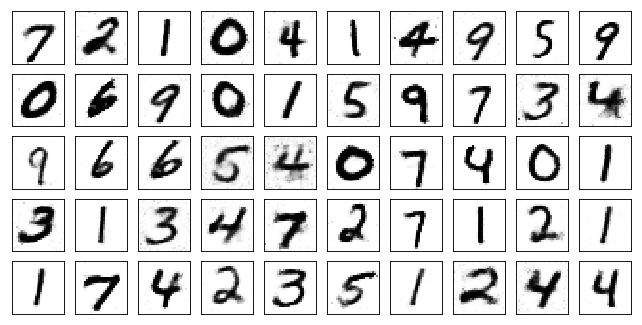

Test losses. G: 1.1338, D: 0.5509
Train Epoch: 127 [0/50000 (0%)]	Losses G: 1.0291, D: 0.6367
Train Epoch: 127 [5000/50000 (10%)]	Losses G: 1.0357, D: 0.5484
Train Epoch: 127 [10000/50000 (20%)]	Losses G: 0.9810, D: 0.6321
Train Epoch: 127 [15000/50000 (30%)]	Losses G: 1.2575, D: 0.5690
Train Epoch: 127 [20000/50000 (40%)]	Losses G: 1.0135, D: 0.6067
Train Epoch: 127 [25000/50000 (50%)]	Losses G: 0.9596, D: 0.5693
Train Epoch: 127 [30000/50000 (60%)]	Losses G: 1.0720, D: 0.6264
Train Epoch: 127 [35000/50000 (70%)]	Losses G: 0.9361, D: 0.5587
Train Epoch: 127 [40000/50000 (80%)]	Losses G: 1.0559, D: 0.6707
Train Epoch: 127 [45000/50000 (90%)]	Losses G: 1.2280, D: 0.5927
Train Epoch: 127 [50000/50000 (100%)]	Losses G: 0.8724, D: 0.5878


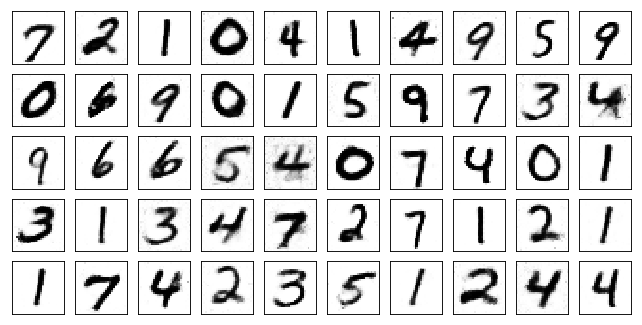

Test losses. G: 0.9927, D: 0.5202
Train Epoch: 128 [0/50000 (0%)]	Losses G: 0.8698, D: 0.6007
Train Epoch: 128 [5000/50000 (10%)]	Losses G: 1.1196, D: 0.5528
Train Epoch: 128 [10000/50000 (20%)]	Losses G: 1.2066, D: 0.5869
Train Epoch: 128 [15000/50000 (30%)]	Losses G: 1.0510, D: 0.6363
Train Epoch: 128 [20000/50000 (40%)]	Losses G: 0.9999, D: 0.6051
Train Epoch: 128 [25000/50000 (50%)]	Losses G: 1.0384, D: 0.5411
Train Epoch: 128 [30000/50000 (60%)]	Losses G: 0.7955, D: 0.6007
Train Epoch: 128 [35000/50000 (70%)]	Losses G: 1.0688, D: 0.5532
Train Epoch: 128 [40000/50000 (80%)]	Losses G: 1.0114, D: 0.5976
Train Epoch: 128 [45000/50000 (90%)]	Losses G: 0.9356, D: 0.6406
Train Epoch: 128 [50000/50000 (100%)]	Losses G: 1.0096, D: 0.6054


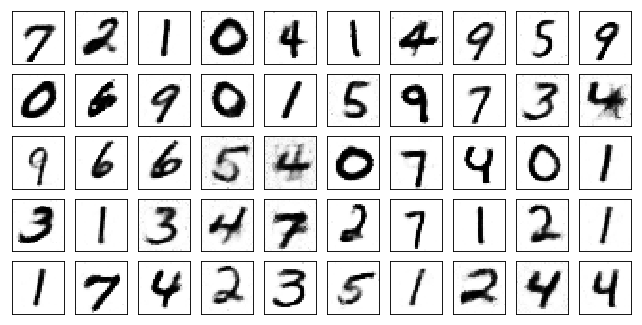

Test losses. G: 0.9604, D: 0.5605
Train Epoch: 129 [0/50000 (0%)]	Losses G: 0.8857, D: 0.5733
Train Epoch: 129 [5000/50000 (10%)]	Losses G: 1.0987, D: 0.5709
Train Epoch: 129 [10000/50000 (20%)]	Losses G: 0.9538, D: 0.5186
Train Epoch: 129 [15000/50000 (30%)]	Losses G: 0.8471, D: 0.6082
Train Epoch: 129 [20000/50000 (40%)]	Losses G: 1.0186, D: 0.5558
Train Epoch: 129 [25000/50000 (50%)]	Losses G: 1.0438, D: 0.5940
Train Epoch: 129 [30000/50000 (60%)]	Losses G: 1.2209, D: 0.6370
Train Epoch: 129 [35000/50000 (70%)]	Losses G: 0.9419, D: 0.6152
Train Epoch: 129 [40000/50000 (80%)]	Losses G: 1.2708, D: 0.6361
Train Epoch: 129 [45000/50000 (90%)]	Losses G: 0.9991, D: 0.6513
Train Epoch: 129 [50000/50000 (100%)]	Losses G: 1.1387, D: 0.5617


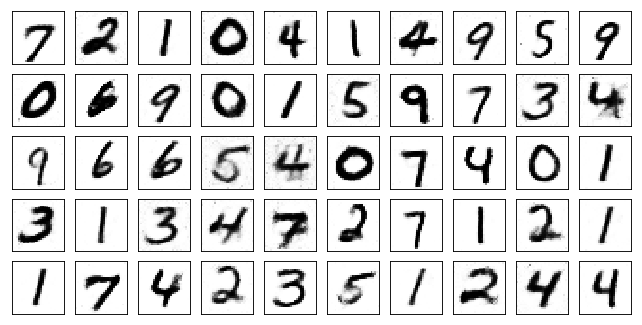

Test losses. G: 1.0406, D: 0.5490
Train Epoch: 130 [0/50000 (0%)]	Losses G: 0.9450, D: 0.6196
Train Epoch: 130 [5000/50000 (10%)]	Losses G: 1.1938, D: 0.5245
Train Epoch: 130 [10000/50000 (20%)]	Losses G: 1.0828, D: 0.5873
Train Epoch: 130 [15000/50000 (30%)]	Losses G: 1.0748, D: 0.5374
Train Epoch: 130 [20000/50000 (40%)]	Losses G: 0.9845, D: 0.5780
Train Epoch: 130 [25000/50000 (50%)]	Losses G: 1.1102, D: 0.5992
Train Epoch: 130 [30000/50000 (60%)]	Losses G: 0.8561, D: 0.6122
Train Epoch: 130 [35000/50000 (70%)]	Losses G: 1.1352, D: 0.5911
Train Epoch: 130 [40000/50000 (80%)]	Losses G: 0.8247, D: 0.5851
Train Epoch: 130 [45000/50000 (90%)]	Losses G: 0.9749, D: 0.6139
Train Epoch: 130 [50000/50000 (100%)]	Losses G: 1.1153, D: 0.5101


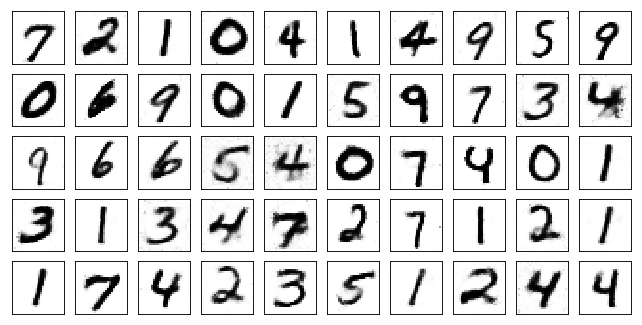

Test losses. G: 0.9438, D: 0.5434
Train Epoch: 131 [0/50000 (0%)]	Losses G: 0.9019, D: 0.5184
Train Epoch: 131 [5000/50000 (10%)]	Losses G: 1.1104, D: 0.5330
Train Epoch: 131 [10000/50000 (20%)]	Losses G: 1.1489, D: 0.5060
Train Epoch: 131 [15000/50000 (30%)]	Losses G: 0.9821, D: 0.5439
Train Epoch: 131 [20000/50000 (40%)]	Losses G: 1.1973, D: 0.5425
Train Epoch: 131 [25000/50000 (50%)]	Losses G: 1.0860, D: 0.5701
Train Epoch: 131 [30000/50000 (60%)]	Losses G: 1.0310, D: 0.5874
Train Epoch: 131 [35000/50000 (70%)]	Losses G: 1.1597, D: 0.5035
Train Epoch: 131 [40000/50000 (80%)]	Losses G: 1.1300, D: 0.5245
Train Epoch: 131 [45000/50000 (90%)]	Losses G: 1.2607, D: 0.7023
Train Epoch: 131 [50000/50000 (100%)]	Losses G: 1.2919, D: 0.5933


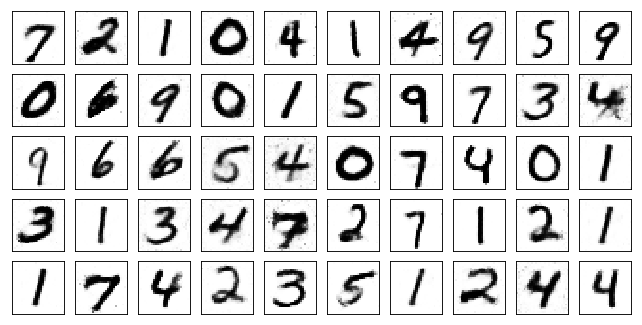

Test losses. G: 1.2277, D: 0.5654
Train Epoch: 132 [0/50000 (0%)]	Losses G: 0.9885, D: 0.6085
Train Epoch: 132 [5000/50000 (10%)]	Losses G: 1.0093, D: 0.5882
Train Epoch: 132 [10000/50000 (20%)]	Losses G: 0.9220, D: 0.6135
Train Epoch: 132 [15000/50000 (30%)]	Losses G: 0.9552, D: 0.5700
Train Epoch: 132 [20000/50000 (40%)]	Losses G: 1.1433, D: 0.5290
Train Epoch: 132 [25000/50000 (50%)]	Losses G: 1.1497, D: 0.5347
Train Epoch: 132 [30000/50000 (60%)]	Losses G: 0.9877, D: 0.6263
Train Epoch: 132 [35000/50000 (70%)]	Losses G: 1.0387, D: 0.5843
Train Epoch: 132 [40000/50000 (80%)]	Losses G: 1.0325, D: 0.5548
Train Epoch: 132 [45000/50000 (90%)]	Losses G: 0.8952, D: 0.5960
Train Epoch: 132 [50000/50000 (100%)]	Losses G: 0.9476, D: 0.5995


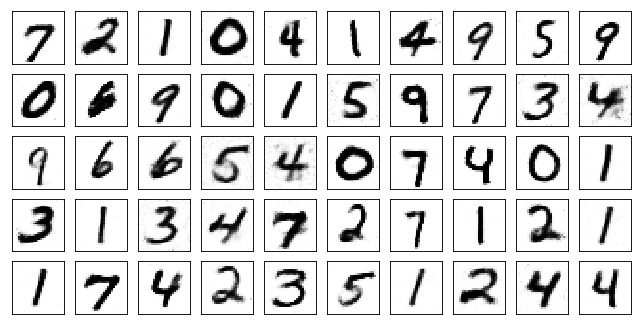

Test losses. G: 0.9643, D: 0.5566
Train Epoch: 133 [0/50000 (0%)]	Losses G: 1.0403, D: 0.5914
Train Epoch: 133 [5000/50000 (10%)]	Losses G: 1.0203, D: 0.5235
Train Epoch: 133 [10000/50000 (20%)]	Losses G: 1.2073, D: 0.4794
Train Epoch: 133 [15000/50000 (30%)]	Losses G: 1.0328, D: 0.5478
Train Epoch: 133 [20000/50000 (40%)]	Losses G: 1.1254, D: 0.5893
Train Epoch: 133 [25000/50000 (50%)]	Losses G: 1.0598, D: 0.5983
Train Epoch: 133 [30000/50000 (60%)]	Losses G: 0.9927, D: 0.5591
Train Epoch: 133 [35000/50000 (70%)]	Losses G: 0.9945, D: 0.5643
Train Epoch: 133 [40000/50000 (80%)]	Losses G: 1.1183, D: 0.5674
Train Epoch: 133 [45000/50000 (90%)]	Losses G: 1.0822, D: 0.5753
Train Epoch: 133 [50000/50000 (100%)]	Losses G: 1.2328, D: 0.5933


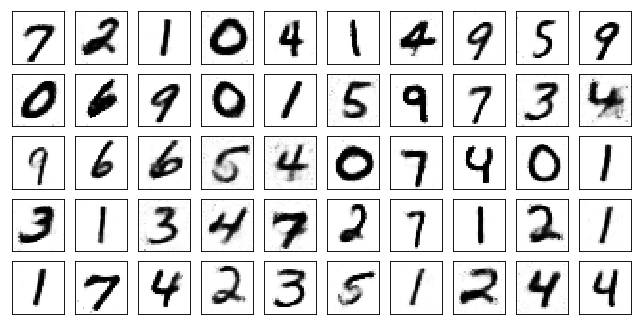

Test losses. G: 1.0947, D: 0.5450
Train Epoch: 134 [0/50000 (0%)]	Losses G: 1.1604, D: 0.6091
Train Epoch: 134 [5000/50000 (10%)]	Losses G: 0.9862, D: 0.6183
Train Epoch: 134 [10000/50000 (20%)]	Losses G: 1.1093, D: 0.5162
Train Epoch: 134 [15000/50000 (30%)]	Losses G: 1.0209, D: 0.6340
Train Epoch: 134 [20000/50000 (40%)]	Losses G: 0.8836, D: 0.5245
Train Epoch: 134 [25000/50000 (50%)]	Losses G: 0.9174, D: 0.5871
Train Epoch: 134 [30000/50000 (60%)]	Losses G: 1.0764, D: 0.6080
Train Epoch: 134 [35000/50000 (70%)]	Losses G: 1.0277, D: 0.5202
Train Epoch: 134 [40000/50000 (80%)]	Losses G: 1.3675, D: 0.6048
Train Epoch: 134 [45000/50000 (90%)]	Losses G: 1.0994, D: 0.6086
Train Epoch: 134 [50000/50000 (100%)]	Losses G: 1.0030, D: 0.6623


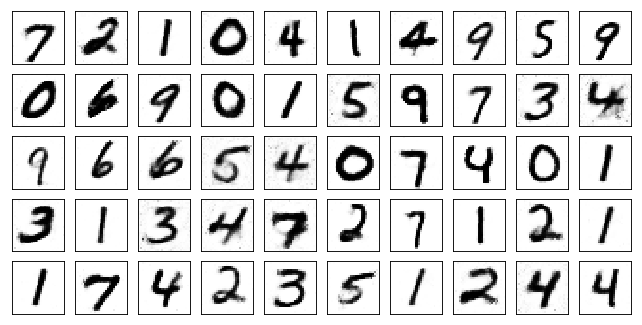

Test losses. G: 0.9991, D: 0.5534
Train Epoch: 135 [0/50000 (0%)]	Losses G: 0.9513, D: 0.6430
Train Epoch: 135 [5000/50000 (10%)]	Losses G: 1.0763, D: 0.6267
Train Epoch: 135 [10000/50000 (20%)]	Losses G: 1.0715, D: 0.5312
Train Epoch: 135 [15000/50000 (30%)]	Losses G: 1.0965, D: 0.5405
Train Epoch: 135 [20000/50000 (40%)]	Losses G: 1.2015, D: 0.5247
Train Epoch: 135 [25000/50000 (50%)]	Losses G: 0.9707, D: 0.5724
Train Epoch: 135 [30000/50000 (60%)]	Losses G: 1.2011, D: 0.5840
Train Epoch: 135 [35000/50000 (70%)]	Losses G: 1.0431, D: 0.5911
Train Epoch: 135 [40000/50000 (80%)]	Losses G: 1.0491, D: 0.5619
Train Epoch: 135 [45000/50000 (90%)]	Losses G: 0.9161, D: 0.5469
Train Epoch: 135 [50000/50000 (100%)]	Losses G: 1.0427, D: 0.5739


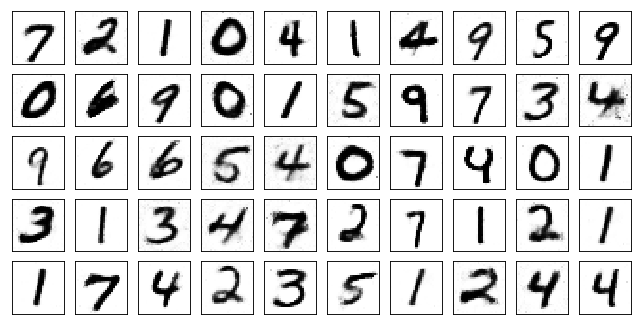

Test losses. G: 0.9621, D: 0.5372
Train Epoch: 136 [0/50000 (0%)]	Losses G: 0.9638, D: 0.5652
Train Epoch: 136 [5000/50000 (10%)]	Losses G: 0.9623, D: 0.5505
Train Epoch: 136 [10000/50000 (20%)]	Losses G: 1.0119, D: 0.5674
Train Epoch: 136 [15000/50000 (30%)]	Losses G: 1.0569, D: 0.5263
Train Epoch: 136 [20000/50000 (40%)]	Losses G: 0.9915, D: 0.6077
Train Epoch: 136 [25000/50000 (50%)]	Losses G: 1.1342, D: 0.5779
Train Epoch: 136 [30000/50000 (60%)]	Losses G: 1.0896, D: 0.5465
Train Epoch: 136 [35000/50000 (70%)]	Losses G: 0.8738, D: 0.5315
Train Epoch: 136 [40000/50000 (80%)]	Losses G: 0.9453, D: 0.6880
Train Epoch: 136 [45000/50000 (90%)]	Losses G: 1.0925, D: 0.6379
Train Epoch: 136 [50000/50000 (100%)]	Losses G: 1.0741, D: 0.5344


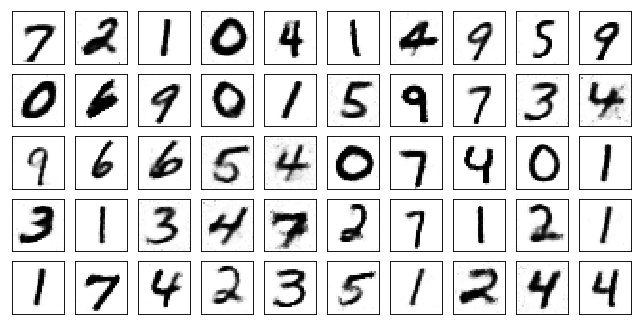

Test losses. G: 0.9544, D: 0.5604
Train Epoch: 137 [0/50000 (0%)]	Losses G: 1.1412, D: 0.5423
Train Epoch: 137 [5000/50000 (10%)]	Losses G: 0.9517, D: 0.6295
Train Epoch: 137 [10000/50000 (20%)]	Losses G: 1.0252, D: 0.5926
Train Epoch: 137 [15000/50000 (30%)]	Losses G: 1.3487, D: 0.6212
Train Epoch: 137 [20000/50000 (40%)]	Losses G: 1.0855, D: 0.5560
Train Epoch: 137 [25000/50000 (50%)]	Losses G: 1.2045, D: 0.5991
Train Epoch: 137 [30000/50000 (60%)]	Losses G: 1.0073, D: 0.5851
Train Epoch: 137 [35000/50000 (70%)]	Losses G: 1.0286, D: 0.5310
Train Epoch: 137 [40000/50000 (80%)]	Losses G: 0.9909, D: 0.5782
Train Epoch: 137 [45000/50000 (90%)]	Losses G: 1.1810, D: 0.6517
Train Epoch: 137 [50000/50000 (100%)]	Losses G: 0.9739, D: 0.6407


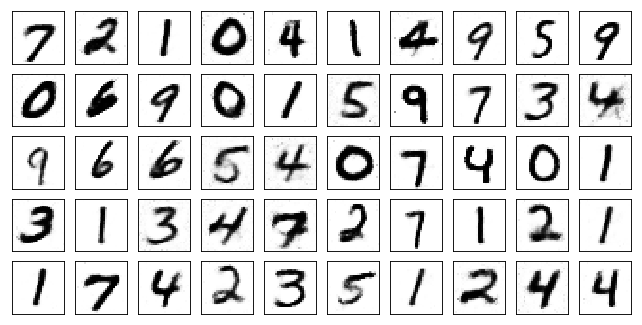

Test losses. G: 0.9642, D: 0.5721
Train Epoch: 138 [0/50000 (0%)]	Losses G: 1.0052, D: 0.5544
Train Epoch: 138 [5000/50000 (10%)]	Losses G: 0.9690, D: 0.6520
Train Epoch: 138 [10000/50000 (20%)]	Losses G: 1.1856, D: 0.5866
Train Epoch: 138 [15000/50000 (30%)]	Losses G: 1.1301, D: 0.6181
Train Epoch: 138 [20000/50000 (40%)]	Losses G: 1.0316, D: 0.6420
Train Epoch: 138 [25000/50000 (50%)]	Losses G: 1.2533, D: 0.5465
Train Epoch: 138 [30000/50000 (60%)]	Losses G: 1.0698, D: 0.5953
Train Epoch: 138 [35000/50000 (70%)]	Losses G: 0.9569, D: 0.5931
Train Epoch: 138 [40000/50000 (80%)]	Losses G: 1.0479, D: 0.5750
Train Epoch: 138 [45000/50000 (90%)]	Losses G: 1.0205, D: 0.6627
Train Epoch: 138 [50000/50000 (100%)]	Losses G: 0.9942, D: 0.5600


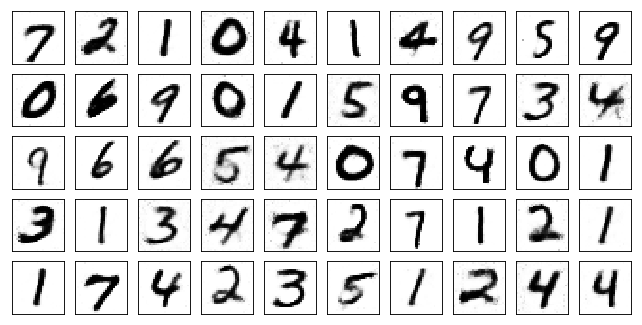

Test losses. G: 1.0054, D: 0.5412
Train Epoch: 139 [0/50000 (0%)]	Losses G: 0.9237, D: 0.7004
Train Epoch: 139 [5000/50000 (10%)]	Losses G: 1.1130, D: 0.5211
Train Epoch: 139 [10000/50000 (20%)]	Losses G: 1.0791, D: 0.5502
Train Epoch: 139 [15000/50000 (30%)]	Losses G: 1.0389, D: 0.5680
Train Epoch: 139 [20000/50000 (40%)]	Losses G: 0.8061, D: 0.5866
Train Epoch: 139 [25000/50000 (50%)]	Losses G: 1.1660, D: 0.5899
Train Epoch: 139 [30000/50000 (60%)]	Losses G: 1.1272, D: 0.5606
Train Epoch: 139 [35000/50000 (70%)]	Losses G: 1.1104, D: 0.6178
Train Epoch: 139 [40000/50000 (80%)]	Losses G: 1.0983, D: 0.6011
Train Epoch: 139 [45000/50000 (90%)]	Losses G: 1.0805, D: 0.5227
Train Epoch: 139 [50000/50000 (100%)]	Losses G: 1.1531, D: 0.6092


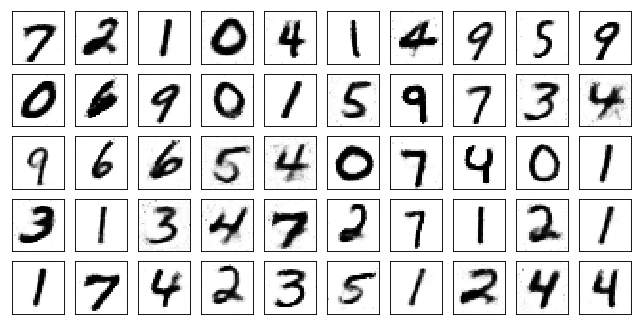

Test losses. G: 1.0763, D: 0.5558
Train Epoch: 140 [0/50000 (0%)]	Losses G: 1.2020, D: 0.5276
Train Epoch: 140 [5000/50000 (10%)]	Losses G: 1.0691, D: 0.5627
Train Epoch: 140 [10000/50000 (20%)]	Losses G: 0.8918, D: 0.5974
Train Epoch: 140 [15000/50000 (30%)]	Losses G: 1.0473, D: 0.6349
Train Epoch: 140 [20000/50000 (40%)]	Losses G: 1.1869, D: 0.5234
Train Epoch: 140 [25000/50000 (50%)]	Losses G: 1.1120, D: 0.5730
Train Epoch: 140 [30000/50000 (60%)]	Losses G: 1.0266, D: 0.5881
Train Epoch: 140 [35000/50000 (70%)]	Losses G: 1.0446, D: 0.6080
Train Epoch: 140 [40000/50000 (80%)]	Losses G: 1.0563, D: 0.5304
Train Epoch: 140 [45000/50000 (90%)]	Losses G: 1.0807, D: 0.5151
Train Epoch: 140 [50000/50000 (100%)]	Losses G: 0.9582, D: 0.5054


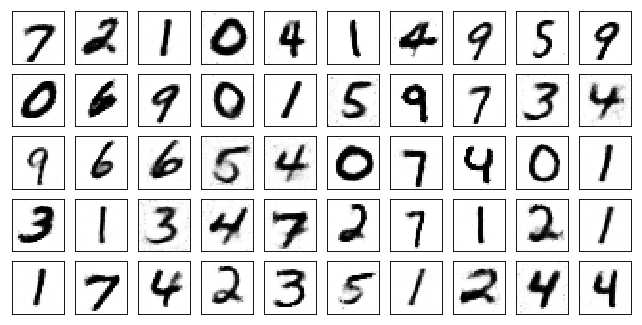

Test losses. G: 1.1703, D: 0.5137
Train Epoch: 141 [0/50000 (0%)]	Losses G: 1.0714, D: 0.5141
Train Epoch: 141 [5000/50000 (10%)]	Losses G: 0.8235, D: 0.5267
Train Epoch: 141 [10000/50000 (20%)]	Losses G: 0.9968, D: 0.6344
Train Epoch: 141 [15000/50000 (30%)]	Losses G: 1.1297, D: 0.5526
Train Epoch: 141 [20000/50000 (40%)]	Losses G: 0.8889, D: 0.5727
Train Epoch: 141 [25000/50000 (50%)]	Losses G: 0.9752, D: 0.4851
Train Epoch: 141 [30000/50000 (60%)]	Losses G: 1.0202, D: 0.5910
Train Epoch: 141 [35000/50000 (70%)]	Losses G: 0.9472, D: 0.5524
Train Epoch: 141 [40000/50000 (80%)]	Losses G: 1.0416, D: 0.5745
Train Epoch: 141 [45000/50000 (90%)]	Losses G: 0.9664, D: 0.5394
Train Epoch: 141 [50000/50000 (100%)]	Losses G: 0.9314, D: 0.5598


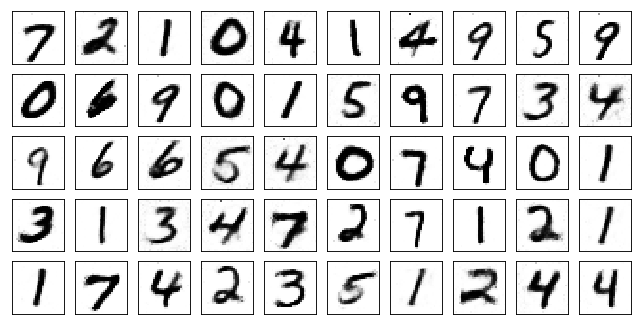

Test losses. G: 0.9908, D: 0.5562
Train Epoch: 142 [0/50000 (0%)]	Losses G: 1.0246, D: 0.6116
Train Epoch: 142 [5000/50000 (10%)]	Losses G: 1.0429, D: 0.5855
Train Epoch: 142 [10000/50000 (20%)]	Losses G: 1.1184, D: 0.5686
Train Epoch: 142 [15000/50000 (30%)]	Losses G: 0.9087, D: 0.5506
Train Epoch: 142 [20000/50000 (40%)]	Losses G: 0.9653, D: 0.6280
Train Epoch: 142 [25000/50000 (50%)]	Losses G: 0.7535, D: 0.5549
Train Epoch: 142 [30000/50000 (60%)]	Losses G: 1.2241, D: 0.6203
Train Epoch: 142 [35000/50000 (70%)]	Losses G: 1.1907, D: 0.5360
Train Epoch: 142 [40000/50000 (80%)]	Losses G: 1.0049, D: 0.5936
Train Epoch: 142 [45000/50000 (90%)]	Losses G: 1.2158, D: 0.5944
Train Epoch: 142 [50000/50000 (100%)]	Losses G: 1.0959, D: 0.5905


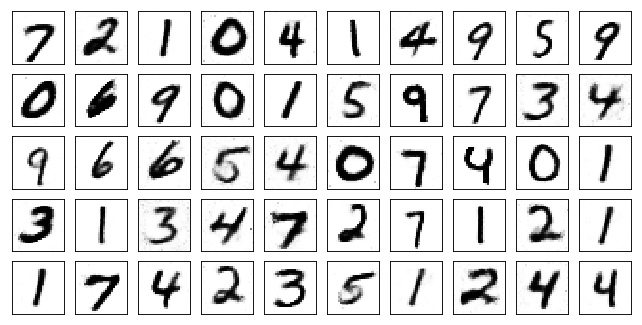

Test losses. G: 1.0006, D: 0.5483
Train Epoch: 143 [0/50000 (0%)]	Losses G: 0.9367, D: 0.6508
Train Epoch: 143 [5000/50000 (10%)]	Losses G: 0.9063, D: 0.5310
Train Epoch: 143 [10000/50000 (20%)]	Losses G: 0.9723, D: 0.5921
Train Epoch: 143 [15000/50000 (30%)]	Losses G: 0.8778, D: 0.5955
Train Epoch: 143 [20000/50000 (40%)]	Losses G: 1.1489, D: 0.5951
Train Epoch: 143 [25000/50000 (50%)]	Losses G: 1.1841, D: 0.5312
Train Epoch: 143 [30000/50000 (60%)]	Losses G: 1.1366, D: 0.6032
Train Epoch: 143 [35000/50000 (70%)]	Losses G: 0.9626, D: 0.5985
Train Epoch: 143 [40000/50000 (80%)]	Losses G: 0.9989, D: 0.6227
Train Epoch: 143 [45000/50000 (90%)]	Losses G: 1.0190, D: 0.6122
Train Epoch: 143 [50000/50000 (100%)]	Losses G: 1.0360, D: 0.5637


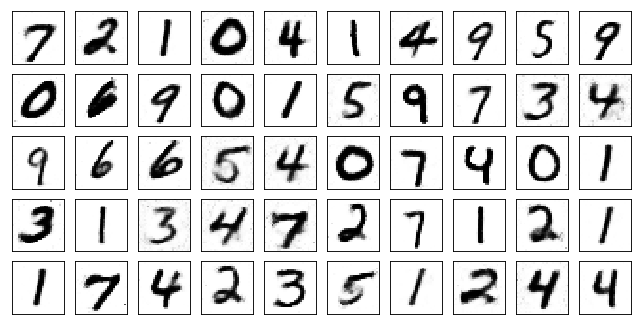

Test losses. G: 0.9427, D: 0.5297
Train Epoch: 144 [0/50000 (0%)]	Losses G: 0.8508, D: 0.6565
Train Epoch: 144 [5000/50000 (10%)]	Losses G: 0.9446, D: 0.6594
Train Epoch: 144 [10000/50000 (20%)]	Losses G: 1.0351, D: 0.5632
Train Epoch: 144 [15000/50000 (30%)]	Losses G: 1.0570, D: 0.5916
Train Epoch: 144 [20000/50000 (40%)]	Losses G: 1.1038, D: 0.6129
Train Epoch: 144 [25000/50000 (50%)]	Losses G: 1.2366, D: 0.5510
Train Epoch: 144 [30000/50000 (60%)]	Losses G: 1.0601, D: 0.5581
Train Epoch: 144 [35000/50000 (70%)]	Losses G: 1.1844, D: 0.5405
Train Epoch: 144 [40000/50000 (80%)]	Losses G: 1.2462, D: 0.5796
Train Epoch: 144 [45000/50000 (90%)]	Losses G: 1.0581, D: 0.5647
Train Epoch: 144 [50000/50000 (100%)]	Losses G: 1.0222, D: 0.5732


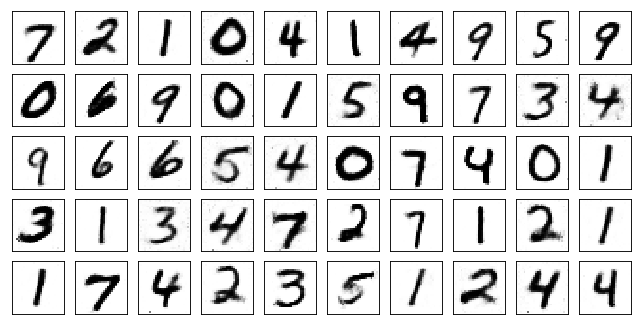

Test losses. G: 1.1487, D: 0.5429
Train Epoch: 145 [0/50000 (0%)]	Losses G: 1.1681, D: 0.5787
Train Epoch: 145 [5000/50000 (10%)]	Losses G: 1.1303, D: 0.6187
Train Epoch: 145 [10000/50000 (20%)]	Losses G: 1.0393, D: 0.5531
Train Epoch: 145 [15000/50000 (30%)]	Losses G: 1.0765, D: 0.5913
Train Epoch: 145 [20000/50000 (40%)]	Losses G: 1.1895, D: 0.5424
Train Epoch: 145 [25000/50000 (50%)]	Losses G: 1.2805, D: 0.5047
Train Epoch: 145 [30000/50000 (60%)]	Losses G: 0.9680, D: 0.6113
Train Epoch: 145 [35000/50000 (70%)]	Losses G: 0.9927, D: 0.6233
Train Epoch: 145 [40000/50000 (80%)]	Losses G: 0.9892, D: 0.5753
Train Epoch: 145 [45000/50000 (90%)]	Losses G: 0.9449, D: 0.5992
Train Epoch: 145 [50000/50000 (100%)]	Losses G: 0.9288, D: 0.6473


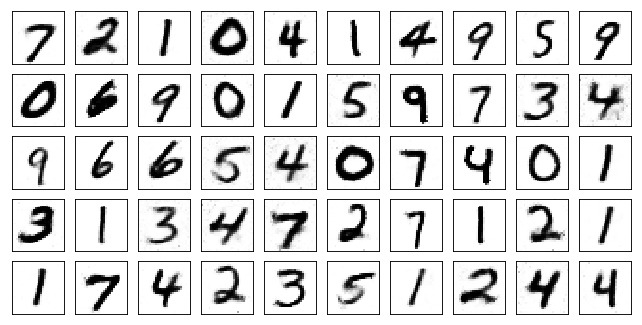

Test losses. G: 0.9750, D: 0.5530
Train Epoch: 146 [0/50000 (0%)]	Losses G: 0.9787, D: 0.6410
Train Epoch: 146 [5000/50000 (10%)]	Losses G: 0.9404, D: 0.5554
Train Epoch: 146 [10000/50000 (20%)]	Losses G: 1.0375, D: 0.5924
Train Epoch: 146 [15000/50000 (30%)]	Losses G: 0.9643, D: 0.5423
Train Epoch: 146 [20000/50000 (40%)]	Losses G: 1.1405, D: 0.6378
Train Epoch: 146 [25000/50000 (50%)]	Losses G: 0.8435, D: 0.5839
Train Epoch: 146 [30000/50000 (60%)]	Losses G: 0.9660, D: 0.6275
Train Epoch: 146 [35000/50000 (70%)]	Losses G: 1.0950, D: 0.5996
Train Epoch: 146 [40000/50000 (80%)]	Losses G: 1.0147, D: 0.5607
Train Epoch: 146 [45000/50000 (90%)]	Losses G: 0.9899, D: 0.6271
Train Epoch: 146 [50000/50000 (100%)]	Losses G: 1.0204, D: 0.6060


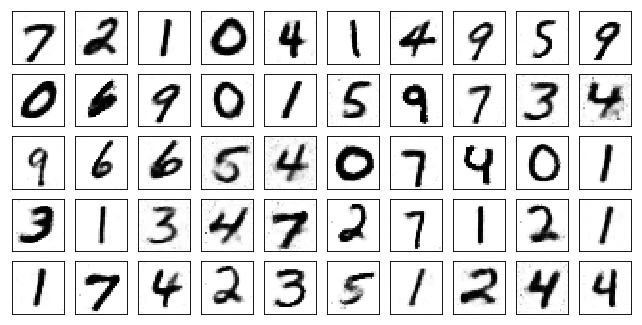

Test losses. G: 0.9845, D: 0.5509
Train Epoch: 147 [0/50000 (0%)]	Losses G: 0.9669, D: 0.6073
Train Epoch: 147 [5000/50000 (10%)]	Losses G: 0.8060, D: 0.5925
Train Epoch: 147 [10000/50000 (20%)]	Losses G: 1.0803, D: 0.5767
Train Epoch: 147 [15000/50000 (30%)]	Losses G: 1.0156, D: 0.5308
Train Epoch: 147 [20000/50000 (40%)]	Losses G: 1.0206, D: 0.5075
Train Epoch: 147 [25000/50000 (50%)]	Losses G: 0.9999, D: 0.5898
Train Epoch: 147 [30000/50000 (60%)]	Losses G: 1.0585, D: 0.5863
Train Epoch: 147 [35000/50000 (70%)]	Losses G: 1.0817, D: 0.6068
Train Epoch: 147 [40000/50000 (80%)]	Losses G: 1.1020, D: 0.6580
Train Epoch: 147 [45000/50000 (90%)]	Losses G: 1.1865, D: 0.6245
Train Epoch: 147 [50000/50000 (100%)]	Losses G: 0.8886, D: 0.6641


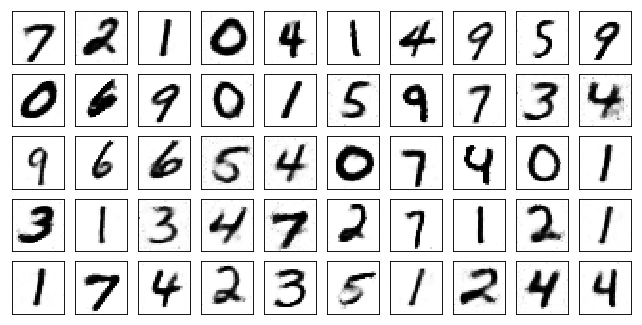

Test losses. G: 0.9543, D: 0.5483
Train Epoch: 148 [0/50000 (0%)]	Losses G: 0.9275, D: 0.6007
Train Epoch: 148 [5000/50000 (10%)]	Losses G: 0.9696, D: 0.6654
Train Epoch: 148 [10000/50000 (20%)]	Losses G: 1.1241, D: 0.5558
Train Epoch: 148 [15000/50000 (30%)]	Losses G: 0.8468, D: 0.5740
Train Epoch: 148 [20000/50000 (40%)]	Losses G: 0.9488, D: 0.6392
Train Epoch: 148 [25000/50000 (50%)]	Losses G: 0.9114, D: 0.6062
Train Epoch: 148 [30000/50000 (60%)]	Losses G: 1.0032, D: 0.5630
Train Epoch: 148 [35000/50000 (70%)]	Losses G: 0.9691, D: 0.6054
Train Epoch: 148 [40000/50000 (80%)]	Losses G: 0.8995, D: 0.6663
Train Epoch: 148 [45000/50000 (90%)]	Losses G: 1.0993, D: 0.5881
Train Epoch: 148 [50000/50000 (100%)]	Losses G: 1.1604, D: 0.6464


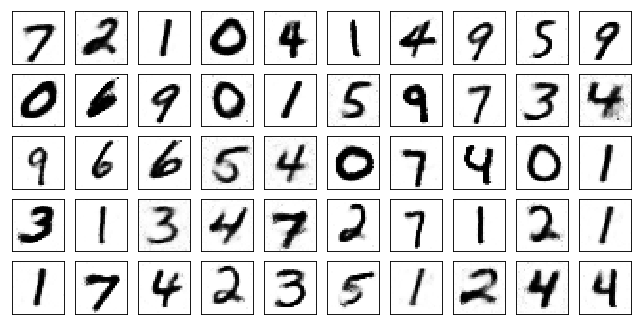

Test losses. G: 1.2417, D: 0.5313
Train Epoch: 149 [0/50000 (0%)]	Losses G: 1.0560, D: 0.5705
Train Epoch: 149 [5000/50000 (10%)]	Losses G: 1.0576, D: 0.6075
Train Epoch: 149 [10000/50000 (20%)]	Losses G: 1.0366, D: 0.6062
Train Epoch: 149 [15000/50000 (30%)]	Losses G: 1.1605, D: 0.6142
Train Epoch: 149 [20000/50000 (40%)]	Losses G: 0.8747, D: 0.5877
Train Epoch: 149 [25000/50000 (50%)]	Losses G: 1.0272, D: 0.5303
Train Epoch: 149 [30000/50000 (60%)]	Losses G: 0.9190, D: 0.6090
Train Epoch: 149 [35000/50000 (70%)]	Losses G: 1.0675, D: 0.4843
Train Epoch: 149 [40000/50000 (80%)]	Losses G: 1.1956, D: 0.5238
Train Epoch: 149 [45000/50000 (90%)]	Losses G: 1.1433, D: 0.5689
Train Epoch: 149 [50000/50000 (100%)]	Losses G: 0.9701, D: 0.5328


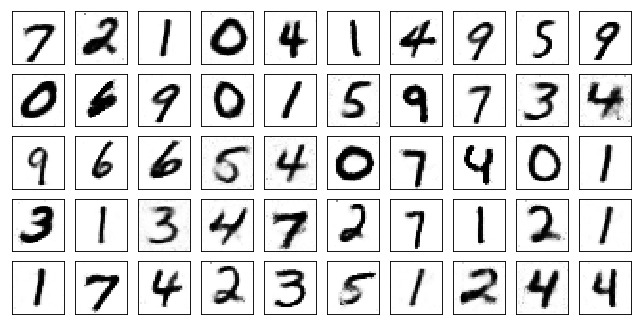

Test losses. G: 1.0122, D: 0.5471
Train Epoch: 150 [0/50000 (0%)]	Losses G: 1.0281, D: 0.5700
Train Epoch: 150 [5000/50000 (10%)]	Losses G: 0.9935, D: 0.5632
Train Epoch: 150 [10000/50000 (20%)]	Losses G: 1.1423, D: 0.5753
Train Epoch: 150 [15000/50000 (30%)]	Losses G: 0.8788, D: 0.6270
Train Epoch: 150 [20000/50000 (40%)]	Losses G: 0.9487, D: 0.5500
Train Epoch: 150 [25000/50000 (50%)]	Losses G: 1.0154, D: 0.6137
Train Epoch: 150 [30000/50000 (60%)]	Losses G: 0.7839, D: 0.5810
Train Epoch: 150 [35000/50000 (70%)]	Losses G: 0.9782, D: 0.5710
Train Epoch: 150 [40000/50000 (80%)]	Losses G: 1.0174, D: 0.6801
Train Epoch: 150 [45000/50000 (90%)]	Losses G: 0.8696, D: 0.5767
Train Epoch: 150 [50000/50000 (100%)]	Losses G: 0.8244, D: 0.6111


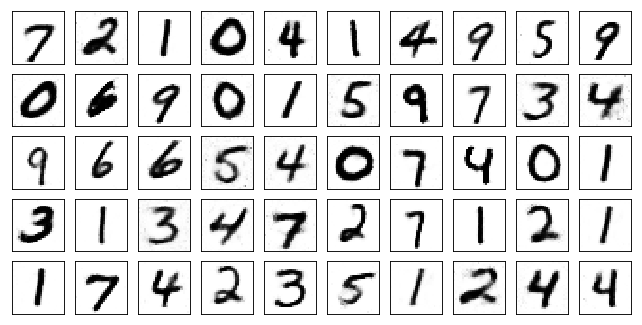

Test losses. G: 0.8721, D: 0.5368
Train Epoch: 151 [0/50000 (0%)]	Losses G: 0.8413, D: 0.6004
Train Epoch: 151 [5000/50000 (10%)]	Losses G: 1.0506, D: 0.5983
Train Epoch: 151 [10000/50000 (20%)]	Losses G: 1.1328, D: 0.5870
Train Epoch: 151 [15000/50000 (30%)]	Losses G: 0.8873, D: 0.6102
Train Epoch: 151 [20000/50000 (40%)]	Losses G: 0.9933, D: 0.5948
Train Epoch: 151 [25000/50000 (50%)]	Losses G: 1.0220, D: 0.5296
Train Epoch: 151 [30000/50000 (60%)]	Losses G: 1.0065, D: 0.6337
Train Epoch: 151 [35000/50000 (70%)]	Losses G: 1.0516, D: 0.6099
Train Epoch: 151 [40000/50000 (80%)]	Losses G: 0.9476, D: 0.6605
Train Epoch: 151 [45000/50000 (90%)]	Losses G: 1.0417, D: 0.5929
Train Epoch: 151 [50000/50000 (100%)]	Losses G: 0.9214, D: 0.5567


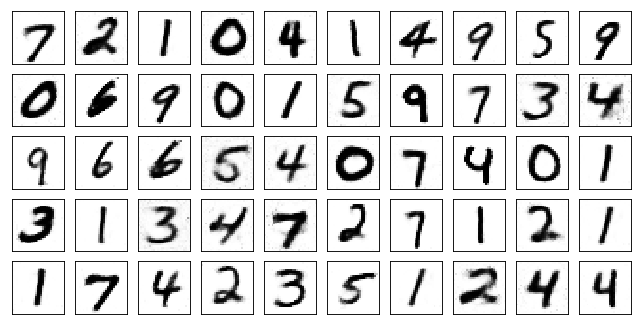

Test losses. G: 1.1207, D: 0.5312
Train Epoch: 152 [0/50000 (0%)]	Losses G: 1.1285, D: 0.6177
Train Epoch: 152 [5000/50000 (10%)]	Losses G: 1.0126, D: 0.5772
Train Epoch: 152 [10000/50000 (20%)]	Losses G: 0.8667, D: 0.6127
Train Epoch: 152 [15000/50000 (30%)]	Losses G: 0.9402, D: 0.5820
Train Epoch: 152 [20000/50000 (40%)]	Losses G: 0.8533, D: 0.5899
Train Epoch: 152 [25000/50000 (50%)]	Losses G: 1.0991, D: 0.6123
Train Epoch: 152 [30000/50000 (60%)]	Losses G: 0.8263, D: 0.6028
Train Epoch: 152 [35000/50000 (70%)]	Losses G: 1.0954, D: 0.5435
Train Epoch: 152 [40000/50000 (80%)]	Losses G: 0.9732, D: 0.5187
Train Epoch: 152 [45000/50000 (90%)]	Losses G: 0.9814, D: 0.5683
Train Epoch: 152 [50000/50000 (100%)]	Losses G: 0.8789, D: 0.5371


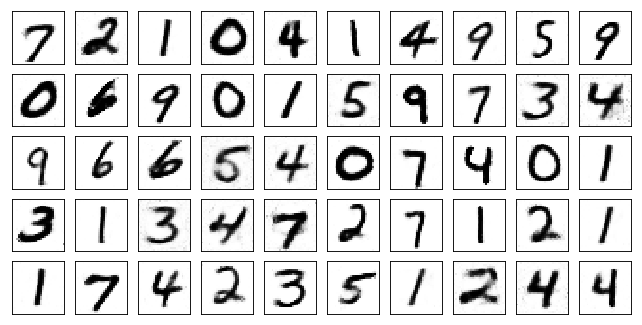

Test losses. G: 0.9835, D: 0.5530
Train Epoch: 153 [0/50000 (0%)]	Losses G: 0.8431, D: 0.5689
Train Epoch: 153 [5000/50000 (10%)]	Losses G: 0.9932, D: 0.6114
Train Epoch: 153 [10000/50000 (20%)]	Losses G: 0.8836, D: 0.5957
Train Epoch: 153 [15000/50000 (30%)]	Losses G: 0.9471, D: 0.5893
Train Epoch: 153 [20000/50000 (40%)]	Losses G: 0.9161, D: 0.6056
Train Epoch: 153 [25000/50000 (50%)]	Losses G: 1.0608, D: 0.5440
Train Epoch: 153 [30000/50000 (60%)]	Losses G: 1.0375, D: 0.6186
Train Epoch: 153 [35000/50000 (70%)]	Losses G: 1.1630, D: 0.5674
Train Epoch: 153 [40000/50000 (80%)]	Losses G: 1.1548, D: 0.5981
Train Epoch: 153 [45000/50000 (90%)]	Losses G: 0.8894, D: 0.5861
Train Epoch: 153 [50000/50000 (100%)]	Losses G: 1.0527, D: 0.6688


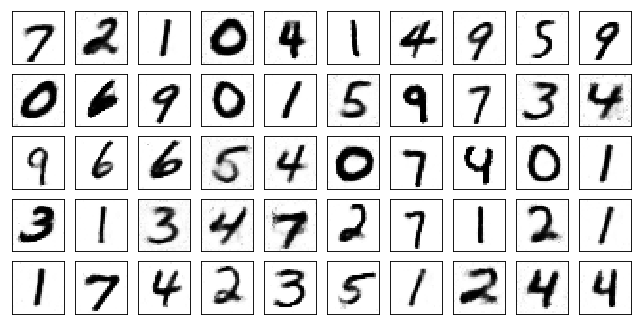

Test losses. G: 1.0828, D: 0.5397
Train Epoch: 154 [0/50000 (0%)]	Losses G: 1.1076, D: 0.6150
Train Epoch: 154 [5000/50000 (10%)]	Losses G: 1.1681, D: 0.5497
Train Epoch: 154 [10000/50000 (20%)]	Losses G: 0.9121, D: 0.6152
Train Epoch: 154 [15000/50000 (30%)]	Losses G: 1.2782, D: 0.6726
Train Epoch: 154 [20000/50000 (40%)]	Losses G: 0.9175, D: 0.5826
Train Epoch: 154 [25000/50000 (50%)]	Losses G: 1.0474, D: 0.5596
Train Epoch: 154 [30000/50000 (60%)]	Losses G: 0.7890, D: 0.5721
Train Epoch: 154 [35000/50000 (70%)]	Losses G: 1.0611, D: 0.5742
Train Epoch: 154 [40000/50000 (80%)]	Losses G: 0.7915, D: 0.6190
Train Epoch: 154 [45000/50000 (90%)]	Losses G: 1.2045, D: 0.5625
Train Epoch: 154 [50000/50000 (100%)]	Losses G: 1.1195, D: 0.6085


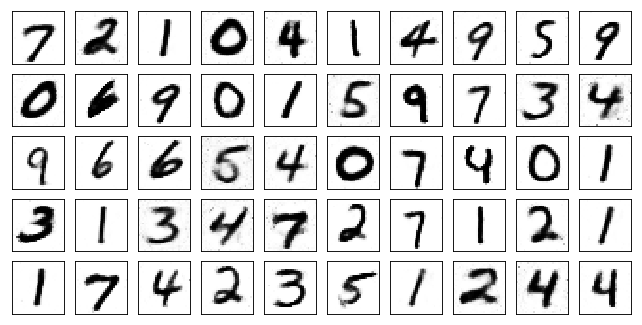

Test losses. G: 1.0289, D: 0.5446
Train Epoch: 155 [0/50000 (0%)]	Losses G: 1.0681, D: 0.5688
Train Epoch: 155 [5000/50000 (10%)]	Losses G: 0.9892, D: 0.4777
Train Epoch: 155 [10000/50000 (20%)]	Losses G: 0.9620, D: 0.6000
Train Epoch: 155 [15000/50000 (30%)]	Losses G: 1.1180, D: 0.5906
Train Epoch: 155 [20000/50000 (40%)]	Losses G: 0.8932, D: 0.6737
Train Epoch: 155 [25000/50000 (50%)]	Losses G: 0.9067, D: 0.5533
Train Epoch: 155 [30000/50000 (60%)]	Losses G: 1.0965, D: 0.6285
Train Epoch: 155 [35000/50000 (70%)]	Losses G: 1.0769, D: 0.5425
Train Epoch: 155 [40000/50000 (80%)]	Losses G: 1.0936, D: 0.6004
Train Epoch: 155 [45000/50000 (90%)]	Losses G: 1.2144, D: 0.5968
Train Epoch: 155 [50000/50000 (100%)]	Losses G: 1.2388, D: 0.5093


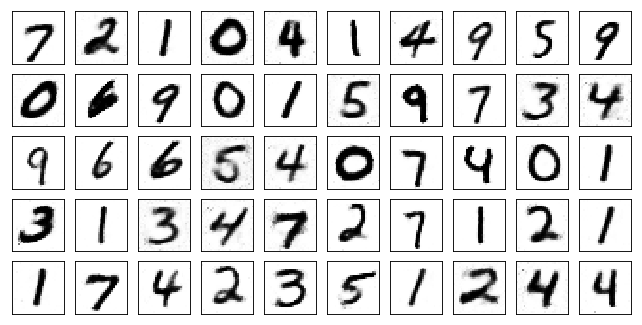

Test losses. G: 1.0539, D: 0.5135
Train Epoch: 156 [0/50000 (0%)]	Losses G: 1.1282, D: 0.5382
Train Epoch: 156 [5000/50000 (10%)]	Losses G: 1.0664, D: 0.5492
Train Epoch: 156 [10000/50000 (20%)]	Losses G: 1.0282, D: 0.5068
Train Epoch: 156 [15000/50000 (30%)]	Losses G: 1.0195, D: 0.5681
Train Epoch: 156 [20000/50000 (40%)]	Losses G: 1.0792, D: 0.6271
Train Epoch: 156 [25000/50000 (50%)]	Losses G: 1.0232, D: 0.6209
Train Epoch: 156 [30000/50000 (60%)]	Losses G: 1.0030, D: 0.5757
Train Epoch: 156 [35000/50000 (70%)]	Losses G: 0.9268, D: 0.5410
Train Epoch: 156 [40000/50000 (80%)]	Losses G: 1.2309, D: 0.5395
Train Epoch: 156 [45000/50000 (90%)]	Losses G: 0.9562, D: 0.6136
Train Epoch: 156 [50000/50000 (100%)]	Losses G: 0.8750, D: 0.4576


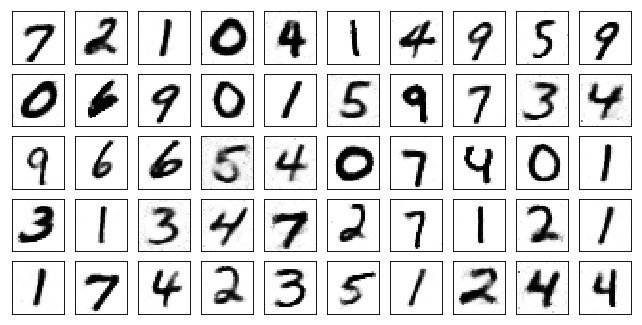

Test losses. G: 0.9778, D: 0.5378
Train Epoch: 157 [0/50000 (0%)]	Losses G: 1.1710, D: 0.4996
Train Epoch: 157 [5000/50000 (10%)]	Losses G: 1.2204, D: 0.5446
Train Epoch: 157 [10000/50000 (20%)]	Losses G: 1.2478, D: 0.5665
Train Epoch: 157 [15000/50000 (30%)]	Losses G: 1.0582, D: 0.5460
Train Epoch: 157 [20000/50000 (40%)]	Losses G: 1.1690, D: 0.5528
Train Epoch: 157 [25000/50000 (50%)]	Losses G: 1.1098, D: 0.5940
Train Epoch: 157 [30000/50000 (60%)]	Losses G: 0.9792, D: 0.6058
Train Epoch: 157 [35000/50000 (70%)]	Losses G: 1.0610, D: 0.5002
Train Epoch: 157 [40000/50000 (80%)]	Losses G: 1.0518, D: 0.5303
Train Epoch: 157 [45000/50000 (90%)]	Losses G: 1.0591, D: 0.5132
Train Epoch: 157 [50000/50000 (100%)]	Losses G: 1.0310, D: 0.6464


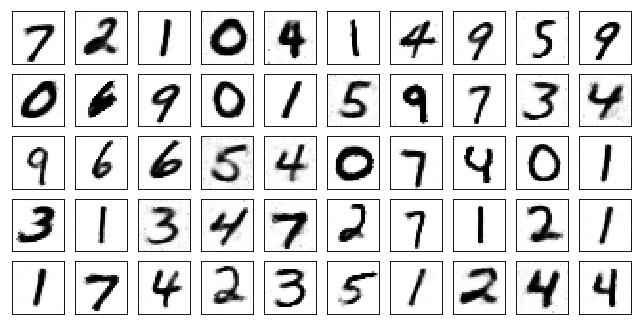

Test losses. G: 1.0604, D: 0.5383
Train Epoch: 158 [0/50000 (0%)]	Losses G: 1.0357, D: 0.5696
Train Epoch: 158 [5000/50000 (10%)]	Losses G: 1.1255, D: 0.5743
Train Epoch: 158 [10000/50000 (20%)]	Losses G: 1.1290, D: 0.5629
Train Epoch: 158 [15000/50000 (30%)]	Losses G: 1.0778, D: 0.5205
Train Epoch: 158 [20000/50000 (40%)]	Losses G: 1.0759, D: 0.5498
Train Epoch: 158 [25000/50000 (50%)]	Losses G: 1.0103, D: 0.6109
Train Epoch: 158 [30000/50000 (60%)]	Losses G: 1.0226, D: 0.5595
Train Epoch: 158 [35000/50000 (70%)]	Losses G: 0.9657, D: 0.6350
Train Epoch: 158 [40000/50000 (80%)]	Losses G: 1.0380, D: 0.5418
Train Epoch: 158 [45000/50000 (90%)]	Losses G: 1.0756, D: 0.5532
Train Epoch: 158 [50000/50000 (100%)]	Losses G: 1.0254, D: 0.5591


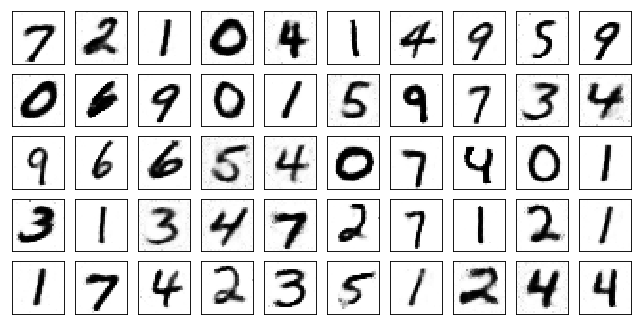

Test losses. G: 1.0867, D: 0.5397
Train Epoch: 159 [0/50000 (0%)]	Losses G: 1.1437, D: 0.5594
Train Epoch: 159 [5000/50000 (10%)]	Losses G: 0.9207, D: 0.5637
Train Epoch: 159 [10000/50000 (20%)]	Losses G: 1.0019, D: 0.5743
Train Epoch: 159 [15000/50000 (30%)]	Losses G: 0.9993, D: 0.5772
Train Epoch: 159 [20000/50000 (40%)]	Losses G: 1.2923, D: 0.5843
Train Epoch: 159 [25000/50000 (50%)]	Losses G: 1.2736, D: 0.6523
Train Epoch: 159 [30000/50000 (60%)]	Losses G: 1.0962, D: 0.5297
Train Epoch: 159 [35000/50000 (70%)]	Losses G: 1.0369, D: 0.6046
Train Epoch: 159 [40000/50000 (80%)]	Losses G: 0.9069, D: 0.6105
Train Epoch: 159 [45000/50000 (90%)]	Losses G: 1.0519, D: 0.5301
Train Epoch: 159 [50000/50000 (100%)]	Losses G: 0.9422, D: 0.5734


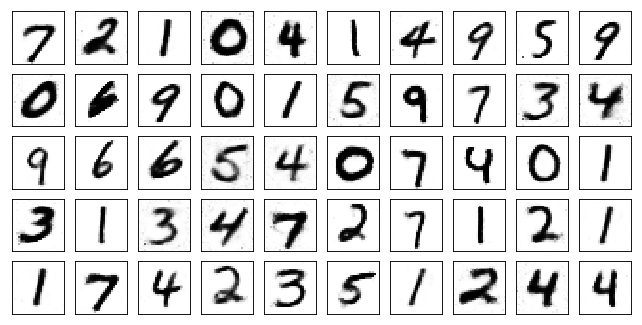

Test losses. G: 0.9871, D: 0.5500
Train Epoch: 160 [0/50000 (0%)]	Losses G: 1.0676, D: 0.5843
Train Epoch: 160 [5000/50000 (10%)]	Losses G: 1.2690, D: 0.6123
Train Epoch: 160 [10000/50000 (20%)]	Losses G: 1.0458, D: 0.6516
Train Epoch: 160 [15000/50000 (30%)]	Losses G: 1.0508, D: 0.4926
Train Epoch: 160 [20000/50000 (40%)]	Losses G: 0.9511, D: 0.5874
Train Epoch: 160 [25000/50000 (50%)]	Losses G: 1.0833, D: 0.5111
Train Epoch: 160 [30000/50000 (60%)]	Losses G: 0.9718, D: 0.5688
Train Epoch: 160 [35000/50000 (70%)]	Losses G: 1.1410, D: 0.5938
Train Epoch: 160 [40000/50000 (80%)]	Losses G: 1.1911, D: 0.6135
Train Epoch: 160 [45000/50000 (90%)]	Losses G: 0.7782, D: 0.5533
Train Epoch: 160 [50000/50000 (100%)]	Losses G: 0.9817, D: 0.5395


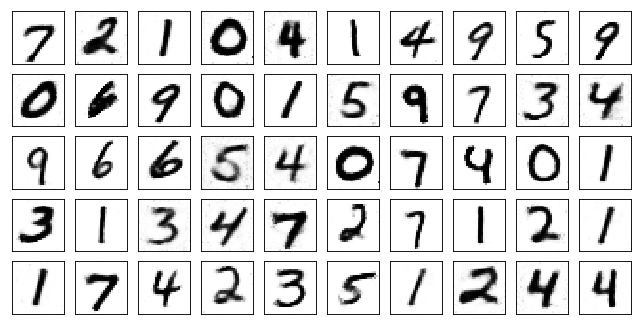

Test losses. G: 0.9671, D: 0.5460
Train Epoch: 161 [0/50000 (0%)]	Losses G: 1.0984, D: 0.5465
Train Epoch: 161 [5000/50000 (10%)]	Losses G: 0.9955, D: 0.6370
Train Epoch: 161 [10000/50000 (20%)]	Losses G: 0.9807, D: 0.5814
Train Epoch: 161 [15000/50000 (30%)]	Losses G: 1.0642, D: 0.6016
Train Epoch: 161 [20000/50000 (40%)]	Losses G: 1.1139, D: 0.6188
Train Epoch: 161 [25000/50000 (50%)]	Losses G: 1.0751, D: 0.5745
Train Epoch: 161 [30000/50000 (60%)]	Losses G: 0.9851, D: 0.5772
Train Epoch: 161 [35000/50000 (70%)]	Losses G: 1.0883, D: 0.5102
Train Epoch: 161 [40000/50000 (80%)]	Losses G: 1.0947, D: 0.5423
Train Epoch: 161 [45000/50000 (90%)]	Losses G: 0.8091, D: 0.6496
Train Epoch: 161 [50000/50000 (100%)]	Losses G: 1.0450, D: 0.5700


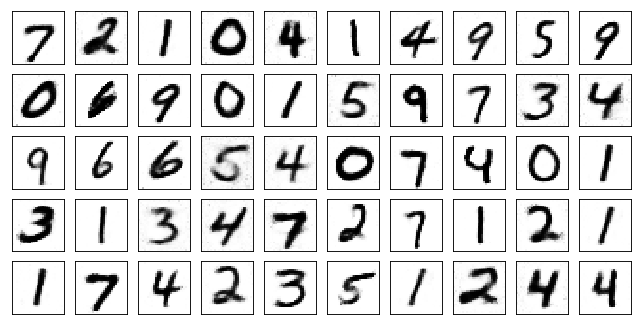

Test losses. G: 1.0749, D: 0.5745
Train Epoch: 162 [0/50000 (0%)]	Losses G: 1.0413, D: 0.5430
Train Epoch: 162 [5000/50000 (10%)]	Losses G: 0.9885, D: 0.6450
Train Epoch: 162 [10000/50000 (20%)]	Losses G: 0.8986, D: 0.6298
Train Epoch: 162 [15000/50000 (30%)]	Losses G: 1.0133, D: 0.5306
Train Epoch: 162 [20000/50000 (40%)]	Losses G: 0.9823, D: 0.6619
Train Epoch: 162 [25000/50000 (50%)]	Losses G: 1.1209, D: 0.5945
Train Epoch: 162 [30000/50000 (60%)]	Losses G: 0.9384, D: 0.5298
Train Epoch: 162 [35000/50000 (70%)]	Losses G: 1.3148, D: 0.5227
Train Epoch: 162 [40000/50000 (80%)]	Losses G: 0.9404, D: 0.5512
Train Epoch: 162 [45000/50000 (90%)]	Losses G: 1.0751, D: 0.5912
Train Epoch: 162 [50000/50000 (100%)]	Losses G: 1.3317, D: 0.5831


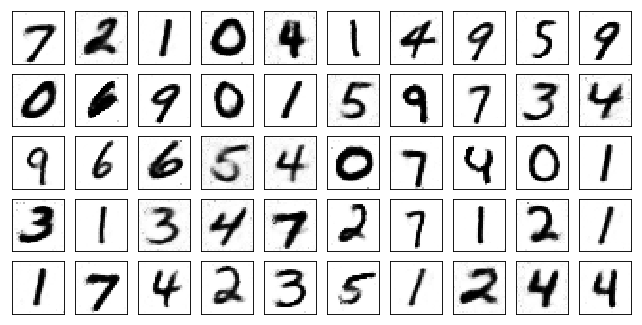

Test losses. G: 1.0033, D: 0.5383
Train Epoch: 163 [0/50000 (0%)]	Losses G: 1.2224, D: 0.6212
Train Epoch: 163 [5000/50000 (10%)]	Losses G: 1.1227, D: 0.5404
Train Epoch: 163 [10000/50000 (20%)]	Losses G: 0.9101, D: 0.5935
Train Epoch: 163 [15000/50000 (30%)]	Losses G: 1.1645, D: 0.5656
Train Epoch: 163 [20000/50000 (40%)]	Losses G: 1.1725, D: 0.5622
Train Epoch: 163 [25000/50000 (50%)]	Losses G: 1.0487, D: 0.5543
Train Epoch: 163 [30000/50000 (60%)]	Losses G: 1.2487, D: 0.5933
Train Epoch: 163 [35000/50000 (70%)]	Losses G: 0.9880, D: 0.5166
Train Epoch: 163 [40000/50000 (80%)]	Losses G: 1.0112, D: 0.6266
Train Epoch: 163 [45000/50000 (90%)]	Losses G: 1.0820, D: 0.5503
Train Epoch: 163 [50000/50000 (100%)]	Losses G: 1.0157, D: 0.6496


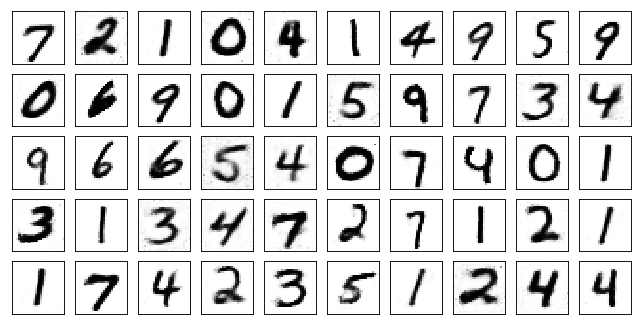

Test losses. G: 1.0561, D: 0.5661
Train Epoch: 164 [0/50000 (0%)]	Losses G: 1.0012, D: 0.5991
Train Epoch: 164 [5000/50000 (10%)]	Losses G: 1.0045, D: 0.5818
Train Epoch: 164 [10000/50000 (20%)]	Losses G: 0.9707, D: 0.5729
Train Epoch: 164 [15000/50000 (30%)]	Losses G: 1.0073, D: 0.6284
Train Epoch: 164 [20000/50000 (40%)]	Losses G: 1.0760, D: 0.5674
Train Epoch: 164 [25000/50000 (50%)]	Losses G: 1.0242, D: 0.5796
Train Epoch: 164 [30000/50000 (60%)]	Losses G: 0.9096, D: 0.7202
Train Epoch: 164 [35000/50000 (70%)]	Losses G: 0.9571, D: 0.6298
Train Epoch: 164 [40000/50000 (80%)]	Losses G: 1.0566, D: 0.6441
Train Epoch: 164 [45000/50000 (90%)]	Losses G: 1.0778, D: 0.5619
Train Epoch: 164 [50000/50000 (100%)]	Losses G: 0.9623, D: 0.5716


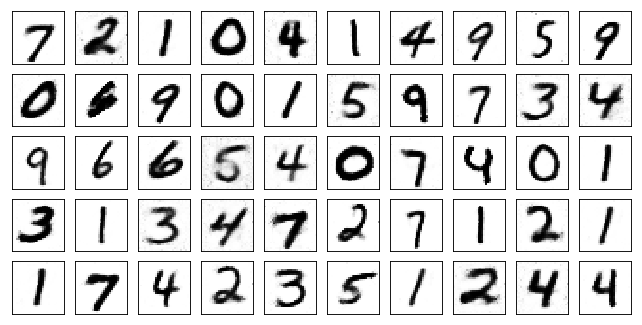

Test losses. G: 1.0926, D: 0.5602
Train Epoch: 165 [0/50000 (0%)]	Losses G: 1.0168, D: 0.5140
Train Epoch: 165 [5000/50000 (10%)]	Losses G: 1.0010, D: 0.5637
Train Epoch: 165 [10000/50000 (20%)]	Losses G: 1.1215, D: 0.5711
Train Epoch: 165 [15000/50000 (30%)]	Losses G: 1.1598, D: 0.6349
Train Epoch: 165 [20000/50000 (40%)]	Losses G: 1.1934, D: 0.6053
Train Epoch: 165 [25000/50000 (50%)]	Losses G: 1.0669, D: 0.5945
Train Epoch: 165 [30000/50000 (60%)]	Losses G: 1.2128, D: 0.5492
Train Epoch: 165 [35000/50000 (70%)]	Losses G: 1.0221, D: 0.5944
Train Epoch: 165 [40000/50000 (80%)]	Losses G: 1.1089, D: 0.5583
Train Epoch: 165 [45000/50000 (90%)]	Losses G: 1.0990, D: 0.5992
Train Epoch: 165 [50000/50000 (100%)]	Losses G: 0.9168, D: 0.6515


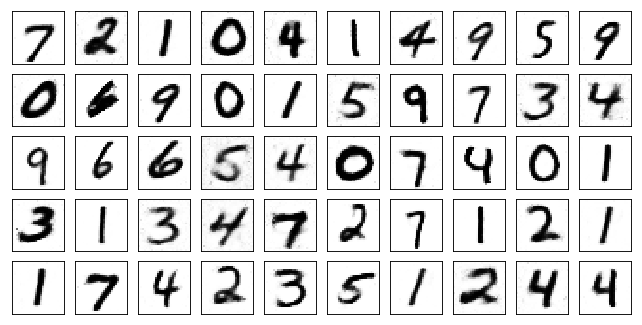

Test losses. G: 0.9707, D: 0.5756
Train Epoch: 166 [0/50000 (0%)]	Losses G: 1.0809, D: 0.6180
Train Epoch: 166 [5000/50000 (10%)]	Losses G: 1.0408, D: 0.5402
Train Epoch: 166 [10000/50000 (20%)]	Losses G: 0.9206, D: 0.6452
Train Epoch: 166 [15000/50000 (30%)]	Losses G: 1.1294, D: 0.6012
Train Epoch: 166 [20000/50000 (40%)]	Losses G: 0.9393, D: 0.6522
Train Epoch: 166 [25000/50000 (50%)]	Losses G: 1.1260, D: 0.6313
Train Epoch: 166 [30000/50000 (60%)]	Losses G: 1.0570, D: 0.5901
Train Epoch: 166 [35000/50000 (70%)]	Losses G: 0.9225, D: 0.6156
Train Epoch: 166 [40000/50000 (80%)]	Losses G: 1.2031, D: 0.5996
Train Epoch: 166 [45000/50000 (90%)]	Losses G: 1.2608, D: 0.5469
Train Epoch: 166 [50000/50000 (100%)]	Losses G: 0.8939, D: 0.5849


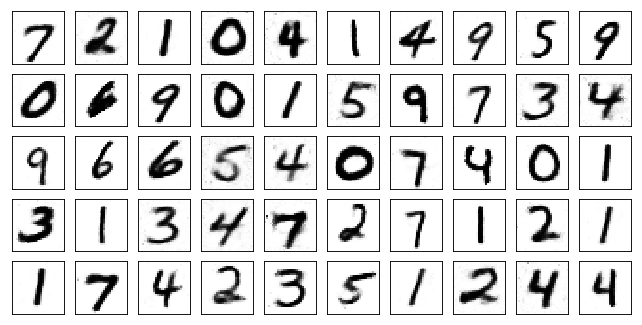

Test losses. G: 1.0153, D: 0.5624
Train Epoch: 167 [0/50000 (0%)]	Losses G: 0.9763, D: 0.4889
Train Epoch: 167 [5000/50000 (10%)]	Losses G: 1.2123, D: 0.6008
Train Epoch: 167 [10000/50000 (20%)]	Losses G: 1.1101, D: 0.5888
Train Epoch: 167 [15000/50000 (30%)]	Losses G: 1.0475, D: 0.5743
Train Epoch: 167 [20000/50000 (40%)]	Losses G: 1.0441, D: 0.5965
Train Epoch: 167 [25000/50000 (50%)]	Losses G: 0.8790, D: 0.5421
Train Epoch: 167 [30000/50000 (60%)]	Losses G: 0.8951, D: 0.5729
Train Epoch: 167 [35000/50000 (70%)]	Losses G: 1.1839, D: 0.5475
Train Epoch: 167 [40000/50000 (80%)]	Losses G: 1.1196, D: 0.5849
Train Epoch: 167 [45000/50000 (90%)]	Losses G: 1.0818, D: 0.5564
Train Epoch: 167 [50000/50000 (100%)]	Losses G: 1.0980, D: 0.6043


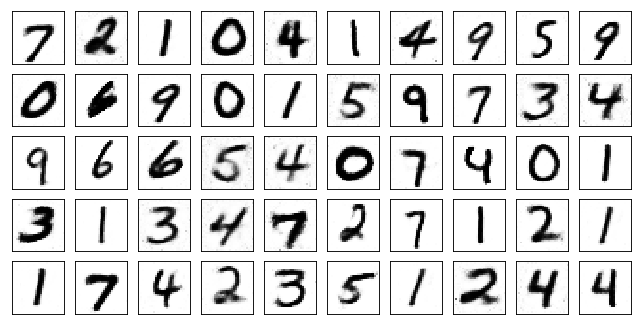

Test losses. G: 1.0061, D: 0.5458
Train Epoch: 168 [0/50000 (0%)]	Losses G: 0.9499, D: 0.5770
Train Epoch: 168 [5000/50000 (10%)]	Losses G: 1.0121, D: 0.5179
Train Epoch: 168 [10000/50000 (20%)]	Losses G: 1.0065, D: 0.6189
Train Epoch: 168 [15000/50000 (30%)]	Losses G: 0.9961, D: 0.6525
Train Epoch: 168 [20000/50000 (40%)]	Losses G: 1.1756, D: 0.5783
Train Epoch: 168 [25000/50000 (50%)]	Losses G: 1.3452, D: 0.5619
Train Epoch: 168 [30000/50000 (60%)]	Losses G: 1.0621, D: 0.5708
Train Epoch: 168 [35000/50000 (70%)]	Losses G: 1.1013, D: 0.5652
Train Epoch: 168 [40000/50000 (80%)]	Losses G: 0.9453, D: 0.4993
Train Epoch: 168 [45000/50000 (90%)]	Losses G: 0.9604, D: 0.5411
Train Epoch: 168 [50000/50000 (100%)]	Losses G: 0.9725, D: 0.6255


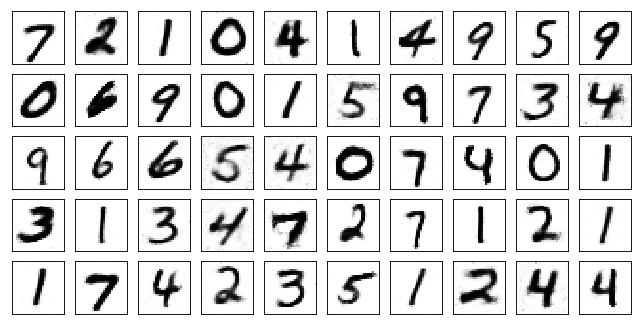

Test losses. G: 1.0240, D: 0.5665
Train Epoch: 169 [0/50000 (0%)]	Losses G: 1.0449, D: 0.5024
Train Epoch: 169 [5000/50000 (10%)]	Losses G: 0.9448, D: 0.5638
Train Epoch: 169 [10000/50000 (20%)]	Losses G: 1.0997, D: 0.5708
Train Epoch: 169 [15000/50000 (30%)]	Losses G: 1.0129, D: 0.6061
Train Epoch: 169 [20000/50000 (40%)]	Losses G: 0.9624, D: 0.6527
Train Epoch: 169 [25000/50000 (50%)]	Losses G: 1.0381, D: 0.6197
Train Epoch: 169 [30000/50000 (60%)]	Losses G: 1.2137, D: 0.6605
Train Epoch: 169 [35000/50000 (70%)]	Losses G: 1.0952, D: 0.5250
Train Epoch: 169 [40000/50000 (80%)]	Losses G: 0.9982, D: 0.5008
Train Epoch: 169 [45000/50000 (90%)]	Losses G: 1.0551, D: 0.6894
Train Epoch: 169 [50000/50000 (100%)]	Losses G: 0.9040, D: 0.5899


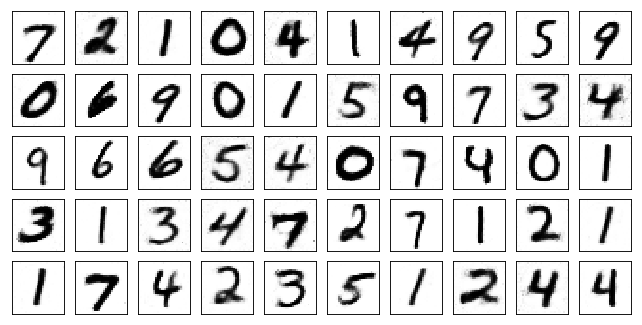

Test losses. G: 1.0320, D: 0.5555
Train Epoch: 170 [0/50000 (0%)]	Losses G: 0.8704, D: 0.6771
Train Epoch: 170 [5000/50000 (10%)]	Losses G: 0.8260, D: 0.6327
Train Epoch: 170 [10000/50000 (20%)]	Losses G: 0.9934, D: 0.5314
Train Epoch: 170 [15000/50000 (30%)]	Losses G: 0.9387, D: 0.5912
Train Epoch: 170 [20000/50000 (40%)]	Losses G: 1.2143, D: 0.5621
Train Epoch: 170 [25000/50000 (50%)]	Losses G: 1.0406, D: 0.6362
Train Epoch: 170 [30000/50000 (60%)]	Losses G: 1.1235, D: 0.6220
Train Epoch: 170 [35000/50000 (70%)]	Losses G: 0.9917, D: 0.5496
Train Epoch: 170 [40000/50000 (80%)]	Losses G: 0.9644, D: 0.5965
Train Epoch: 170 [45000/50000 (90%)]	Losses G: 1.0909, D: 0.5921
Train Epoch: 170 [50000/50000 (100%)]	Losses G: 0.9902, D: 0.5307


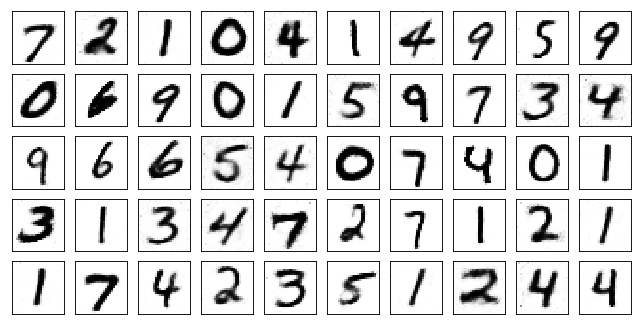

Test losses. G: 0.9137, D: 0.5437
Train Epoch: 171 [0/50000 (0%)]	Losses G: 0.8614, D: 0.5663
Train Epoch: 171 [5000/50000 (10%)]	Losses G: 1.1242, D: 0.5835
Train Epoch: 171 [10000/50000 (20%)]	Losses G: 1.1226, D: 0.6091
Train Epoch: 171 [15000/50000 (30%)]	Losses G: 0.9326, D: 0.5109
Train Epoch: 171 [20000/50000 (40%)]	Losses G: 0.8625, D: 0.5677
Train Epoch: 171 [25000/50000 (50%)]	Losses G: 1.0369, D: 0.6049
Train Epoch: 171 [30000/50000 (60%)]	Losses G: 1.1581, D: 0.5651
Train Epoch: 171 [35000/50000 (70%)]	Losses G: 0.9943, D: 0.6316
Train Epoch: 171 [40000/50000 (80%)]	Losses G: 1.1114, D: 0.5535
Train Epoch: 171 [45000/50000 (90%)]	Losses G: 0.9940, D: 0.5061
Train Epoch: 171 [50000/50000 (100%)]	Losses G: 1.0785, D: 0.5268


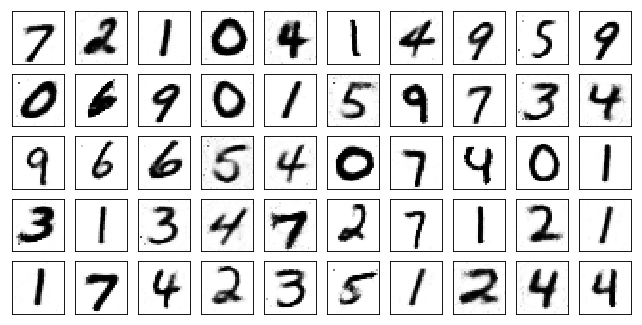

Test losses. G: 0.9989, D: 0.5354
Train Epoch: 172 [0/50000 (0%)]	Losses G: 1.0571, D: 0.5151
Train Epoch: 172 [5000/50000 (10%)]	Losses G: 1.0339, D: 0.6595
Train Epoch: 172 [10000/50000 (20%)]	Losses G: 0.9928, D: 0.6312
Train Epoch: 172 [15000/50000 (30%)]	Losses G: 1.0801, D: 0.5697
Train Epoch: 172 [20000/50000 (40%)]	Losses G: 1.0312, D: 0.5882
Train Epoch: 172 [25000/50000 (50%)]	Losses G: 1.0466, D: 0.6305
Train Epoch: 172 [30000/50000 (60%)]	Losses G: 1.2042, D: 0.5390
Train Epoch: 172 [35000/50000 (70%)]	Losses G: 1.0598, D: 0.6120
Train Epoch: 172 [40000/50000 (80%)]	Losses G: 0.9952, D: 0.6320
Train Epoch: 172 [45000/50000 (90%)]	Losses G: 1.3989, D: 0.6208
Train Epoch: 172 [50000/50000 (100%)]	Losses G: 1.0725, D: 0.5997


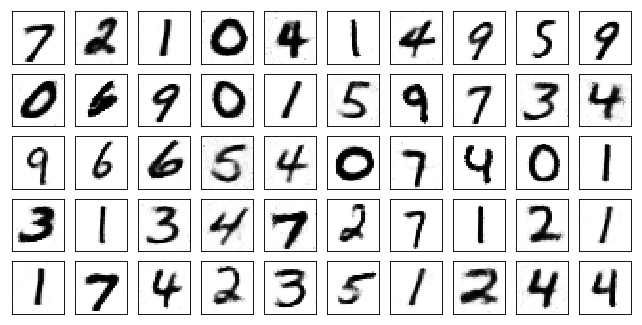

Test losses. G: 1.0381, D: 0.5288
Train Epoch: 173 [0/50000 (0%)]	Losses G: 1.0204, D: 0.6509
Train Epoch: 173 [5000/50000 (10%)]	Losses G: 1.2417, D: 0.5692
Train Epoch: 173 [10000/50000 (20%)]	Losses G: 0.9801, D: 0.6101
Train Epoch: 173 [15000/50000 (30%)]	Losses G: 0.9715, D: 0.5323
Train Epoch: 173 [20000/50000 (40%)]	Losses G: 1.0500, D: 0.5277
Train Epoch: 173 [25000/50000 (50%)]	Losses G: 1.0162, D: 0.5359
Train Epoch: 173 [30000/50000 (60%)]	Losses G: 0.9956, D: 0.6360
Train Epoch: 173 [35000/50000 (70%)]	Losses G: 1.1757, D: 0.6184
Train Epoch: 173 [40000/50000 (80%)]	Losses G: 1.0723, D: 0.5754
Train Epoch: 173 [45000/50000 (90%)]	Losses G: 1.0840, D: 0.7072
Train Epoch: 173 [50000/50000 (100%)]	Losses G: 1.1123, D: 0.5862


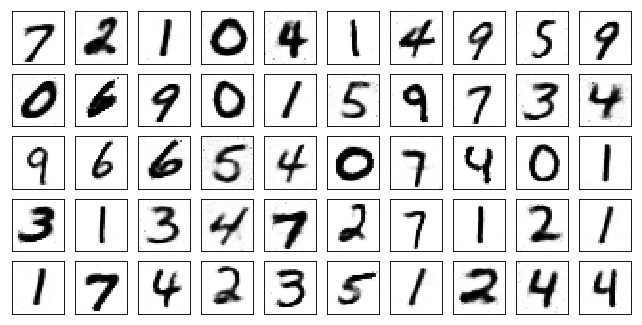

Test losses. G: 1.2027, D: 0.5782
Train Epoch: 174 [0/50000 (0%)]	Losses G: 1.1914, D: 0.6161
Train Epoch: 174 [5000/50000 (10%)]	Losses G: 1.0336, D: 0.6262
Train Epoch: 174 [10000/50000 (20%)]	Losses G: 1.0513, D: 0.5538
Train Epoch: 174 [15000/50000 (30%)]	Losses G: 0.9811, D: 0.6191
Train Epoch: 174 [20000/50000 (40%)]	Losses G: 1.2585, D: 0.5252
Train Epoch: 174 [25000/50000 (50%)]	Losses G: 0.8613, D: 0.6255
Train Epoch: 174 [30000/50000 (60%)]	Losses G: 1.0499, D: 0.6177
Train Epoch: 174 [35000/50000 (70%)]	Losses G: 1.1370, D: 0.5627
Train Epoch: 174 [40000/50000 (80%)]	Losses G: 1.2541, D: 0.5681
Train Epoch: 174 [45000/50000 (90%)]	Losses G: 1.3421, D: 0.5281
Train Epoch: 174 [50000/50000 (100%)]	Losses G: 0.8618, D: 0.6723


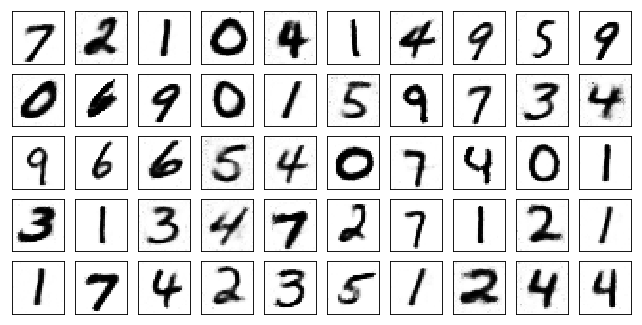

Test losses. G: 1.0056, D: 0.5614
Train Epoch: 175 [0/50000 (0%)]	Losses G: 1.0560, D: 0.6414
Train Epoch: 175 [5000/50000 (10%)]	Losses G: 1.0894, D: 0.6532
Train Epoch: 175 [10000/50000 (20%)]	Losses G: 1.0862, D: 0.6240
Train Epoch: 175 [15000/50000 (30%)]	Losses G: 1.0021, D: 0.5507
Train Epoch: 175 [20000/50000 (40%)]	Losses G: 1.2514, D: 0.5576
Train Epoch: 175 [25000/50000 (50%)]	Losses G: 1.0555, D: 0.5364
Train Epoch: 175 [30000/50000 (60%)]	Losses G: 0.8452, D: 0.5740
Train Epoch: 175 [35000/50000 (70%)]	Losses G: 1.0709, D: 0.6131
Train Epoch: 175 [40000/50000 (80%)]	Losses G: 1.1028, D: 0.5560
Train Epoch: 175 [45000/50000 (90%)]	Losses G: 1.0658, D: 0.5352
Train Epoch: 175 [50000/50000 (100%)]	Losses G: 0.9899, D: 0.5900


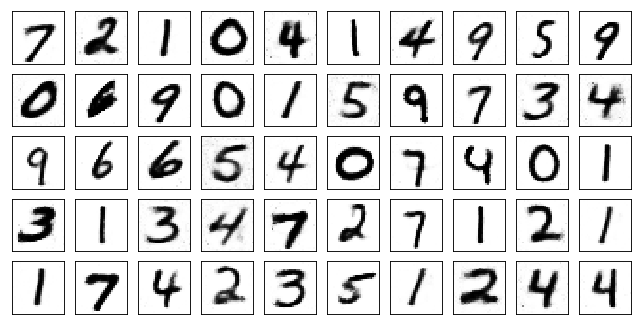

Test losses. G: 1.0851, D: 0.5509
Train Epoch: 176 [0/50000 (0%)]	Losses G: 1.1165, D: 0.5423
Train Epoch: 176 [5000/50000 (10%)]	Losses G: 1.0107, D: 0.6015
Train Epoch: 176 [10000/50000 (20%)]	Losses G: 1.1959, D: 0.6579
Train Epoch: 176 [15000/50000 (30%)]	Losses G: 1.1449, D: 0.5888
Train Epoch: 176 [20000/50000 (40%)]	Losses G: 1.1366, D: 0.5791
Train Epoch: 176 [25000/50000 (50%)]	Losses G: 1.0623, D: 0.5715
Train Epoch: 176 [30000/50000 (60%)]	Losses G: 0.9211, D: 0.6321
Train Epoch: 176 [35000/50000 (70%)]	Losses G: 1.0300, D: 0.5388
Train Epoch: 176 [40000/50000 (80%)]	Losses G: 0.7594, D: 0.5709
Train Epoch: 176 [45000/50000 (90%)]	Losses G: 0.8520, D: 0.5132
Train Epoch: 176 [50000/50000 (100%)]	Losses G: 1.2546, D: 0.5722


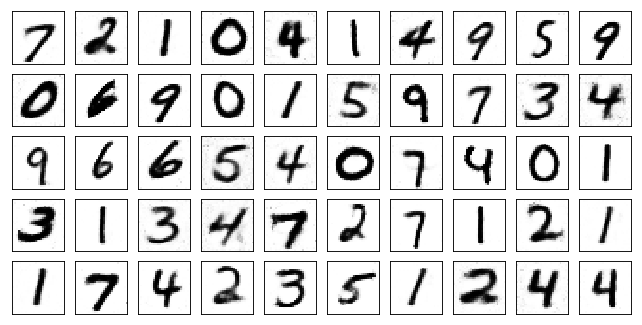

Test losses. G: 1.0288, D: 0.5447
Train Epoch: 177 [0/50000 (0%)]	Losses G: 1.0654, D: 0.5952
Train Epoch: 177 [5000/50000 (10%)]	Losses G: 0.8210, D: 0.5564
Train Epoch: 177 [10000/50000 (20%)]	Losses G: 1.0807, D: 0.5992
Train Epoch: 177 [15000/50000 (30%)]	Losses G: 0.7957, D: 0.5070
Train Epoch: 177 [20000/50000 (40%)]	Losses G: 1.1310, D: 0.5795
Train Epoch: 177 [25000/50000 (50%)]	Losses G: 0.9283, D: 0.6458
Train Epoch: 177 [30000/50000 (60%)]	Losses G: 1.0219, D: 0.5837
Train Epoch: 177 [35000/50000 (70%)]	Losses G: 1.1869, D: 0.6060
Train Epoch: 177 [40000/50000 (80%)]	Losses G: 1.1189, D: 0.5120
Train Epoch: 177 [45000/50000 (90%)]	Losses G: 0.9082, D: 0.5618
Train Epoch: 177 [50000/50000 (100%)]	Losses G: 1.2919, D: 0.5933


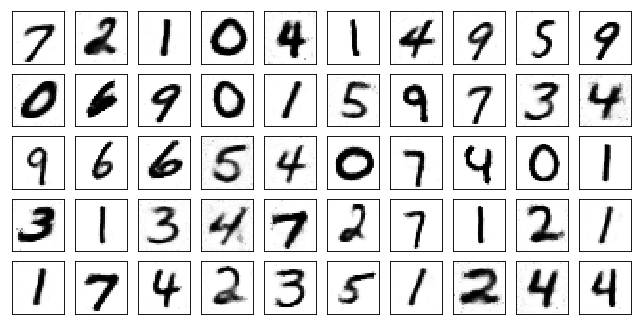

Test losses. G: 1.0503, D: 0.5343
Train Epoch: 178 [0/50000 (0%)]	Losses G: 1.1418, D: 0.5578
Train Epoch: 178 [5000/50000 (10%)]	Losses G: 1.0289, D: 0.5142
Train Epoch: 178 [10000/50000 (20%)]	Losses G: 0.9544, D: 0.6084
Train Epoch: 178 [15000/50000 (30%)]	Losses G: 1.0377, D: 0.5326
Train Epoch: 178 [20000/50000 (40%)]	Losses G: 1.1019, D: 0.6243
Train Epoch: 178 [25000/50000 (50%)]	Losses G: 1.0123, D: 0.5905
Train Epoch: 178 [30000/50000 (60%)]	Losses G: 0.8082, D: 0.5928
Train Epoch: 178 [35000/50000 (70%)]	Losses G: 0.8808, D: 0.5802
Train Epoch: 178 [40000/50000 (80%)]	Losses G: 1.0270, D: 0.5973
Train Epoch: 178 [45000/50000 (90%)]	Losses G: 1.0181, D: 0.5866
Train Epoch: 178 [50000/50000 (100%)]	Losses G: 0.9553, D: 0.6315


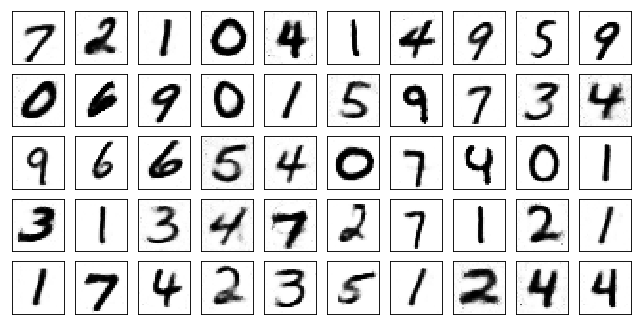

Test losses. G: 0.9651, D: 0.5429
Train Epoch: 179 [0/50000 (0%)]	Losses G: 0.8674, D: 0.5418
Train Epoch: 179 [5000/50000 (10%)]	Losses G: 0.9932, D: 0.5714
Train Epoch: 179 [10000/50000 (20%)]	Losses G: 1.0859, D: 0.5832
Train Epoch: 179 [15000/50000 (30%)]	Losses G: 0.9857, D: 0.5945
Train Epoch: 179 [20000/50000 (40%)]	Losses G: 1.1865, D: 0.6168
Train Epoch: 179 [25000/50000 (50%)]	Losses G: 1.0779, D: 0.6251
Train Epoch: 179 [30000/50000 (60%)]	Losses G: 1.0101, D: 0.5672
Train Epoch: 179 [35000/50000 (70%)]	Losses G: 0.8402, D: 0.5451
Train Epoch: 179 [40000/50000 (80%)]	Losses G: 1.1302, D: 0.6123
Train Epoch: 179 [45000/50000 (90%)]	Losses G: 0.9114, D: 0.5589
Train Epoch: 179 [50000/50000 (100%)]	Losses G: 1.0859, D: 0.5833


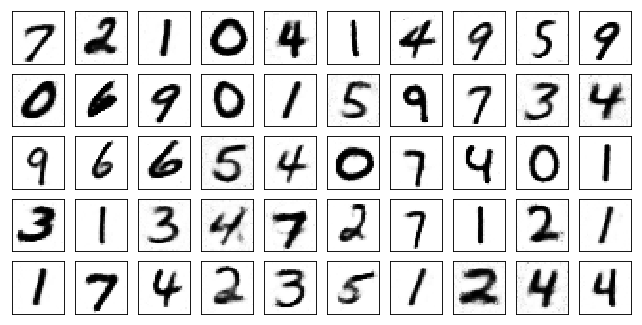

Test losses. G: 1.0700, D: 0.5672
Train Epoch: 180 [0/50000 (0%)]	Losses G: 1.0550, D: 0.5322
Train Epoch: 180 [5000/50000 (10%)]	Losses G: 1.1265, D: 0.5430
Train Epoch: 180 [10000/50000 (20%)]	Losses G: 0.9183, D: 0.5751
Train Epoch: 180 [15000/50000 (30%)]	Losses G: 0.9626, D: 0.5791
Train Epoch: 180 [20000/50000 (40%)]	Losses G: 0.7994, D: 0.6027
Train Epoch: 180 [25000/50000 (50%)]	Losses G: 0.9159, D: 0.5480
Train Epoch: 180 [30000/50000 (60%)]	Losses G: 0.8726, D: 0.5684
Train Epoch: 180 [35000/50000 (70%)]	Losses G: 0.9400, D: 0.6248
Train Epoch: 180 [40000/50000 (80%)]	Losses G: 1.1615, D: 0.6526
Train Epoch: 180 [45000/50000 (90%)]	Losses G: 1.3804, D: 0.5164
Train Epoch: 180 [50000/50000 (100%)]	Losses G: 1.1630, D: 0.5349


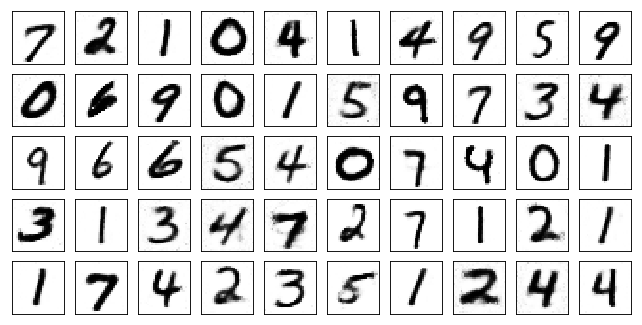

Test losses. G: 1.0717, D: 0.5301
Train Epoch: 181 [0/50000 (0%)]	Losses G: 1.0911, D: 0.5825
Train Epoch: 181 [5000/50000 (10%)]	Losses G: 1.1541, D: 0.6014
Train Epoch: 181 [10000/50000 (20%)]	Losses G: 0.9562, D: 0.6044
Train Epoch: 181 [15000/50000 (30%)]	Losses G: 1.0100, D: 0.5436
Train Epoch: 181 [20000/50000 (40%)]	Losses G: 0.9133, D: 0.5850
Train Epoch: 181 [25000/50000 (50%)]	Losses G: 0.9214, D: 0.6089
Train Epoch: 181 [30000/50000 (60%)]	Losses G: 1.1166, D: 0.5836
Train Epoch: 181 [35000/50000 (70%)]	Losses G: 1.0096, D: 0.6068
Train Epoch: 181 [40000/50000 (80%)]	Losses G: 1.0856, D: 0.6327
Train Epoch: 181 [45000/50000 (90%)]	Losses G: 1.0724, D: 0.5890
Train Epoch: 181 [50000/50000 (100%)]	Losses G: 1.1668, D: 0.6151


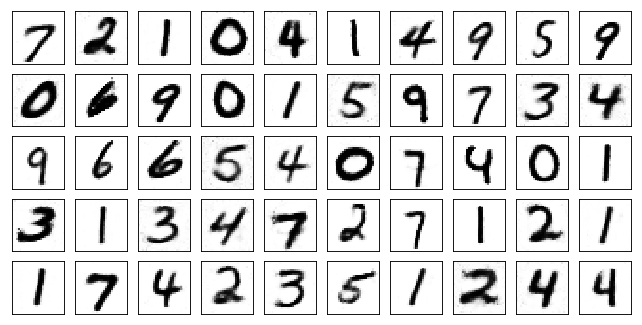

Test losses. G: 1.0119, D: 0.5198
Train Epoch: 182 [0/50000 (0%)]	Losses G: 0.9959, D: 0.5400
Train Epoch: 182 [5000/50000 (10%)]	Losses G: 1.2246, D: 0.5812
Train Epoch: 182 [10000/50000 (20%)]	Losses G: 1.0413, D: 0.5757
Train Epoch: 182 [15000/50000 (30%)]	Losses G: 1.0761, D: 0.5664
Train Epoch: 182 [20000/50000 (40%)]	Losses G: 1.0509, D: 0.5500
Train Epoch: 182 [25000/50000 (50%)]	Losses G: 1.1350, D: 0.6278
Train Epoch: 182 [30000/50000 (60%)]	Losses G: 0.9951, D: 0.5828
Train Epoch: 182 [35000/50000 (70%)]	Losses G: 1.0394, D: 0.5537
Train Epoch: 182 [40000/50000 (80%)]	Losses G: 0.9659, D: 0.5636
Train Epoch: 182 [45000/50000 (90%)]	Losses G: 1.0844, D: 0.5856
Train Epoch: 182 [50000/50000 (100%)]	Losses G: 1.1082, D: 0.6388


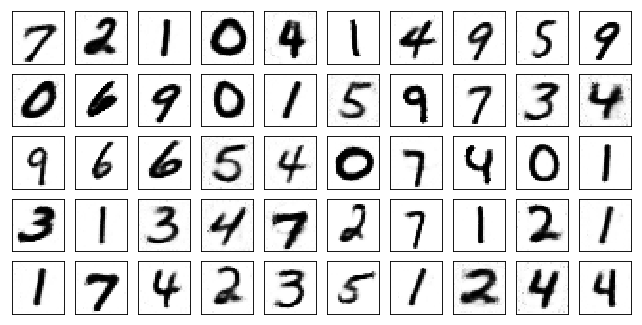

Test losses. G: 1.1608, D: 0.5457
Train Epoch: 183 [0/50000 (0%)]	Losses G: 1.0882, D: 0.5457
Train Epoch: 183 [5000/50000 (10%)]	Losses G: 1.0834, D: 0.6546
Train Epoch: 183 [10000/50000 (20%)]	Losses G: 1.1982, D: 0.5677
Train Epoch: 183 [15000/50000 (30%)]	Losses G: 1.0878, D: 0.5432
Train Epoch: 183 [20000/50000 (40%)]	Losses G: 0.9151, D: 0.5904
Train Epoch: 183 [25000/50000 (50%)]	Losses G: 0.9693, D: 0.6387
Train Epoch: 183 [30000/50000 (60%)]	Losses G: 1.2275, D: 0.5758
Train Epoch: 183 [35000/50000 (70%)]	Losses G: 0.9150, D: 0.6056
Train Epoch: 183 [40000/50000 (80%)]	Losses G: 0.8627, D: 0.5134
Train Epoch: 183 [45000/50000 (90%)]	Losses G: 1.0590, D: 0.6724
Train Epoch: 183 [50000/50000 (100%)]	Losses G: 1.1069, D: 0.5418


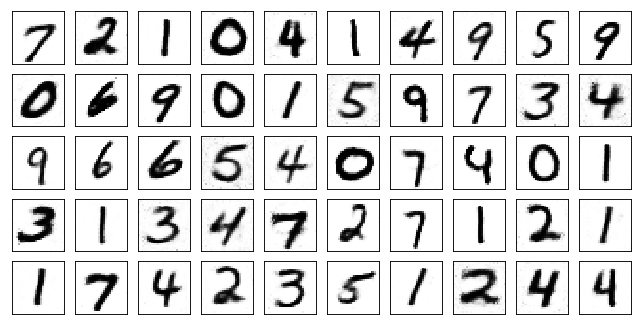

Test losses. G: 0.9369, D: 0.5486
Train Epoch: 184 [0/50000 (0%)]	Losses G: 0.9700, D: 0.6541
Train Epoch: 184 [5000/50000 (10%)]	Losses G: 1.1886, D: 0.5111
Train Epoch: 184 [10000/50000 (20%)]	Losses G: 0.9795, D: 0.5749
Train Epoch: 184 [15000/50000 (30%)]	Losses G: 1.0979, D: 0.5925
Train Epoch: 184 [20000/50000 (40%)]	Losses G: 1.0279, D: 0.5524
Train Epoch: 184 [25000/50000 (50%)]	Losses G: 1.0696, D: 0.5162
Train Epoch: 184 [30000/50000 (60%)]	Losses G: 1.1635, D: 0.5533
Train Epoch: 184 [35000/50000 (70%)]	Losses G: 1.0590, D: 0.6135
Train Epoch: 184 [40000/50000 (80%)]	Losses G: 0.8966, D: 0.6489
Train Epoch: 184 [45000/50000 (90%)]	Losses G: 0.9387, D: 0.6589
Train Epoch: 184 [50000/50000 (100%)]	Losses G: 1.0563, D: 0.6574


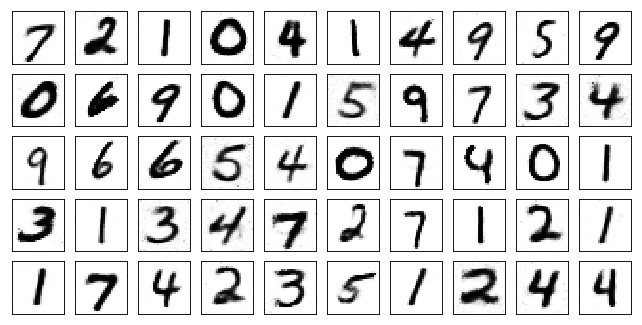

Test losses. G: 1.1293, D: 0.5419
Train Epoch: 185 [0/50000 (0%)]	Losses G: 1.2644, D: 0.6417
Train Epoch: 185 [5000/50000 (10%)]	Losses G: 1.0070, D: 0.6380
Train Epoch: 185 [10000/50000 (20%)]	Losses G: 1.1434, D: 0.5519
Train Epoch: 185 [15000/50000 (30%)]	Losses G: 1.0145, D: 0.6189
Train Epoch: 185 [20000/50000 (40%)]	Losses G: 1.0020, D: 0.6602
Train Epoch: 185 [25000/50000 (50%)]	Losses G: 0.8992, D: 0.6100
Train Epoch: 185 [30000/50000 (60%)]	Losses G: 0.8716, D: 0.5773
Train Epoch: 185 [35000/50000 (70%)]	Losses G: 1.1360, D: 0.7027
Train Epoch: 185 [40000/50000 (80%)]	Losses G: 1.4069, D: 0.5440
Train Epoch: 185 [45000/50000 (90%)]	Losses G: 0.9669, D: 0.6087
Train Epoch: 185 [50000/50000 (100%)]	Losses G: 1.1065, D: 0.6038


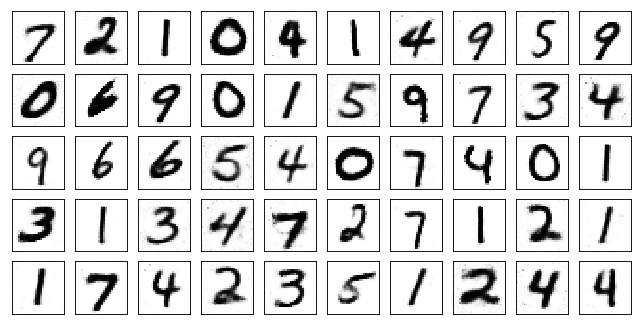

Test losses. G: 1.1041, D: 0.5377
Train Epoch: 186 [0/50000 (0%)]	Losses G: 1.1012, D: 0.5309
Train Epoch: 186 [5000/50000 (10%)]	Losses G: 1.0089, D: 0.5195
Train Epoch: 186 [10000/50000 (20%)]	Losses G: 0.9908, D: 0.5949
Train Epoch: 186 [15000/50000 (30%)]	Losses G: 1.0599, D: 0.6126
Train Epoch: 186 [20000/50000 (40%)]	Losses G: 1.1628, D: 0.6477
Train Epoch: 186 [25000/50000 (50%)]	Losses G: 1.0015, D: 0.5861
Train Epoch: 186 [30000/50000 (60%)]	Losses G: 1.1802, D: 0.5954
Train Epoch: 186 [35000/50000 (70%)]	Losses G: 1.3476, D: 0.5593
Train Epoch: 186 [40000/50000 (80%)]	Losses G: 0.9924, D: 0.6309
Train Epoch: 186 [45000/50000 (90%)]	Losses G: 1.1559, D: 0.5954
Train Epoch: 186 [50000/50000 (100%)]	Losses G: 1.1644, D: 0.5273


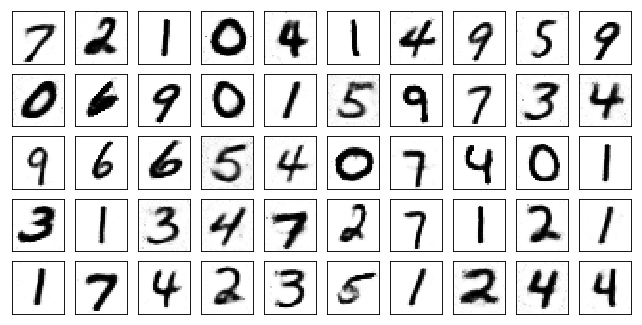

Test losses. G: 1.1544, D: 0.5645
Train Epoch: 187 [0/50000 (0%)]	Losses G: 1.2520, D: 0.5612
Train Epoch: 187 [5000/50000 (10%)]	Losses G: 0.9400, D: 0.5986
Train Epoch: 187 [10000/50000 (20%)]	Losses G: 0.9801, D: 0.5674
Train Epoch: 187 [15000/50000 (30%)]	Losses G: 0.9075, D: 0.5735
Train Epoch: 187 [20000/50000 (40%)]	Losses G: 1.0257, D: 0.5953
Train Epoch: 187 [25000/50000 (50%)]	Losses G: 1.0785, D: 0.6065
Train Epoch: 187 [30000/50000 (60%)]	Losses G: 1.1652, D: 0.6128
Train Epoch: 187 [35000/50000 (70%)]	Losses G: 1.0471, D: 0.5482
Train Epoch: 187 [40000/50000 (80%)]	Losses G: 1.0025, D: 0.5578
Train Epoch: 187 [45000/50000 (90%)]	Losses G: 1.0072, D: 0.5360
Train Epoch: 187 [50000/50000 (100%)]	Losses G: 1.1862, D: 0.5593


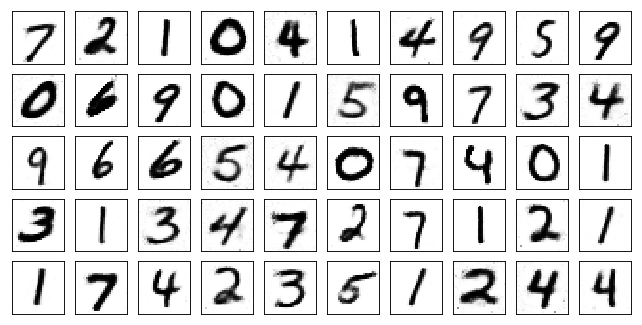

Test losses. G: 1.0893, D: 0.5517
Train Epoch: 188 [0/50000 (0%)]	Losses G: 0.9506, D: 0.6639
Train Epoch: 188 [5000/50000 (10%)]	Losses G: 1.1801, D: 0.5946
Train Epoch: 188 [10000/50000 (20%)]	Losses G: 1.1199, D: 0.5861
Train Epoch: 188 [15000/50000 (30%)]	Losses G: 1.1158, D: 0.5549
Train Epoch: 188 [20000/50000 (40%)]	Losses G: 0.9652, D: 0.5611
Train Epoch: 188 [25000/50000 (50%)]	Losses G: 1.1684, D: 0.6158
Train Epoch: 188 [30000/50000 (60%)]	Losses G: 1.0827, D: 0.5167
Train Epoch: 188 [35000/50000 (70%)]	Losses G: 1.1563, D: 0.5649
Train Epoch: 188 [40000/50000 (80%)]	Losses G: 1.2113, D: 0.5317
Train Epoch: 188 [45000/50000 (90%)]	Losses G: 1.1411, D: 0.5760
Train Epoch: 188 [50000/50000 (100%)]	Losses G: 1.0892, D: 0.5816


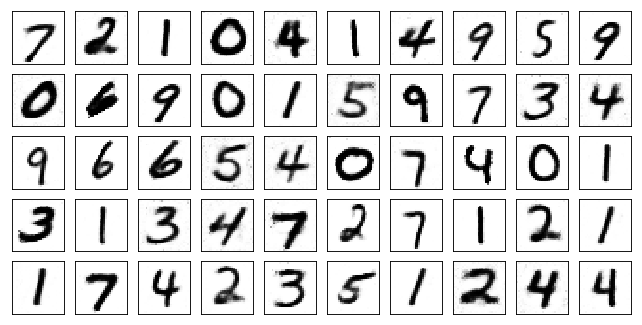

Test losses. G: 1.0242, D: 0.5373
Train Epoch: 189 [0/50000 (0%)]	Losses G: 1.0601, D: 0.6615
Train Epoch: 189 [5000/50000 (10%)]	Losses G: 1.0451, D: 0.5928
Train Epoch: 189 [10000/50000 (20%)]	Losses G: 1.0801, D: 0.6107
Train Epoch: 189 [15000/50000 (30%)]	Losses G: 0.9018, D: 0.5716
Train Epoch: 189 [20000/50000 (40%)]	Losses G: 1.0285, D: 0.5282
Train Epoch: 189 [25000/50000 (50%)]	Losses G: 1.0361, D: 0.5627
Train Epoch: 189 [30000/50000 (60%)]	Losses G: 1.1409, D: 0.5094
Train Epoch: 189 [35000/50000 (70%)]	Losses G: 1.0696, D: 0.5104
Train Epoch: 189 [40000/50000 (80%)]	Losses G: 1.0351, D: 0.5757
Train Epoch: 189 [45000/50000 (90%)]	Losses G: 0.9587, D: 0.5806
Train Epoch: 189 [50000/50000 (100%)]	Losses G: 1.0597, D: 0.6691


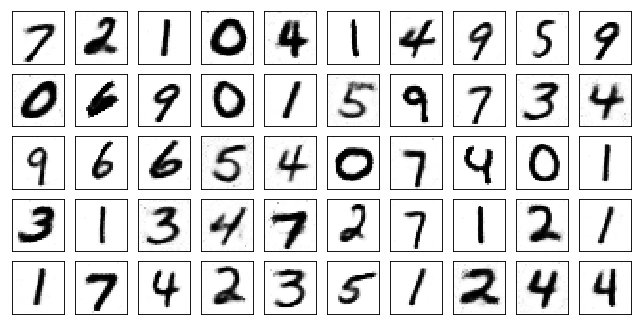

Test losses. G: 1.1523, D: 0.5521
Train Epoch: 190 [0/50000 (0%)]	Losses G: 0.9980, D: 0.6366
Train Epoch: 190 [5000/50000 (10%)]	Losses G: 0.9541, D: 0.6595
Train Epoch: 190 [10000/50000 (20%)]	Losses G: 1.1025, D: 0.5889
Train Epoch: 190 [15000/50000 (30%)]	Losses G: 0.8825, D: 0.5290
Train Epoch: 190 [20000/50000 (40%)]	Losses G: 1.2288, D: 0.5248
Train Epoch: 190 [25000/50000 (50%)]	Losses G: 1.1559, D: 0.5171
Train Epoch: 190 [30000/50000 (60%)]	Losses G: 0.9697, D: 0.5563
Train Epoch: 190 [35000/50000 (70%)]	Losses G: 1.1234, D: 0.6596
Train Epoch: 190 [40000/50000 (80%)]	Losses G: 1.0184, D: 0.6038
Train Epoch: 190 [45000/50000 (90%)]	Losses G: 1.0747, D: 0.5537
Train Epoch: 190 [50000/50000 (100%)]	Losses G: 1.0849, D: 0.6378


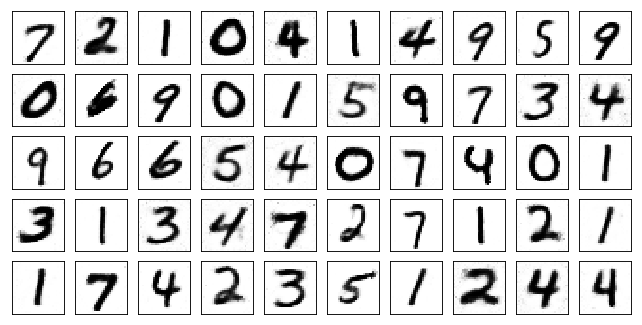

Test losses. G: 1.1229, D: 0.5428
Train Epoch: 191 [0/50000 (0%)]	Losses G: 1.0007, D: 0.6192
Train Epoch: 191 [5000/50000 (10%)]	Losses G: 1.0493, D: 0.6514
Train Epoch: 191 [10000/50000 (20%)]	Losses G: 1.0827, D: 0.6013
Train Epoch: 191 [15000/50000 (30%)]	Losses G: 1.1062, D: 0.5100
Train Epoch: 191 [20000/50000 (40%)]	Losses G: 0.9346, D: 0.5670
Train Epoch: 191 [25000/50000 (50%)]	Losses G: 1.2011, D: 0.5233
Train Epoch: 191 [30000/50000 (60%)]	Losses G: 0.8931, D: 0.6610
Train Epoch: 191 [35000/50000 (70%)]	Losses G: 1.0760, D: 0.5680
Train Epoch: 191 [40000/50000 (80%)]	Losses G: 1.0255, D: 0.5457
Train Epoch: 191 [45000/50000 (90%)]	Losses G: 1.1666, D: 0.5626
Train Epoch: 191 [50000/50000 (100%)]	Losses G: 1.0002, D: 0.5088


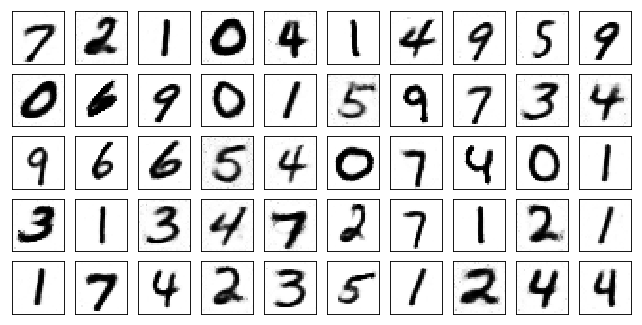

Test losses. G: 1.1521, D: 0.5290
Train Epoch: 192 [0/50000 (0%)]	Losses G: 1.0012, D: 0.5796
Train Epoch: 192 [5000/50000 (10%)]	Losses G: 1.1496, D: 0.5534
Train Epoch: 192 [10000/50000 (20%)]	Losses G: 0.9728, D: 0.5557
Train Epoch: 192 [15000/50000 (30%)]	Losses G: 1.1592, D: 0.5104
Train Epoch: 192 [20000/50000 (40%)]	Losses G: 0.9824, D: 0.6374
Train Epoch: 192 [25000/50000 (50%)]	Losses G: 1.0177, D: 0.6306
Train Epoch: 192 [30000/50000 (60%)]	Losses G: 1.0215, D: 0.5072
Train Epoch: 192 [35000/50000 (70%)]	Losses G: 0.9787, D: 0.5944
Train Epoch: 192 [40000/50000 (80%)]	Losses G: 1.1368, D: 0.5203
Train Epoch: 192 [45000/50000 (90%)]	Losses G: 0.8414, D: 0.6673
Train Epoch: 192 [50000/50000 (100%)]	Losses G: 0.8594, D: 0.6510


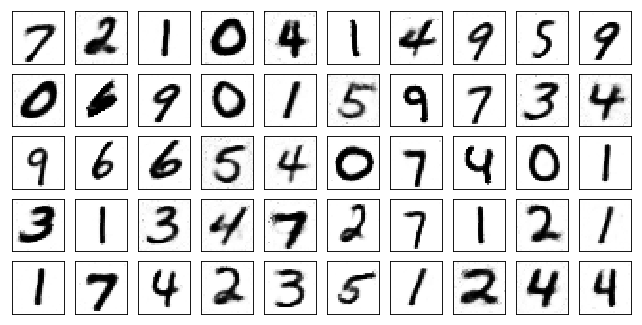

Test losses. G: 1.0237, D: 0.5232
Train Epoch: 193 [0/50000 (0%)]	Losses G: 1.0173, D: 0.5235
Train Epoch: 193 [5000/50000 (10%)]	Losses G: 1.1863, D: 0.6383
Train Epoch: 193 [10000/50000 (20%)]	Losses G: 1.1981, D: 0.5562
Train Epoch: 193 [15000/50000 (30%)]	Losses G: 0.9885, D: 0.5445
Train Epoch: 193 [20000/50000 (40%)]	Losses G: 1.1136, D: 0.5937
Train Epoch: 193 [25000/50000 (50%)]	Losses G: 1.0914, D: 0.5389
Train Epoch: 193 [30000/50000 (60%)]	Losses G: 0.8811, D: 0.6264
Train Epoch: 193 [35000/50000 (70%)]	Losses G: 1.0901, D: 0.5651
Train Epoch: 193 [40000/50000 (80%)]	Losses G: 1.2329, D: 0.5333
Train Epoch: 193 [45000/50000 (90%)]	Losses G: 1.3389, D: 0.5302
Train Epoch: 193 [50000/50000 (100%)]	Losses G: 1.1149, D: 0.6427


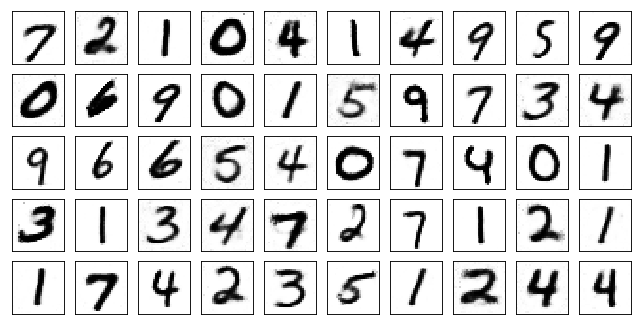

Test losses. G: 1.0152, D: 0.5441
Train Epoch: 194 [0/50000 (0%)]	Losses G: 1.0832, D: 0.5430
Train Epoch: 194 [5000/50000 (10%)]	Losses G: 1.1456, D: 0.5751
Train Epoch: 194 [10000/50000 (20%)]	Losses G: 1.0742, D: 0.5964
Train Epoch: 194 [15000/50000 (30%)]	Losses G: 0.9722, D: 0.5892
Train Epoch: 194 [20000/50000 (40%)]	Losses G: 1.2057, D: 0.5391
Train Epoch: 194 [25000/50000 (50%)]	Losses G: 1.1052, D: 0.5974
Train Epoch: 194 [30000/50000 (60%)]	Losses G: 1.0073, D: 0.5955
Train Epoch: 194 [35000/50000 (70%)]	Losses G: 1.0028, D: 0.5520
Train Epoch: 194 [40000/50000 (80%)]	Losses G: 0.9699, D: 0.6661
Train Epoch: 194 [45000/50000 (90%)]	Losses G: 1.0237, D: 0.6051
Train Epoch: 194 [50000/50000 (100%)]	Losses G: 1.3022, D: 0.5589


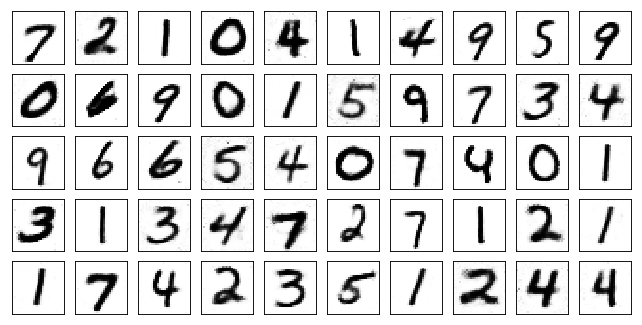

Test losses. G: 1.1688, D: 0.5398
Train Epoch: 195 [0/50000 (0%)]	Losses G: 1.2028, D: 0.5944
Train Epoch: 195 [5000/50000 (10%)]	Losses G: 1.1734, D: 0.5867
Train Epoch: 195 [10000/50000 (20%)]	Losses G: 0.8819, D: 0.5728
Train Epoch: 195 [15000/50000 (30%)]	Losses G: 1.2054, D: 0.5997
Train Epoch: 195 [20000/50000 (40%)]	Losses G: 1.0204, D: 0.5535
Train Epoch: 195 [25000/50000 (50%)]	Losses G: 1.1627, D: 0.5272
Train Epoch: 195 [30000/50000 (60%)]	Losses G: 1.2714, D: 0.5621
Train Epoch: 195 [35000/50000 (70%)]	Losses G: 1.1141, D: 0.5660
Train Epoch: 195 [40000/50000 (80%)]	Losses G: 0.9535, D: 0.5624
Train Epoch: 195 [45000/50000 (90%)]	Losses G: 1.0375, D: 0.5334
Train Epoch: 195 [50000/50000 (100%)]	Losses G: 0.9763, D: 0.5858


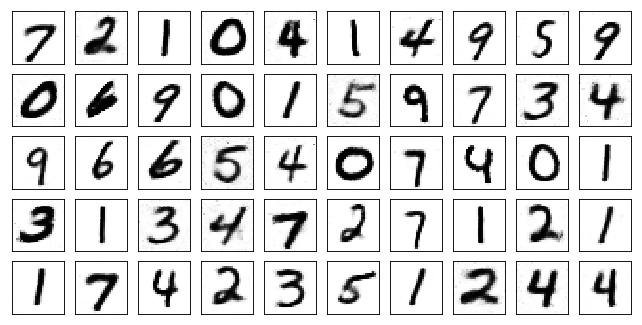

Test losses. G: 1.1642, D: 0.5250
Train Epoch: 196 [0/50000 (0%)]	Losses G: 1.1280, D: 0.6775
Train Epoch: 196 [5000/50000 (10%)]	Losses G: 1.2017, D: 0.5839
Train Epoch: 196 [10000/50000 (20%)]	Losses G: 1.0033, D: 0.5490
Train Epoch: 196 [15000/50000 (30%)]	Losses G: 0.9932, D: 0.5084
Train Epoch: 196 [20000/50000 (40%)]	Losses G: 1.0135, D: 0.5351
Train Epoch: 196 [25000/50000 (50%)]	Losses G: 1.0188, D: 0.6066
Train Epoch: 196 [30000/50000 (60%)]	Losses G: 1.2423, D: 0.6294
Train Epoch: 196 [35000/50000 (70%)]	Losses G: 0.9386, D: 0.5812
Train Epoch: 196 [40000/50000 (80%)]	Losses G: 0.8950, D: 0.5267
Train Epoch: 196 [45000/50000 (90%)]	Losses G: 1.3997, D: 0.5880
Train Epoch: 196 [50000/50000 (100%)]	Losses G: 1.3089, D: 0.5920


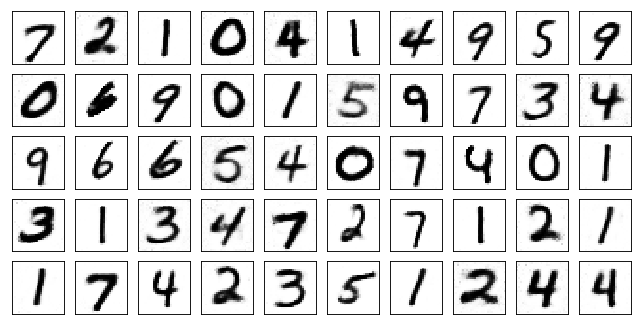

Test losses. G: 1.1004, D: 0.5389
Train Epoch: 197 [0/50000 (0%)]	Losses G: 0.8688, D: 0.6055
Train Epoch: 197 [5000/50000 (10%)]	Losses G: 1.0321, D: 0.5773
Train Epoch: 197 [10000/50000 (20%)]	Losses G: 0.9216, D: 0.6454
Train Epoch: 197 [15000/50000 (30%)]	Losses G: 0.9507, D: 0.6110
Train Epoch: 197 [20000/50000 (40%)]	Losses G: 1.0395, D: 0.5935
Train Epoch: 197 [25000/50000 (50%)]	Losses G: 1.0153, D: 0.5793
Train Epoch: 197 [30000/50000 (60%)]	Losses G: 1.0650, D: 0.6087
Train Epoch: 197 [35000/50000 (70%)]	Losses G: 1.1029, D: 0.5783
Train Epoch: 197 [40000/50000 (80%)]	Losses G: 1.1452, D: 0.5389
Train Epoch: 197 [45000/50000 (90%)]	Losses G: 1.0923, D: 0.5988
Train Epoch: 197 [50000/50000 (100%)]	Losses G: 0.9843, D: 0.6306


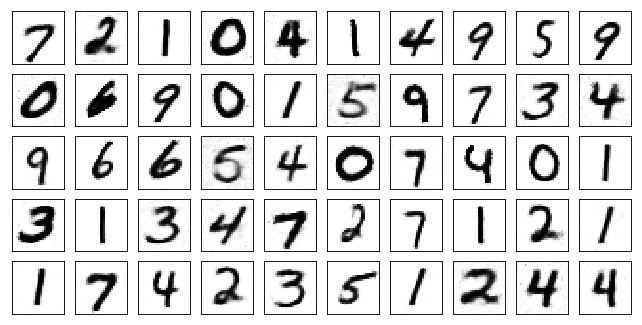

Test losses. G: 1.0357, D: 0.5321
Train Epoch: 198 [0/50000 (0%)]	Losses G: 0.9535, D: 0.6309
Train Epoch: 198 [5000/50000 (10%)]	Losses G: 0.9901, D: 0.6119
Train Epoch: 198 [10000/50000 (20%)]	Losses G: 1.1374, D: 0.5643
Train Epoch: 198 [15000/50000 (30%)]	Losses G: 1.1345, D: 0.5503
Train Epoch: 198 [20000/50000 (40%)]	Losses G: 1.0934, D: 0.5950
Train Epoch: 198 [25000/50000 (50%)]	Losses G: 0.9078, D: 0.4993
Train Epoch: 198 [30000/50000 (60%)]	Losses G: 0.9158, D: 0.5715
Train Epoch: 198 [35000/50000 (70%)]	Losses G: 0.8977, D: 0.5487
Train Epoch: 198 [40000/50000 (80%)]	Losses G: 1.1656, D: 0.5622
Train Epoch: 198 [45000/50000 (90%)]	Losses G: 1.0382, D: 0.5788
Train Epoch: 198 [50000/50000 (100%)]	Losses G: 1.0268, D: 0.5977


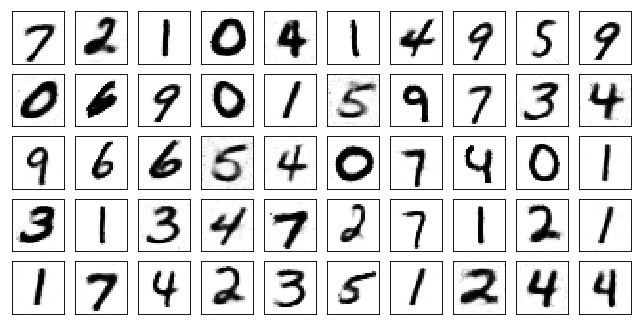

Test losses. G: 1.0854, D: 0.5377
Train Epoch: 199 [0/50000 (0%)]	Losses G: 1.0430, D: 0.5474
Train Epoch: 199 [5000/50000 (10%)]	Losses G: 1.0609, D: 0.6112
Train Epoch: 199 [10000/50000 (20%)]	Losses G: 1.0170, D: 0.5748
Train Epoch: 199 [15000/50000 (30%)]	Losses G: 0.9716, D: 0.6038
Train Epoch: 199 [20000/50000 (40%)]	Losses G: 0.9475, D: 0.5970
Train Epoch: 199 [25000/50000 (50%)]	Losses G: 1.1935, D: 0.5643
Train Epoch: 199 [30000/50000 (60%)]	Losses G: 0.9791, D: 0.5893
Train Epoch: 199 [35000/50000 (70%)]	Losses G: 1.1277, D: 0.5728
Train Epoch: 199 [40000/50000 (80%)]	Losses G: 1.2683, D: 0.6038
Train Epoch: 199 [45000/50000 (90%)]	Losses G: 1.0569, D: 0.4902
Train Epoch: 199 [50000/50000 (100%)]	Losses G: 0.8652, D: 0.5883


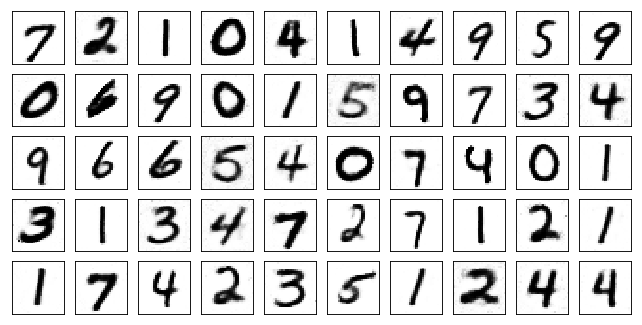

Test losses. G: 1.0140, D: 0.5326
Train Epoch: 200 [0/50000 (0%)]	Losses G: 1.0650, D: 0.6317
Train Epoch: 200 [5000/50000 (10%)]	Losses G: 1.1496, D: 0.5746
Train Epoch: 200 [10000/50000 (20%)]	Losses G: 1.0997, D: 0.5586
Train Epoch: 200 [15000/50000 (30%)]	Losses G: 1.0839, D: 0.5004
Train Epoch: 200 [20000/50000 (40%)]	Losses G: 1.1483, D: 0.6018
Train Epoch: 200 [25000/50000 (50%)]	Losses G: 0.9958, D: 0.5714
Train Epoch: 200 [30000/50000 (60%)]	Losses G: 1.0616, D: 0.5693
Train Epoch: 200 [35000/50000 (70%)]	Losses G: 1.0029, D: 0.6131
Train Epoch: 200 [40000/50000 (80%)]	Losses G: 1.0518, D: 0.4913
Train Epoch: 200 [45000/50000 (90%)]	Losses G: 1.0503, D: 0.5793
Train Epoch: 200 [50000/50000 (100%)]	Losses G: 1.0737, D: 0.6163


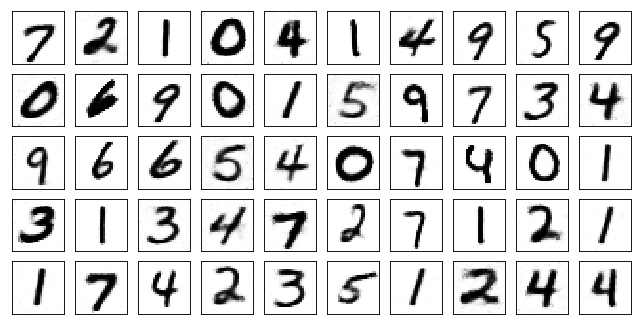

Test losses. G: 1.1246, D: 0.5363


In [13]:
for epoch in range(1, 201):
    G.train()
    D.train()
    train(epoch, G, D, train_log)
    G.eval()
    D.eval()
    test(G, D, valid_loader, epoch, test_log)

In [14]:
torch.save(G, './generator_2')
torch.save(D, './discriminator_2')

/Users/aleksey/anaconda3/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type FullyConnected. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [15]:
G = torch.load('./generator_2')

In [16]:
def show_generated_samples(cl):
    pred_z = torch.randn((50, 100))
    pred_cl = torch.ones(50, dtype=torch.long) * cl
    pred_oh = one_hot(y=pred_cl, batch_size=50)
    pred_h = torch.cat((pred_z, pred_oh), 1) 
       
    pred_gen = G(pred_h)
    generated = pred_gen.view(-1, 1, 28, 28).clamp(0, 1).data.numpy()    
    plot_mnist(generated, (5, 10))

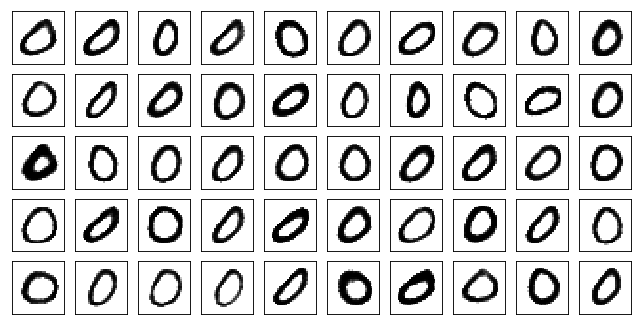

In [17]:
show_generated_samples(0)

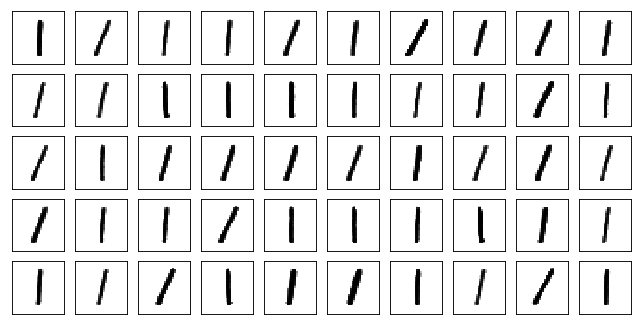

In [18]:
show_generated_samples(1)

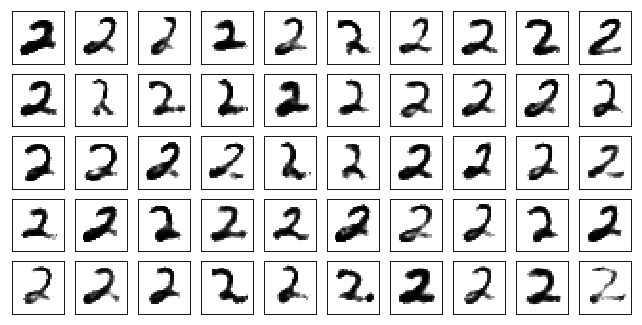

In [19]:
show_generated_samples(2)

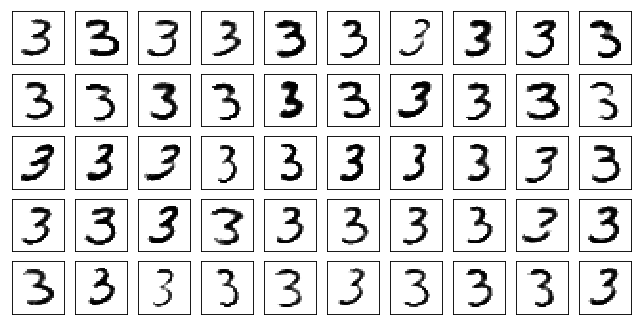

In [20]:
show_generated_samples(3)

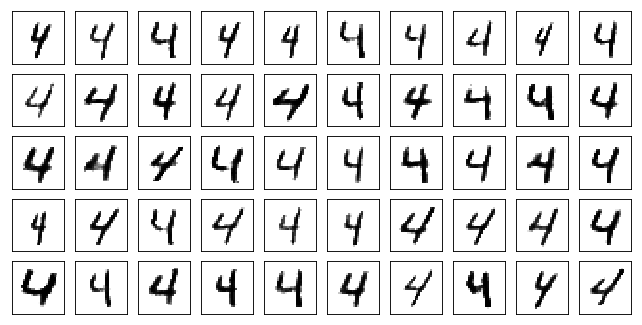

In [21]:
show_generated_samples(4)

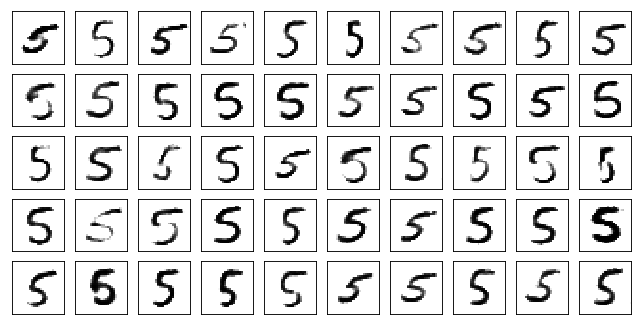

In [22]:
show_generated_samples(5)

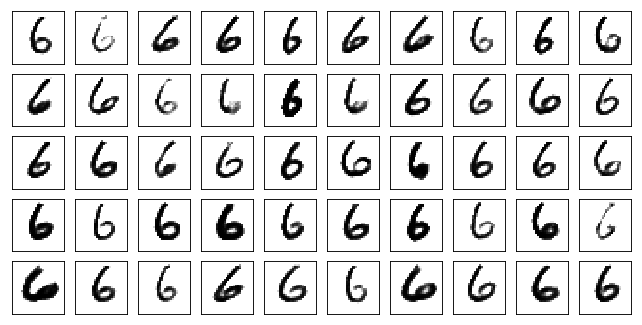

In [23]:
show_generated_samples(6)

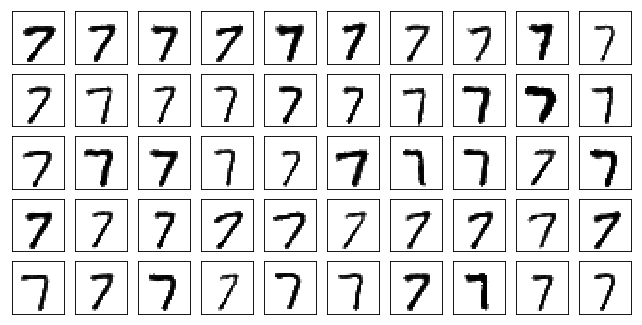

In [24]:
show_generated_samples(7)

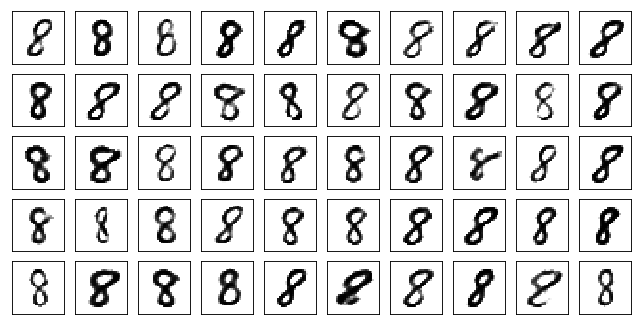

In [28]:
show_generated_samples(8)

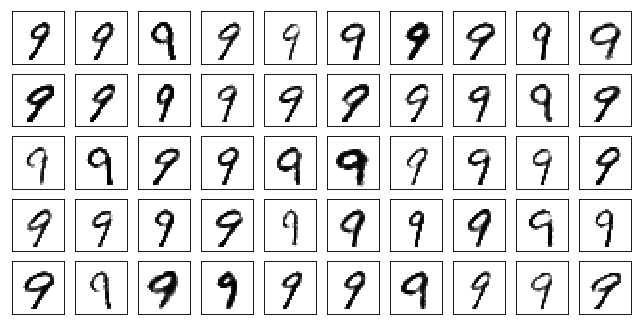

In [29]:
show_generated_samples(9)

### Вывод всех цифр в одном стиле

In [30]:
def show_common_style_images():
    images = torch.empty((0,0))
    for style in range(0,10):
        pred_z = torch.randn((1, 100))    
        for cl in range(0,10):
            pred_cl = torch.ones(1, dtype=torch.long) * cl
            pred_oh = one_hot(y=pred_cl, batch_size=1)
            pred_h = torch.cat((pred_z, pred_oh), 1) 

            img = G(pred_h)
            images = torch.cat((images, img), 0)
        
    to_plot = ((images.view(-1, 1, 28, 28)+1)*0.5).clamp(0, 1).data.numpy()
    plot_mnist(to_plot, (10, 10))

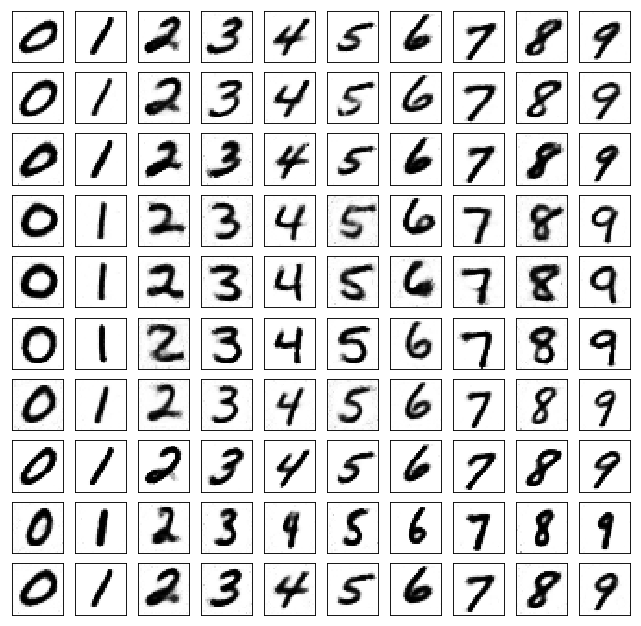

In [34]:
show_common_style_images()